<a href="https://colab.research.google.com/github/sanyamjain789523/personalProjects/blob/main/Data_synthesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# use it to mount to your drive directory
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir(f'{relativePath}src')

In [ ]:
! pip install -r ../requirements.txt

     |████████████████████████████████| 15.3MB 187kB/s 
     |████████████████████████████████| 6.8MB 24.5MB/s 
     |████████████████████████████████| 81kB 7.8MB/s 
     |████████████████████████████████| 194kB 46.1MB/s 
     |████████████████████████████████| 5.7MB 19.8MB/s 
     |████████████████████████████████| 102kB 10.9MB/s 
     |████████████████████████████████| 51kB 5.7MB/s 
     |████████████████████████████████| 17.9MB 169kB/s 
     |████████████████████████████████| 9.5MB 38.6MB/s 
     |████████████████████████████████| 1.1MB 23.2MB/s 
     |████████████████████████████████| 9.5MB 25.0MB/s 
     |████████████████████████████████| 133kB 54.0MB/s 
  Created wheel for rpy2: filename=rpy2-3.4.3-cp37-cp37m-linux_x86_64.whl size=282611 sha256=8bd1140dc6687be6ac88adaa7c9319deaaf83b6e3a6103aad4eddc71344fe7d8
  Stored in directory: /root/.cache/pip/wheels/96/41/d7/bdba7b1ac39e3ca521bbcabf9e3511ae90d1c23b0c0820c40f
  Created wheel for us: filename=us-2.0.2-cp37-none-any.whl size=11

# Importing libraries and setting the working path

In [ ]:
import os 
os.chdir(f'{relativePath}src')

import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import time
from sklearn.metrics import confusion_matrix,f1_score,classification_report
import matplotlib.pyplot as plt
import joblib 
import seaborn as sn
import warnings
import yaml
import sys
from model_preprocessing import logistic_regression_train, knn_train, random_forest_train, svm_train, \
                                random_forest_grid_search,logistic_regression_grid_search, knn_grid_search,svm_grid_search
from preprocessing import train_test_split_data, label_encode
from synthetic_data_vault import SyntheticDataVault
from data_synthesizer import DataSynthesizer
from visualization import read_csv, get_forest_charts, plot_heat_maps, plot_box_plots, model_performance_statistics,\
                          plot_confusion_matrices, get_accuracy_tables, plot_distribution_comparisons, plot_comparative_distribution_comparisons,plot_distribution_comparisons_difference
from constants import ORIGINAL_DATASET_PATHS, SynthetizationApproaches, DatasetNames,\
                      PATH_TO_SYNTHESIZED_DATASETS, PATH_TO_TRAINING_RESULTS, PATH_TO_ORIGINAL_DATASETS
from sampling import sample
import readingSampleData
import metadataAnalysis

# Generating Synthetic Data and running predictions


## Census Dataset

Number of attributes is: 33
 - 50000.    187141
 50000+.      12382
Name: income, dtype: int64
Has null values False


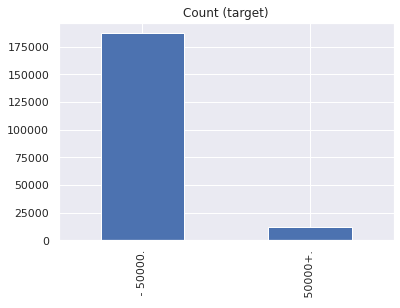

In [ ]:
# for census we have separate train and test files provided by UCI
CENSUS_TRAIN = f'{ORIGINAL_DATASET_PATHS["census"]}/train.csv'
CENSUS_TEST = f'{ORIGINAL_DATASET_PATHS["census"]}/test.csv'

CENSUS_COLUMNS_RENAMED = [
  'age','class of worker','detailed industry recode','detailed occupation recode','education',
  'wage per hour','enroll in edu inst last wk','martial status','major industry code','major occupation code',
  'race','hispanic origin','sex','member of labour union','reason for unemployment','full or part time employment stat',
  'capital gains','capital losses','divdends from stock','tax filer status','region of previous residence',
  'state of previous residence','detailed household and family stat','detailed household summary in household',
  'instance weight','migration code-change in msa','migration code-change in reg',
  'migration code-move within reg','live in this house 1 year ago',' migration prev res in sunbelt',
  'num persons worked for employer','family members under 18','country of birth father','country of birth mother',
  'country of birth self','citizenship','own business or self employed','fill inc questionnaire for veterans admin',
  'veterans benefits','weeks worked in year','year','income'
]
CENSUS_COLUMNS_TO_DROP = [
  'state of previous residence','migration code-change in msa',
  'migration code-change in reg','migration code-move within reg',
  ' migration prev res in sunbelt','country of birth father','country of birth mother',
  'country of birth self', 'instance weight'
]

census_train_df = pd.read_csv(CENSUS_TRAIN, names=CENSUS_COLUMNS_RENAMED)
census_train_df = census_train_df.drop(CENSUS_COLUMNS_TO_DROP,axis=1)
# census_train_df = census_train_df.sample(9000)
train_data, train_labels = train_test_split_data(census_train_df, target='income', 
                                                 dataset_name=DatasetNames.CENSUS)

Number of attributes is: 33
 - 50000.    93576
 50000+.      6186
Name: income, dtype: int64
Has null values False


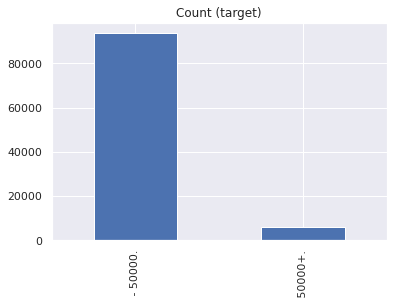

In [ ]:
census_test_df = pd.read_csv(CENSUS_TEST, names=CENSUS_COLUMNS_RENAMED)
census_test_df = census_test_df.drop(CENSUS_COLUMNS_TO_DROP,axis=1)
# census_test_df = census_test_df.sample(9000)
test_data,test_labels = train_test_split_data(census_test_df,target='income',dataset_name=DatasetNames.CENSUS) 

### Grid Search for Original Census DataSet
Used to find the best working model for the classification task. This is run only once and then the best parameters are stored for future tasks.

In [ ]:
# grid searches on the original dataset - used to find the best params for original dataset
perform_grid_search = False

if perform_grid_search:

    random_forest_grid_search(train_data=train_data, train_labels=train_labels, 
                              dataset_name=DatasetNames.CENSUS, 
                              approach_name=SynthetizationApproaches.ORIGINAL)
  
    logistic_regression_grid_search(train_data=train_data, train_labels=train_labels,
                                    dataset_name=DatasetNames.CENSUS, 
                                    approach_name=SynthetizationApproaches.ORIGINAL)
  
    knn_grid_search(train_data=train_data, train_labels=train_labels, 
                    dataset_name=DatasetNames.CENSUS, 
                    approach_name=SynthetizationApproaches.ORIGINAL)
  
    svm_grid_search(train_data=train_data, train_labels=train_labels, 
                    dataset_name=DatasetNames.CENSUS, 
                    approach_name=SynthetizationApproaches.ORIGINAL)

In [ ]:
# train models for the original dataset
logistic_regression_train(
    train_data=train_data, train_labels=train_labels, 
    test_data=test_data, test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, approach_name=SynthetizationApproaches.ORIGINAL, 
    save_csv=True
)

random_forest_train(
    train_data=train_data, train_labels=train_labels, 
    test_data=test_data, test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, approach_name=SynthetizationApproaches.ORIGINAL, 
    save_csv=True
)

knn_train(
    train_data=train_data, train_labels=train_labels, 
    test_data=test_data, test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, approach_name=SynthetizationApproaches.ORIGINAL, 
    save_csv=True
)

svm_train(
    train_data=train_data, train_labels=train_labels, 
    test_data=test_data, test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, approach_name=SynthetizationApproaches.ORIGINAL, 
    save_csv=True
)

### Synthetic Data Generation

#### SDV for census dataset

Performing synthetic data generation for the train set. Test set should remain the same, in original and synthesized approaches. 

Default setting is to use CTGAN model


In [ ]:
from tqdm import tqdm

In [ ]:
SDVSampleSynthesis = False

if SDVSampleSynthesis:

  sampleSize = [0.3,0.5,0.7,0.9]
  sampleMode = ['random', 'stratify']

  sdv = SyntheticDataVault()

  for mode in tqdm(sampleMode):
    for size in sampleSize:
      sdv_synthesized_train_census_Sample, metrics = sdv.generate(
          data=census_train_df, 
          dataset_name=DatasetNames.CENSUS,
          # sample_size=10,
          distributions_list=['gaussian'],  # this assumes that all columns will use the gausian distribution. We do it this way
          sampleType=mode, sampleSize=size                                     # so that we do not have to try out all distributions before running the synthetic data generation
      )

      sdv_synthesized_census_train_data_Sample,\
      sdv_synthesized_census_train_data_Sample_labels =  train_test_split_data(
          sdv_synthesized_train_census_Sample, target='income', dataset_name=DatasetNames.CENSUS
      )

      logistic_regression_train(
          train_data=sdv_synthesized_census_train_data_Sample, 
          train_labels=sdv_synthesized_census_train_data_Sample_labels, 
          test_data=test_data, 
          test_labels=test_labels, 
          dataset_name=DatasetNames.CENSUS, 
          approach_name=SynthetizationApproaches.SDV, 
          save_csv=True,
          sampleSize = size,
          sampleApproach = mode
      )

      random_forest_train(
      train_data=sdv_synthesized_census_train_data_Sample, 
      train_labels=sdv_synthesized_census_train_data_Sample_labels, 
      test_data=test_data, 
      test_labels=test_labels, 
      dataset_name=DatasetNames.CENSUS, 
      approach_name=SynthetizationApproaches.SDV, 
      save_csv=True,
      sampleSize = size,
      sampleApproach = mode
      )
      knn_train(
          train_data=sdv_synthesized_census_train_data_Sample, 
          train_labels=sdv_synthesized_census_train_data_Sample_labels, 
          test_data=test_data, 
          test_labels=test_labels, 
          dataset_name=DatasetNames.CENSUS, 
          approach_name=SynthetizationApproaches.SDV, 
          save_csv=True,
          sampleSize = size,
          sampleApproach = mode
      )
      svm_train(
          train_data=sdv_synthesized_census_train_data_Sample, 
          train_labels=sdv_synthesized_census_train_data_Sample_labels, 
          test_data=test_data, 
          test_labels=test_labels, 
          dataset_name=DatasetNames.CENSUS, 
          approach_name=SynthetizationApproaches.SDV, 
          save_csv=True,
          sampleSize = size,
          sampleApproach = mode
      )


In [ ]:
sdv = SyntheticDataVault()

sdv_synthesized_train_census, metrics = sdv.generate(
    data=census_train_df, 
    dataset_name=DatasetNames.CENSUS,
    # sample_size=10,
    distributions_list=['gaussian']  # this assumes that all columns will use the gausian distribution. We do it this way
                                     # so that we do not have to try out all distributions before running the synthetic data generation
)

print(metrics)

sdv_synthesized_train_census.head()

In [ ]:
sdv_synthesized_train_census = read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/GaussianCopula/synthetic_data_train.csv')
sdv_synthesized_train_census = sdv_synthesized_train_census.sample(9000)

Number of attributes is: 33
1    8181
0     819
Name: income, dtype: int64
Has null values False


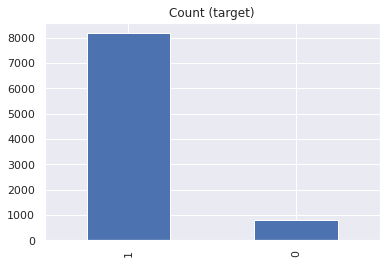

In [ ]:
# split the train synthesized data to train_data and train_labels
sdv_synthesized_census_train_data,\
sdv_synthesized_census_train_labels =  train_test_split_data(
    sdv_synthesized_train_census, target='income', dataset_name=DatasetNames.CENSUS
)

##### Classification models on SDV data for Census

In [ ]:
# now that we have train_data, train_labels for the synthetic dataset using SDV,
# we can run classification tasks and measure the performance.
# note: test  dataset is from the original dataset
logistic_regression_train(
    train_data=sdv_synthesized_census_train_data, 
    train_labels=sdv_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.SDV, 
    save_csv=True
)

random_forest_train(
    train_data=sdv_synthesized_census_train_data, 
    train_labels=sdv_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.SDV, 
    save_csv=True
)
knn_train(
    train_data=sdv_synthesized_census_train_data, 
    train_labels=sdv_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.SDV, 
    save_csv=True
)
svm_train(
    train_data=sdv_synthesized_census_train_data, 
    train_labels=sdv_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.SDV, 
    save_csv=True
)

#### Data Synthesizer for census dataset

Default setting is to use the random mode

In [ ]:
# generates the synthetic data for the train dataset of census

DSSampleSynthesis = False

if DSSampleSynthesis:
  sampleSize = [0.3,0.5,0.7,0.9]
  sampleMode = ['random', 'stratify']

  ds = DataSynthesizer()

  for mode in tqdm(sampleMode):
    for size in sampleSize:
      dsSample = DataSynthesizer()
      ds_synthesized_train_census_path_Sample = dsSample.generate(
          dataset_name=DatasetNames.CENSUS, dataset_path=CENSUS_TRAIN, 
          column_names=CENSUS_COLUMNS_RENAMED, columns_to_drop=CENSUS_COLUMNS_TO_DROP,
          sampleType=mode, sampleSize=size
      )
      ds_synthesized_train_census_data_Sample = pd.read_csv(ds_synthesized_train_census_path_Sample)

      ds_synthesized_train_census_data_Sample_train,\
      ds_synthesized_train_census_data_Sample_labels =  train_test_split_data(
          ds_synthesized_train_census_data_Sample, target='income', dataset_name=DatasetNames.CENSUS
      )

      logistic_regression_train(
          train_data=ds_synthesized_train_census_data_Sample_train, 
          train_labels=ds_synthesized_train_census_data_Sample_labels, 
          test_data=test_data, 
          test_labels=test_labels, 
          dataset_name=DatasetNames.CENSUS, 
          approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
          save_csv=True,
          sampleSize = size,
          sampleApproach = mode
      )

      random_forest_train(
      train_data=ds_synthesized_train_census_data_Sample_train, 
      train_labels=ds_synthesized_train_census_data_Sample_labels, 
      test_data=test_data, 
      test_labels=test_labels, 
      dataset_name=DatasetNames.CENSUS, 
      approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
      save_csv=True,
      sampleSize = size,
      sampleApproach = mode
      )
      knn_train(
          train_data=ds_synthesized_train_census_data_Sample_train, 
          train_labels=ds_synthesized_train_census_data_Sample_labels, 
          test_data=test_data, 
          test_labels=test_labels, 
          dataset_name=DatasetNames.CENSUS, 
          approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
          save_csv=True,
          sampleSize = size,
          sampleApproach = mode
      )
      svm_train(
          train_data=ds_synthesized_train_census_data_Sample_train, 
          train_labels=ds_synthesized_train_census_data_Sample_labels, 
          test_data=test_data, 
          test_labels=test_labels, 
          dataset_name=DatasetNames.CENSUS, 
          approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
          save_csv=True,
          sampleSize = size,
          sampleApproach = mode
      )
  # ds_synthesized_train_census_data_Sample.head()

In [ ]:
 # generates the synthetic data for the train dataset of census
ds = DataSynthesizer()
ds_synthesized_train_census_path = ds.generate(
    dataset_name=DatasetNames.CENSUS, dataset_path=CENSUS_TRAIN, 
    column_names=CENSUS_COLUMNS_RENAMED, columns_to_drop=CENSUS_COLUMNS_TO_DROP
)
ds_synthesized_train_census_data = pd.read_csv(ds_synthesized_train_census_path)

ds_synthesized_train_census_data.head()

In [ ]:
ds_synthesized_train_census_data = pd.read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/random/synthetic_data_train.csv')
# ds_synthesized_train_census_data = ds_synthesized_train_census_data.sample(9000)

Number of attributes is: 33
1    8425
0     575
Name: income, dtype: int64
Has null values False


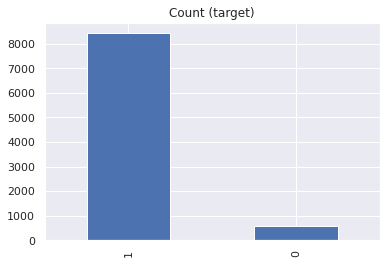

In [ ]:
# splits the generated synthetic data for train, into train_data and train_labels
ds_synthesized_census_train_data,\
 ds_synthesized_census_train_labels =  train_test_split_data(
    ds_synthesized_train_census_data, target='income', dataset_name=DatasetNames.CENSUS
)

##### Classification models on DS data for Census

In [ ]:
# now that we have train_data, train_labels, test_data and test_labels
# for the synthetic dataset using DataSynthesizer, we can run classification tasks and measure
# the performance
logistic_regression_train(
    train_data=ds_synthesized_census_train_data, 
    train_labels=ds_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
    save_csv=True
)

random_forest_train(
    train_data=ds_synthesized_census_train_data, 
    train_labels=ds_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
    save_csv=True
)
knn_train(
    train_data=ds_synthesized_census_train_data, 
    train_labels=ds_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
    save_csv=True
)
svm_train(
    train_data=ds_synthesized_census_train_data, 
    train_labels=ds_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
    save_csv=True
)

#### Synthpop for census dataset

We use the rpy2 the be able to run R code from notebook

In [ ]:
!pip install rpy2

In [ ]:
%load_ext rpy2.ipython

In [ ]:
%R install.packages("synthpop")

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/synthpop_1.6-0.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 695380 bytes (679 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[wri

In [ ]:
# in order to have the data ready for synthpop, we label encode them and store to path
# sample()
pd.DataFrame(label_encode(census_train_df)).to_csv(f'{relativePath}data/original_datasets/census/census_train_synthpop.csv')

In [ ]:
# !Rscript -e "install.packages('jsonlite', repos='https://cloud.r-project.org/', lib = .Library)"
# !pip install r-functions 


In [ ]:
# from r_functions import create, run

In [ ]:
# Synthpop = create("synthPop.R", "Synthpop")


In [ ]:
%%R
library('synthpop')

library('yaml')

train_data_path = f'{relativePath}data/original_datasets/census/census_train_synthpop_sample.csv'

Synthpop <- function(data_path, save_as_csv, name, Remark=None)
{ 
  data <- read.csv(data_path)
  # purposely only get the first 10 rows
  # data <- head(data, 10)

  # print(sum(is.na(data)))

  config <- yaml.load_file("/content/drive/MyDrive/Colab Notebooks/config.yaml")
  print(config)
  # currently generate only 100 rows
  # k <- 10
  
  # if (is.null(k))
  # {
  #     k <- nrow(data)
  # }
 
#  k -> the number of samples needed to be generated
  k <- 199523
  method <- config['method']
  mysyn <- syn(data,method=method, k = k, minnumlevels=-1)

  # postfix <- ifelse(sampleSize != -1, str(sampleSize), "None")
  postfix <- str(Remark)
  
  for (column in colnames(data)){
      # paste(column, "in dataset ",postfix)      
      print(compare(mysyn, data, vars=column)$plot)
  }


#  line 44 saves the generated csv to source folder
  if (save_as_csv == 1)
  { 
      # name = "xxx"
      # file_name <- paste("synthetic_data", postfix)
      file_name <- paste(name, postfix)
      write.syn(mysyn, file = file_name, filetype = "csv")
  }
}
save_as_csv = 1

# invoke generation for train set
# Synthpop(train_data_path, save_as_csv)


R[write to console]: Find out more at https://www.synthpop.org.uk/



In [ ]:
SynthpopSampleData = False

if SynthpopSampleData:
  sampleSizeList = [0.30, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
  samplemode = ["random", "stratify"]

  for sm in samplemode:
    for sampleSize in sampleSizeList:
      dfSampled = sample(census_train_df, mode= sm, subsample=sampleSize)
      dfSampled.to_csv(f"{relativePath}sample data/sampleDataForSynth/dfSampled_{sm}_{str(sampleSize)}.csv")
      # break


In [ ]:
import os

os.listdir(f"{relativePath}sample data/sampleDataForSynth")

['dfSampled_random_0.5.csv',
 'dfSampled_random_0.3.csv',
 'dfSampled_random_0.7.csv',
 'dfSampled_stratify_0.3.csv',
 'dfSampled_stratify_0.5.csv',
 'dfSampled_random_0.9.csv',
 'dfSampled_stratify_0.7.csv',
 'dfSampled_stratify_0.9.csv']

[1] "dfSampled_random_0.3.csv"
[1] "/content/drive/MyDrive/upwork/leper/sample data/sampleDataForSynth/dfSampled_random_0.3.csv"
[1] "dfSampled_random_0.3"
$Parameters
$Parameters$`kNN parameters`
$Parameters$`kNN parameters`$n_neighbors
[1] 3

$Parameters$`kNN parameters`$weights
[1] "uniform"

$Parameters$`kNN parameters`$algorithm
[1] "auto"


$Parameters$`RandomForest parameters`
$Parameters$`RandomForest parameters`$n_estimators
[1] 100

$Parameters$`RandomForest parameters`$criterion
[1] "gini"


$Parameters$`SVM parameters`
$Parameters$`SVM parameters`$C
[1] 1

$Parameters$`SVM parameters`$kernel
[1] "rbf"

$Parameters$`SVM parameters`$degree
[1] 3

$Parameters$`SVM parameters`$gamma
[1] "scale"


$Parameters$`LogisticRegression parameters`
$Parameters$`LogisticRegression parameters`$penalty
[1] "l2"

$Parameters$`LogisticRegression parameters`$dual
[1] FALSE

$Parameters$`LogisticRegression parameters`$C
[1] 1

$Parameters$`LogisticRegression parameters`$fit_intercept
[1] TRUE


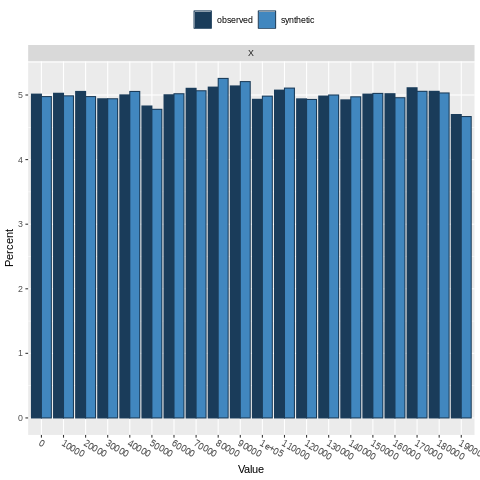

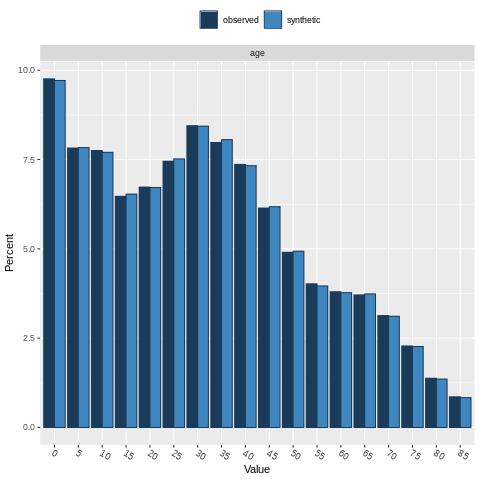

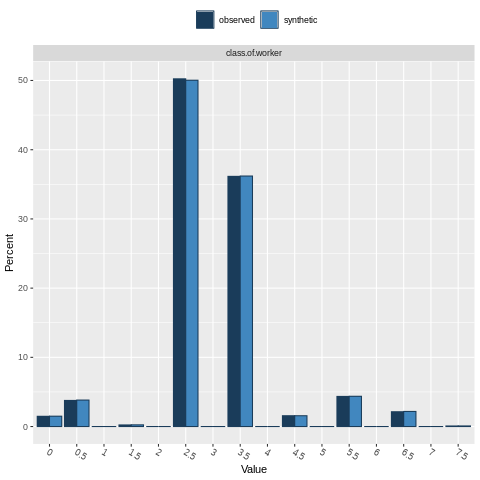

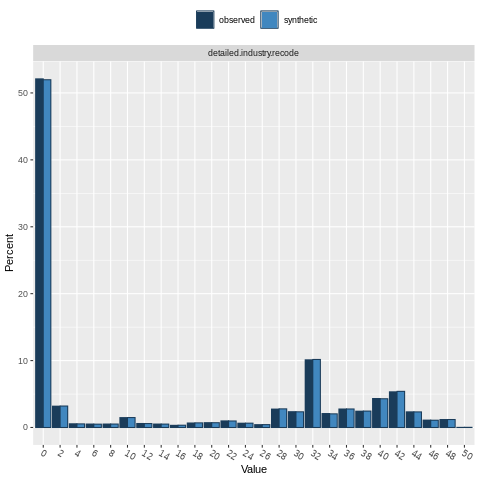

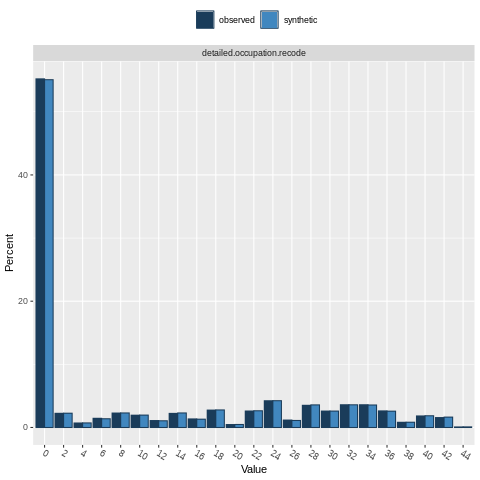

...

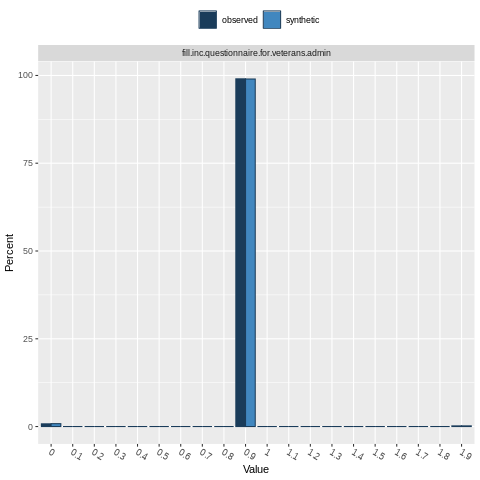

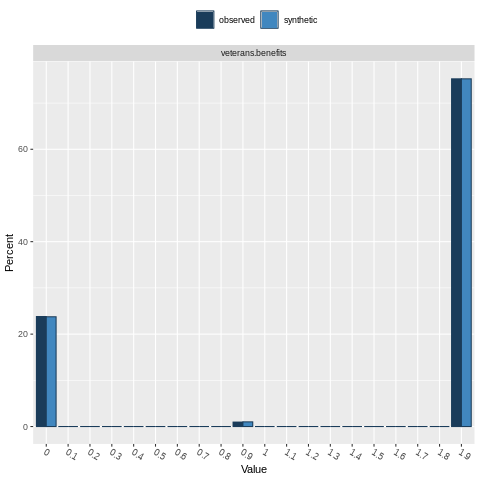

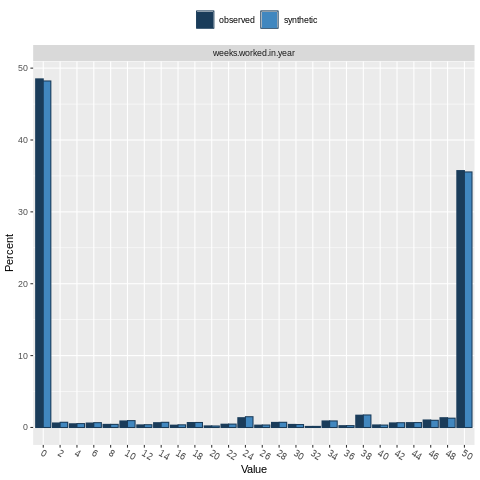

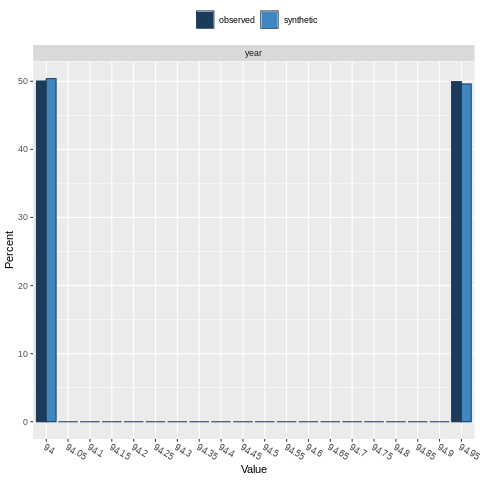

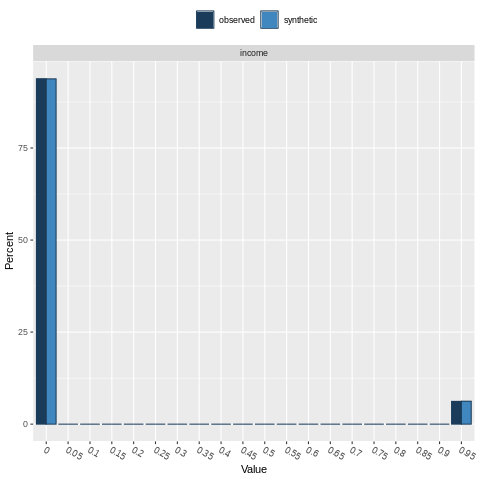

In [ ]:
%%R
save_as_csv = 1
my_list <- list('dfSampled_random_0.3.csv',
 'dfSampled_stratify_0.3.csv',
 'dfSampled_random_0.4.csv',
 'dfSampled_random_0.5.csv',
 'dfSampled_random_0.6.csv',
 'dfSampled_random_0.7.csv',
 'dfSampled_random_0.8.csv',
 'dfSampled_random_0.9.csv',
 'dfSampled_stratify_0.4.csv',
 'dfSampled_stratify_0.5.csv',
 'dfSampled_stratify_0.6.csv',
 'dfSampled_stratify_0.7.csv',
 'dfSampled_stratify_0.8.csv',
 'dfSampled_stratify_0.9.csv')

path = f"{relativePath}sample data/sampleDataForSynth/"

for (dataframe in my_list){
      # paste(column, "in dataset ",postfix)    
      print(dataframe)  
      print(paste(path,dataframe, sep=''))
      len <- nchar(dataframe)
      # print(substr(str, 1, 4))
      dfname = substr(dataframe, 0, len-4)
      # print(substr(dataframe, 0, len-3))
      print(dfname)
      # print(compare(mysyn, data, vars=column)$plot)
      censusOriginalDataPath = paste(path,dataframe, sep='')
      Synthpop(censusOriginalDataPath, save_as_csv, dfname,"0.1")
      break
  }
# Synthpop(censusOriginalDataPath, save_as_csv, "sample_0.1","0.1")


In [ ]:
# with R synthetic data for synthpop have been generated
# now we load the synthetic datasets and use them
synthpop_train = pd.read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.SYNTHPOP}/{DatasetNames.CENSUS}/synthetic_data_train.csv')
synthpop_train = synthpop_train.sample(9000)

Number of attributes is: 33
1    8410
0     590
Name: income, dtype: int64
Has null values False


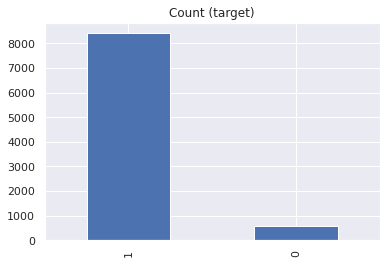

In [ ]:
# split train dataset generated with synthpop, into train_data and train_labels
synthpop_synthesized_census_train_data,\
 synthpop_synthesized_census_train_labels =  train_test_split_data(
    synthpop_train, target='income', dataset_name=DatasetNames.CENSUS
)

##### Classification models on Synthpop data for Census

In [ ]:
# now that we have train_data, train_labels, test_data and test_labels
# for the synthetic dataset using Synthpop, we can run classification tasks and measure
# the performance
logistic_regression_train(
    train_data=synthpop_synthesized_census_train_data, 
    train_labels=synthpop_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.SYNTHPOP, 
    save_csv=True
)

random_forest_train(
    train_data=synthpop_synthesized_census_train_data, 
    train_labels=synthpop_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.SYNTHPOP, 
    save_csv=True
)

knn_train(
    train_data=synthpop_synthesized_census_train_data, 
    train_labels=synthpop_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.SYNTHPOP, 
    save_csv=True
)

svm_train(
    train_data=synthpop_synthesized_census_train_data, 
    train_labels=synthpop_synthesized_census_train_labels, 
    test_data=test_data, 
    test_labels=test_labels, 
    dataset_name=DatasetNames.CENSUS, 
    approach_name=SynthetizationApproaches.SYNTHPOP, 
    save_csv=True
)

## Forest Dataset

### Data loading and train_test_split

Number of attributes is: 55
2    283301
1    211840
3     35754
7     20510
6     17367
5      9493
4      2747
Name: Cover_Type, dtype: int64
Has null values False
Train data shape: (464809, 54)  Train labels shape:  (464809,)
Test  data shape: (116203, 54)  Test labels shape:  (116203,)


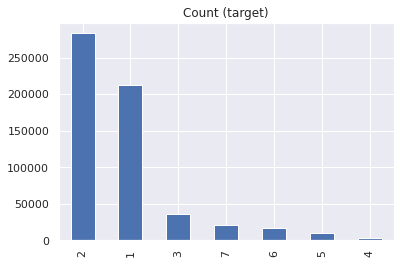

In [ ]:
FOREST_DATA = f'{ORIGINAL_DATASET_PATHS["forest"]}/data.csv'

FOREST_COLUMNS_RENAMED = [
    'Elevation','Aspect','Slope','Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology',
    'Horizontal_Distance_To_Roadways','Hillshade_9am','Hillshade_Noon','Hillshade_3pm',
    'Horizontal_Distance_To_Fire_Points','Wilderness_Area1','Wilderness_Area2','Wilderness_Area3',
    'Wilderness_Area4','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6',
    'Soil_Type7','Soil_Type8','Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13',
    'Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17','Soil_Type18','Soil_Type19',
    'Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25', 
    'Soil_Type26','Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31', 
    'Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type36','Soil_Type37', 
    'Soil_Type38','Soil_Type39','Soil_Type40','Cover_Type'
]

forest_df = pd.read_csv(FOREST_DATA, names=FOREST_COLUMNS_RENAMED)

forest_train_data, forest_train_labels, forest_test_data, forest_test_labels =\
  train_test_split_data(forest_df, target='Cover_Type', dataset_name=DatasetNames.FOREST)

### Grid  Search for Original Forest Dataset

In [ ]:
# grid searches on the original dataset - used to find the best params for original dataset
perform_grid_search = True

if perform_grid_search:

    random_forest_grid_search(
        train_data=forest_train_data, train_labels=forest_train_labels, 
        dataset_name=DatasetNames.FOREST, 
        approach_name=SynthetizationApproaches.ORIGINAL
    )
  
    logistic_regression_grid_search(
        train_data=forest_train_data, train_labels=forest_train_labels, 
        dataset_name=DatasetNames.FOREST, 
        approach_name=SynthetizationApproaches.ORIGINAL
    )
  
    knn_grid_search(
        train_data=forest_train_data, train_labels=forest_train_labels, 
        dataset_name=DatasetNames.FOREST, 
        approach_name=SynthetizationApproaches.ORIGINAL
    )
  
    svm_grid_search(
        train_data=forest_train_data, train_labels=forest_train_labels, 
        dataset_name=DatasetNames.FOREST, 
        approach_name=SynthetizationApproaches.ORIGINAL
    )

In [ ]:
# train models for the original forest dataset
logistic_regression_train(
    train_data=forest_train_data, train_labels=forest_train_labels, 
    test_data=forest_test_data, test_labels=forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.ORIGINAL, 
    save_csv=True
)

random_forest_train(
    train_data=forest_train_data, train_labels=forest_train_labels, 
    test_data=forest_test_data, test_labels=forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.ORIGINAL, 
    save_csv=True
)

knn_train(
    train_data=forest_train_data, train_labels=forest_train_labels, 
    test_data=forest_test_data, test_labels=forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.ORIGINAL, 
    save_csv=True
)

svm_train(
    train_data=forest_train_data, train_labels=forest_train_labels, 
    test_data=forest_test_data, test_labels=forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.ORIGINAL, 
    save_csv=True
)

Model Score of Logistic Regression on training data of forest with approach original is  0.7199301218349903
Model Score of Logistic Regression on testing data of forest with approach original is  0.7196888204263229
--- Logistic Regression takes 49.01635193824768 seconds ---
Model Score of Random Forest on training data of forest with approach original is  1.0
Model Score of Random Forest on testing data of forest with approach original is  0.9550872180580536
--- Random Forest takes 203.6706187725067 seconds ---
Model Score of KNN on training data of forest with approach original is  0.9528408443037893
Model Score of KNN on testing data of forest with approach original is  0.9315594261766047
--- KNN takes 6694.642334699631 seconds ---
Model Score of SVM on training data of forest with approach original is  0.7126712262456192
Model Score of SVM on testing data of forest with approach original is  0.7126752321368639
--- SVM takes 104.17147874832153 seconds ---


### Synthetic Data Generation

#### SDV for Forest dataset

In [ ]:
# takes the full forest dataset and generates the synthetic data
sdv = SyntheticDataVault()

sdv_synthesized_data_forest, metrics = sdv.generate(
    data=forest_df, 
    dataset_name=DatasetNames.FOREST,
    # sample_size=10,
    distributions_list=['gaussian']
)

print(metrics)

sdv_synthesized_data_forest.head()

Hypertuning "Elevation" column with distribution gaussian
Hypertuning "Aspect" column with distribution gaussian
Hypertuning "Slope" column with distribution gaussian
Hypertuning "Horizontal_Distance_To_Hydrology" column with distribution gaussian
Hypertuning "Vertical_Distance_To_Hydrology" column with distribution gaussian
Hypertuning "Horizontal_Distance_To_Roadways" column with distribution gaussian
Hypertuning "Hillshade_9am" column with distribution gaussian
Hypertuning "Hillshade_Noon" column with distribution gaussian
Hypertuning "Hillshade_3pm" column with distribution gaussian
Hypertuning "Horizontal_Distance_To_Fire_Points" column with distribution gaussian
Hypertuning "Wilderness_Area1" column with distribution gaussian
Hypertuning "Wilderness_Area2" column with distribution gaussian
Hypertuning "Wilderness_Area3" column with distribution gaussian
Hypertuning "Wilderness_Area4" column with distribution gaussian
Hypertuning "Soil_Type1" column with distribution gaussian
Hype

In [ ]:
# splits the generated data using sdv, into train and test
sdv_synthesized_forest_train_data, sdv_synthesized_forest_train_labels,\
sdv_synthesized_forest_test_data, sdv_synthesized_forest_test_labels =\ 
  train_test_split_data(
      sdv_synthesized_data_forest, target='Cover_Type', dataset_name=DatasetNames.FOREST
)

##### Classfication models on SDV data for Forest

In [ ]:
# train models for the generated dataset for forest, using SDV
logistic_regression_train(
    train_data=sdv_synthesized_forest_train_data, train_labels=sdv_synthesized_forest_train_labels, 
    test_data=sdv_synthesized_forest_test_data, test_labels=sdv_synthesized_forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.SDV, 
    save_csv=True
)

random_forest_train(
    train_data=sdv_synthesized_forest_train_data, train_labels=sdv_synthesized_forest_train_labels, 
    test_data=sdv_synthesized_forest_test_data, test_labels=sdv_synthesized_forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.SDV, 
    save_csv=True
)

knn_train(
    train_data=sdv_synthesized_forest_train_data, train_labels=sdv_synthesized_forest_train_labels, 
    test_data=sdv_synthesized_forest_test_data, test_labels=sdv_synthesized_forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.SDV, 
    save_csv=True
)

svm_train(
    train_data=sdv_synthesized_forest_train_data, train_labels=sdv_synthesized_forest_train_labels, 
    test_data=sdv_synthesized_forest_test_data, test_labels=sdv_synthesized_forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.SDV, 
    save_csv=True
)

#### Data Synthesizer for Forest dataset

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,44,73,64,10,48,10,15,60,41,76,1,0,1,1,1,1,0,1,0,1,1,0,0,1,1,0,1,1,1,0,0,0,1,0,1,0,1,0,1,1,1,0,0,1,0,1,0,0,0,1,0,1,0,1,4
1,47,51,90,36,6,13,45,32,85,81,0,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,1,0,1,1,1,0,1,1,0,0,1,1,1,0,0,0,0,0,1,0,1,1,1,1,0,0,0,0,6
2,64,72,10,10,85,55,0,58,44,5,1,1,1,1,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,1,0,1,1,1,0,0,1,0,0,0,0,1,1,1,1,0,0,1,0,1,0,1,0,0,1
3,67,49,97,13,55,33,50,57,86,54,1,0,0,1,0,1,0,1,1,0,0,0,1,0,0,1,0,0,1,1,0,1,1,0,0,1,0,1,1,1,1,0,1,1,0,0,1,1,0,1,0,1,1,1,2
4,67,56,98,18,22,15,5,65,32,57,0,0,0,0,0,0,0,1,0,0,1,0,1,1,1,1,0,1,1,0,0,1,1,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,1,0,3


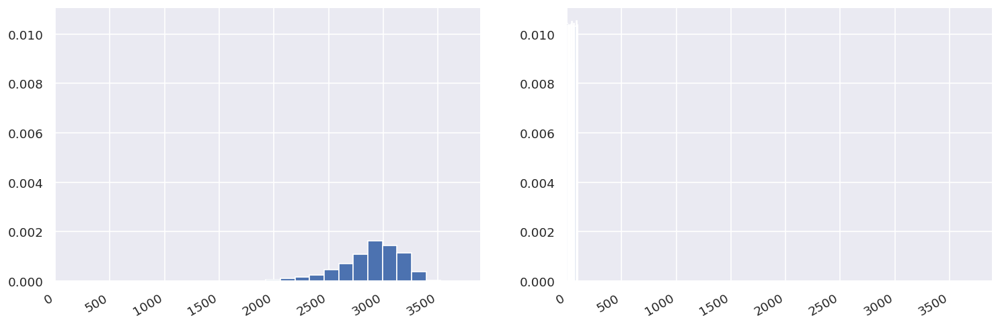

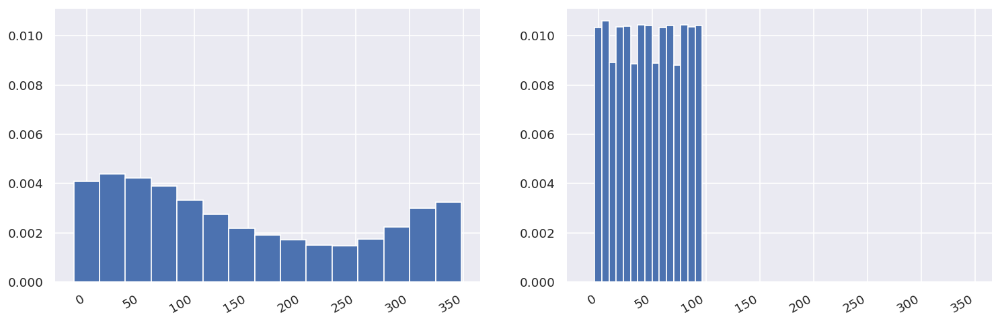

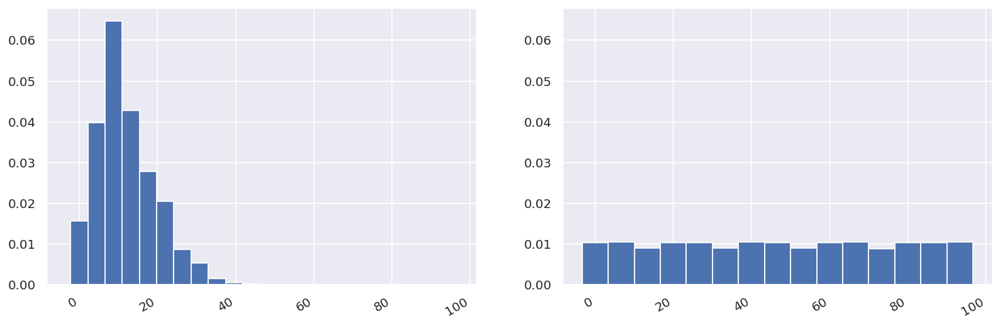

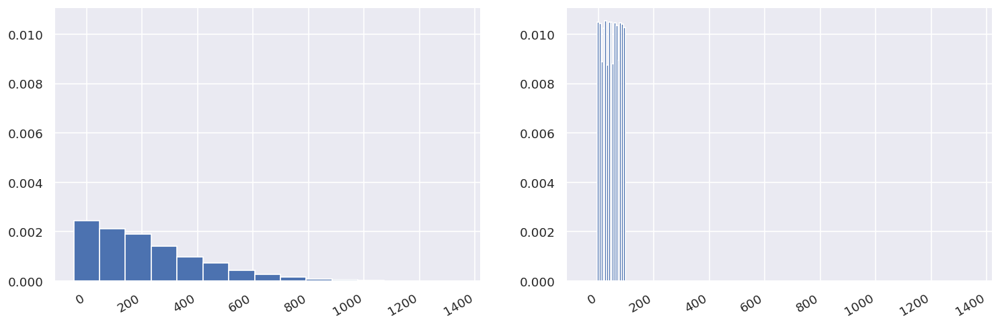

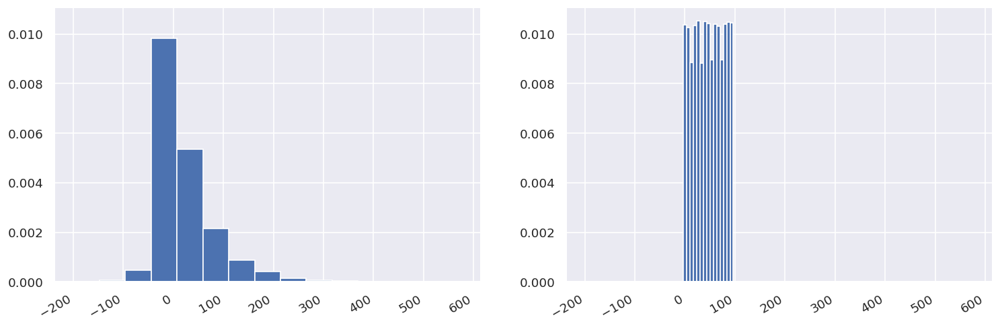

...

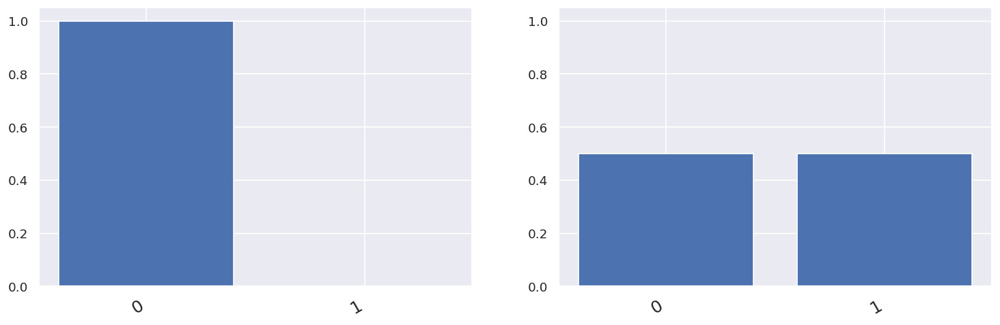

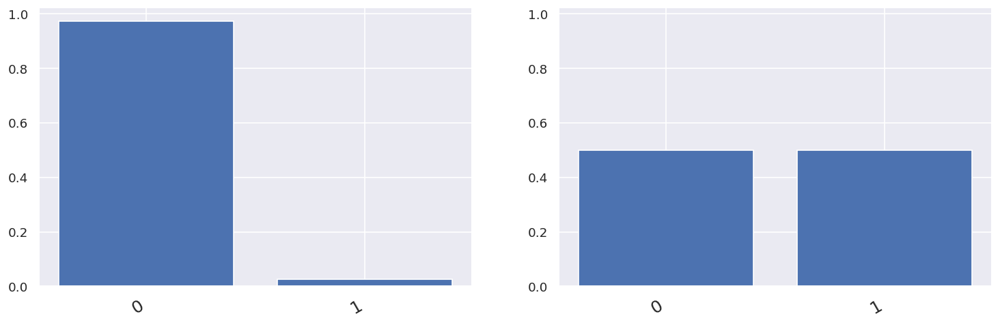

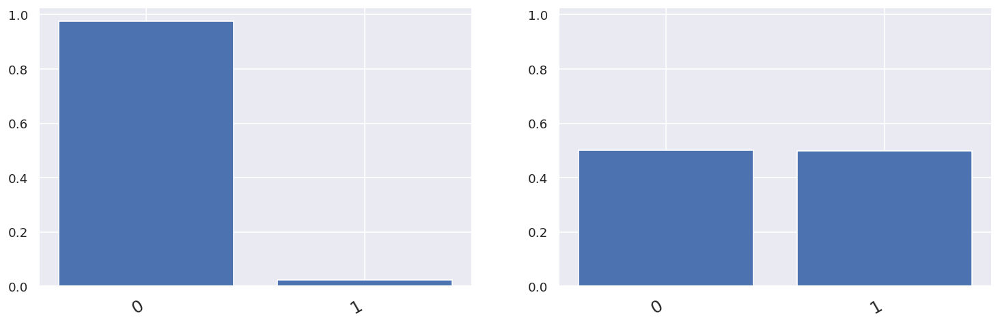

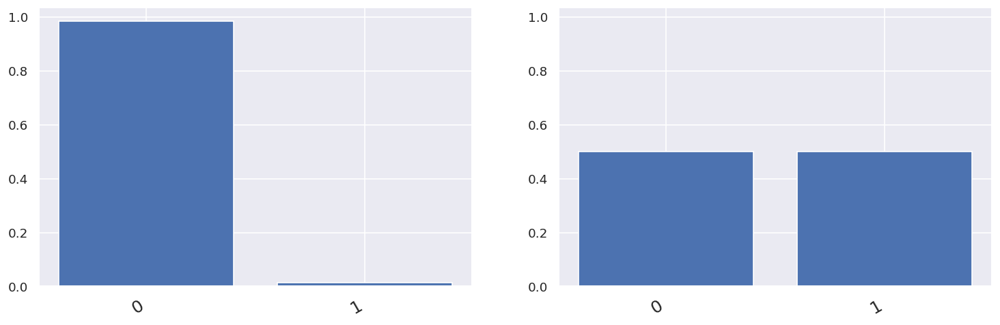

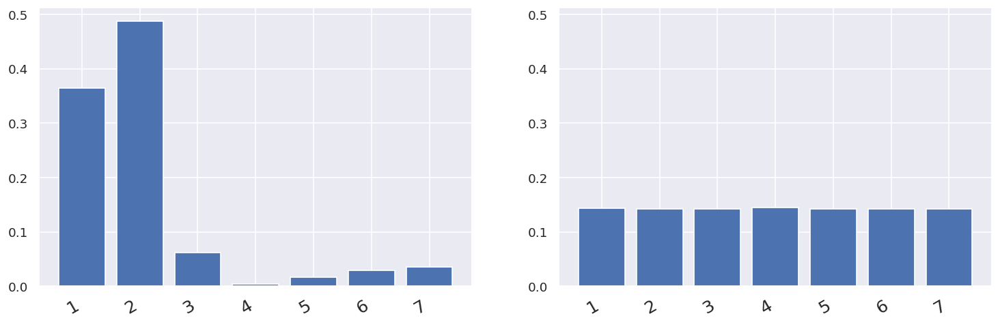

In [ ]:
ds = DataSynthesizer()
ds_synthesized_data_forest_path = ds.generate(
    dataset_name=DatasetNames.FOREST, dataset_path=FOREST_DATA, 
    column_names=FOREST_COLUMNS_RENAMED
)

ds_synthesized_data_forest = pd.read_csv(ds_synthesized_data_forest_path)

ds_synthesized_data_forest.head()

Number of attributes is: 55
4    28814
1    28536
2    28512
5    28460
7    28411
3    28403
6    28387
Name: Cover_Type, dtype: int64
Has null values False
Train data shape: (159618, 54)  Train labels shape:  (159618,)
Test  data shape: (39905, 54)  Test labels shape:  (39905,)


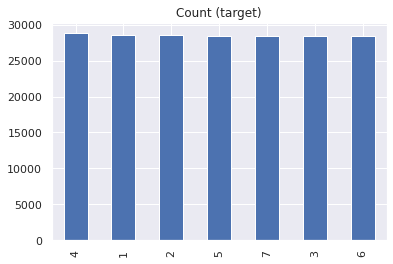

In [ ]:
ds_synthesized_forest_train_data, ds_synthesized_forest_train_labels, ds_synthesized_forest_test_data, ds_synthesized_forest_test_labels =\
  train_test_split_data(
      ds_synthesized_data_forest, target='Cover_Type', dataset_name=DatasetNames.FOREST
)

##### Classification models on DS data for Forest

In [ ]:
# train models for the generated dataset for forest, using DataSythesizer
logistic_regression_train(
    train_data=ds_synthesized_forest_train_data, train_labels=ds_synthesized_forest_train_labels, 
    test_data=ds_synthesized_forest_test_data, test_labels=ds_synthesized_forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
    save_csv=True
)

random_forest_train(
    train_data=ds_synthesized_forest_train_data, train_labels=ds_synthesized_forest_train_labels, 
    test_data=ds_synthesized_forest_test_data, test_labels=ds_synthesized_forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
    save_csv=True
)

knn_train(
    train_data=ds_synthesized_forest_train_data, train_labels=ds_synthesized_forest_train_labels, 
    test_data=ds_synthesized_forest_test_data, test_labels=ds_synthesized_forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
    save_csv=True
)

svm_train(
    train_data=ds_synthesized_forest_train_data, train_labels=ds_synthesized_forest_train_labels, 
    test_data=ds_synthesized_forest_test_data, test_labels=ds_synthesized_forest_test_labels, 
    dataset_name=DatasetNames.FOREST, 
    approach_name=SynthetizationApproaches.DATA_SYNTHESIZER, 
    save_csv=True
)

Model Score of Logistic Regression on training data of forest with approach data_synthesizer is  0.1524514779034946
Model Score of Logistic Regression on testing data of forest with approach data_synthesizer is  0.14261370755544417
--- Logistic Regression takes 8.082359075546265 seconds ---
Model Score of Random Forest on training data of forest with approach data_synthesizer is  1.0
Model Score of Random Forest on testing data of forest with approach data_synthesizer is  0.1420373386793635
--- Random Forest takes 70.63325047492981 seconds ---
Model Score of SVM on training data of forest with approach data_synthesizer is  0.1524201531155634
Model Score of SVM on testing data of forest with approach data_synthesizer is  0.1426387670717955
--- SVM takes 518.6516489982605 seconds ---


#### Synthpop for Forest Dataset

In [ ]:
!pip install rpy2

In [ ]:
%load_ext rpy2.ipython

In [ ]:
%R install.packages("synthpop")

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘TH.data’, ‘libcoin’, ‘matrixStats’, ‘multcomp’, ‘proxy’, ‘truncnorm’, ‘mvtnorm’, ‘modeltools’, ‘strucchange’, ‘coin’, ‘zoo’, ‘sandwich’, ‘RcppEigen’, ‘e1071’, ‘cmm’, ‘Rsolnp’, ‘numDeriv’, ‘party’, ‘plyr’, ‘proto’, ‘polspline’, ‘randomForest’, ‘ranger’, ‘classInt’, ‘mipfp’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/TH.data_1.0-10.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 8238275 bytes (7.9 MB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]

In [ ]:
%%R
library('synthpop')

#yaml library
library('yaml') 


#Give the file of your path
data='/content/drive/MyDrive/Python Files/OriginalData/Forest.csv'

Synthpop <- function(data,save_CSV)
{ 
  data <- read.csv(data)
  
  # Checking NaN values
  print(sum(is.na(data)))

  #Config file
  config <- yaml.load_file("/content/drive/MyDrive/Config.yaml")

  k <- 581012
  
  if (is.null(k))
  {
      k <- nrow(data)
  }
 
  method <- config['method']


  mysyn <- syn(data,method=method, k = k, minnumlevels=-1)


  # Comparing the results
  evaluation <- compare(mysyn, data, vars="Elevation")$plot

  #Saving into file format
  if (save_CSV==1)
  { 
      write.syn(mysyn,file = "Synthpop_Data_File_Forest_Data", filetype = "csv")
  }

  return (evaluation)
}
save_CSV=1
evaluation=Synthpop(data,save_CSV)

#Gives the evaluation of the specific column you compared
print(evaluation) 

R[write to console]: Find out more at https://www.synthpop.org.uk/

R[write to console]: Error in file(file, "rt") : cannot open the connection

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In file(file, "rt") :
R[write to console]: 
 
R[write to console]:  cannot open file '/content/drive/MyDrive/Python Files/OriginalDataForest.csv': No such file or directory




Error in file(file, "rt") : cannot open the connection


In [ ]:
# TODO: replace with new approach
new_data=pd.read_csv('/content/drive/MyDrive/SyntheticData/Synthpop/Synthetic Synthpop Forest Dataset.csv')
train_data,train_labels,test_data,test_labels=preprocessing_data(new_data,target='Cover_Type',dataset_name='Forest')

In [ ]:
#Models
LogisticRegressionClass(train_data,train_labels,test_data,test_labels)
RandomForest(train_data,train_labels,test_data,test_labels)
KNN(train_data,train_labels,test_data,test_labels)
SVM(train_data,train_labels,test_data,test_labels)

#Grid Searches
RandomForestGridSearch(train_data,train_labels)
LogisticRegressionGridSearch(train_data,train_labels)
KNNGridSearch(train_data,train_labels)
SVMGridSearch(train_data,train_labels)

## Comparison of general data utility in classification tasks - Census Dataset

#### Performance metrics comparison

In [ ]:
sampleSize = [0.3, 0.5, 0.7, 0.9]
sampleMode = ['random', 'stratify']
sunthesizerApproach = [SynthetizationApproaches.DATA_SYNTHESIZER, SynthetizationApproaches.SDV, SynthetizationApproaches.SYNTHPOP]
datasets = [DatasetNames.CENSUS]
path = f"{relativePath}data/training_results"
trainingFolders = os.listdir(path)

accuracyDf = pd.DataFrame()
for trainingFolder in trainingFolders:
  if "_" in trainingFolder and datasets[0] in trainingFolder:
    for approach in os.listdir(f"{path}/{trainingFolder}"):
      for mode in os.listdir(f"{path}/{trainingFolder}/{approach}"):
        try:
          if "csv" not in mode:
            for dfResults in os.listdir(f"{path}/{trainingFolder}/{approach}/{mode}"):
              pathResultDf = f"{path}/{trainingFolder}/{approach}/{mode}/{dfResults}"
              dfRes = pd.read_csv(pathResultDf)
              dfRes['sampleSize'] = float(trainingFolder.split("_")[2])
              dfRes['samplingApproach'] = trainingFolder.split("_")[1]
              dfRes['synthesizer'] = approach
              dfRes['algorithm'] = dfResults.split("_")[0]

              accuracyDf = pd.concat([accuracyDf, dfRes])
          else:
            for dfResults in os.listdir(f"{path}/{trainingFolder}/{approach}"):
              pathResultDf = f"{path}/{trainingFolder}/{approach}/{dfResults}"
              dfRes = pd.read_csv(pathResultDf)
              dfRes['sampleSize'] = float(trainingFolder.split("_")[2])
              dfRes['samplingApproach'] = trainingFolder.split("_")[1]
              dfRes['synthesizer'] = approach
              dfRes['algorithm'] = dfResults.split("_")[0]
              accuracyDf = pd.concat([accuracyDf, dfRes])
        except Exception as e:
          print(e)
          pass

In [ ]:
from sklearn.metrics import accuracy_score

sampleUnique = set(accuracyDf.sampleSize.values)
samplingApproachUnique = set(accuracyDf.samplingApproach.values)
synthesizerUnique = set(accuracyDf.synthesizer.values)
algorithmUnique = set(accuracyDf.algorithm.values)
accuracyDfNew = pd.DataFrame()
accuracyDfTest = pd.DataFrame()

for su in sampleUnique:
  for sau in samplingApproachUnique:
    for syu in synthesizerUnique:
      for au in algorithmUnique:
        try:
          accuracyDfTest = accuracyDf[(accuracyDf['sampleSize'] == su) & (accuracyDf['samplingApproach'] == sau) &
                                      (accuracyDf['synthesizer'] == syu) & (accuracyDf['algorithm'] == au)]
          accuracyDfTest["accuracy"] = accuracy_score(accuracyDfTest['actual labels'], accuracyDfTest['predicted labels'])
          # accuracyDfTest['accuracy'] = accuracyDfTest['predicted labels'].mean()
          accuracyDfNew = pd.concat([accuracyDfNew, accuracyDfTest])
        except:
          pass

In [ ]:
accuracyDfNew.algorithm.unique()

array(['svm', 'lr', 'rf', 'knn'], dtype=object)

In [ ]:
rf_results = pd.read_csv(f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.ORIGINAL}/rf_results.csv')
rf_results['sampleSize'] = 1
rf_results['samplingApproach'] = "original"
rf_results['synthesizer'] = "original"
rf_results['algorithm'] = 'rf'
rf_results["accuracy"] = accuracy_score(rf_results['actual labels'], rf_results['predicted labels'])


lr_results = pd.read_csv(f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.ORIGINAL}/lr_results.csv')
lr_results['sampleSize'] = 1
lr_results['samplingApproach'] = "original"
lr_results['synthesizer'] = "original"
lr_results['algorithm'] = 'lr'
lr_results["accuracy"] = accuracy_score(lr_results['actual labels'], lr_results['predicted labels'])

knn_results = pd.read_csv(f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.ORIGINAL}/knn_results.csv')
knn_results['sampleSize'] = 1
knn_results['samplingApproach'] = "original"
knn_results['synthesizer'] = "original"
knn_results['algorithm'] = 'knn'
knn_results["accuracy"] = accuracy_score(knn_results['actual labels'], knn_results['predicted labels'])

svm_results = pd.read_csv(f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.ORIGINAL}/svm_results.csv')
svm_results['sampleSize'] = 1
svm_results['samplingApproach'] = "original"
svm_results['synthesizer'] = "original"
svm_results['algorithm'] = 'svm'
svm_results["accuracy"] = accuracy_score(svm_results['actual labels'], svm_results['predicted labels'])


In [ ]:
accuracyDfFinal = pd.concat([accuracyDfNew, rf_results, lr_results, knn_results, svm_results])

In [ ]:
accuracyDfFinal.to_csv("accuracyDfFinal.csv")

In [ ]:
accuracyDfFinal = pd.read_csv("accuracyDfFinal.csv")
accuracyDfFinal.head(2)

,Unnamed: 0,Unnamed: 0.1,actual labels,predicted labels,sampleSize,samplingApproach,synthesizer,algorithm,accuracy
0,0,0,0,0,0.3,random,synthpop,svm,0.922761
1,1,1,0,0,0.3,random,synthpop,svm,0.922761


In [ ]:
import seaborn as sns
def plotAccuracyUpdated(approach):
  sns.set_theme(style="whitegrid")
  df = accuracyDfFinal[(accuracyDfFinal["samplingApproach"] == approach) | (accuracyDfFinal["samplingApproach"] == 'original')]
  df = df.sample(int(len(df)/2))
  df = df.sort_values(by = "sampleSize")

  g = sns.catplot(    
      data=df, kind="bar",
      x="sampleSize", y="accuracy", hue="synthesizer", col="algorithm",
      # ci="sd",
       palette="dark", alpha=.6, height=10,ci = None, aspect=.6
  )
  
  g.despine(left=True)
  # g.fig.suptitle(f"sampled accuracy plot for algorithm with {approach} sampling")


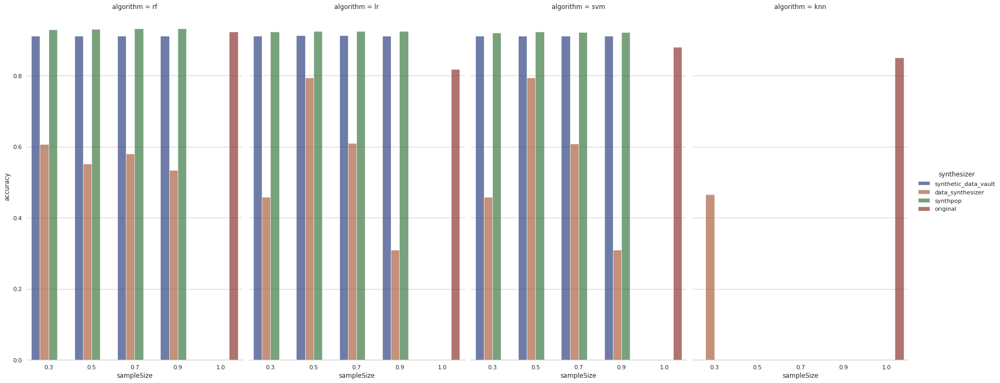

In [ ]:
plotAccuracyUpdated( "stratify")

In [ ]:
import seaborn as sns
def plotAccuracyUpdated_2(approach):
  sns.set_theme(style="whitegrid")
  df = accuracyDfFinal[(accuracyDfFinal["samplingApproach"] == approach) | (accuracyDfFinal["samplingApproach"] == 'original')]
  df = df.sample(int(len(df)/2))
  df = df.sort_values(by = "sampleSize")

  g = sns.catplot(x="sampleSize", y="accuracy", hue="synthesizer",
                col="algorithm", data=df, kind="bar")
  g.despine(left=True)


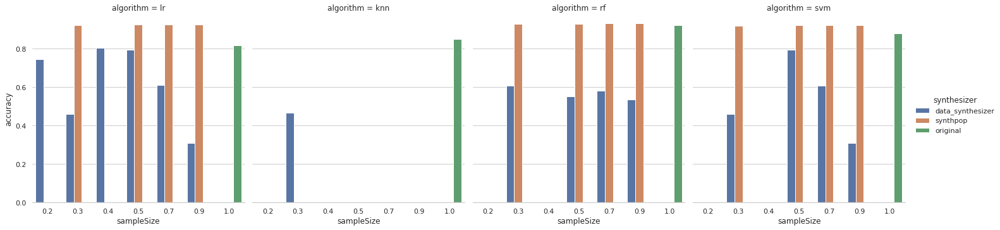

In [ ]:
plotAccuracyUpdated_2( "stratify")

In [ ]:
# currently DS and SDV point to default modes. e.g. random for DS and GaussianCopula for SDV
DS_DEFAULT_MODE = 'random'
SDV_DEFAULT_MODEL = 'GaussianCopula'

model_result_paths_census = {
    'Random Forest': {
        'Original': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.ORIGINAL}/rf_results.csv',
        'Synthpop': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.SYNTHPOP}/rf_results.csv',
        'Data_Synthesizer': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DS_DEFAULT_MODE}/rf_results.csv',
        'SDV': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.SDV}/{SDV_DEFAULT_MODEL}/rf_results.csv',
    },
    'Linear Regression': {
        'Original': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.ORIGINAL}/lr_results.csv',
        'Synthpop': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.SYNTHPOP}/lr_results.csv',
        'Data_Synthesizer': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DS_DEFAULT_MODE}/lr_results.csv',
        'SDV': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.SDV}/{SDV_DEFAULT_MODEL}/lr_results.csv',
    },
    'KNN': {
        'Original': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.ORIGINAL}/knn_results.csv',
        'Synthpop': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.SYNTHPOP}/knn_results.csv',
        'Data_Synthesizer': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DS_DEFAULT_MODE}/knn_results.csv',
        'SDV': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.SDV}/{SDV_DEFAULT_MODEL}/knn_results.csv',
    },
    'Support Vector Machine': {
        'Original': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.ORIGINAL}/svm_results.csv',
        'Synthpop': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.SYNTHPOP}/svm_results.csv',
        'Data_Synthesizer': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DS_DEFAULT_MODE}/svm_results.csv',
        'SDV': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.CENSUS}/{SynthetizationApproaches.SDV}/{SDV_DEFAULT_MODEL}/svm_results.csv',
    },

}
model_performance_statistics(model_result_paths_census, DatasetNames.CENSUS)

Charts for Random Forest


Charts for Linear Regression


Charts for KNN


Charts for Support Vector Machine


#### Confusion matrices

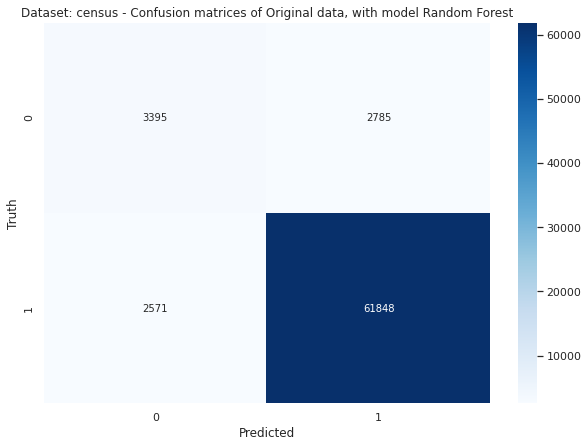

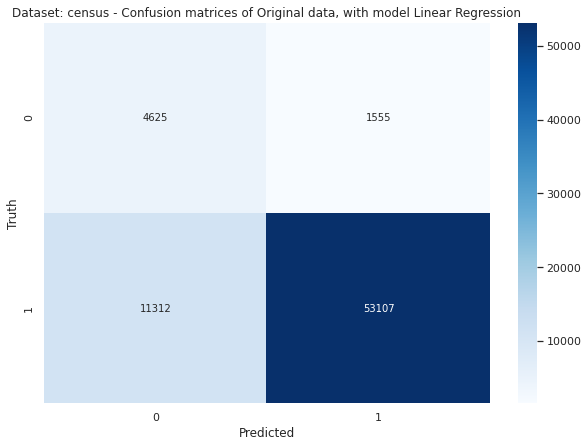

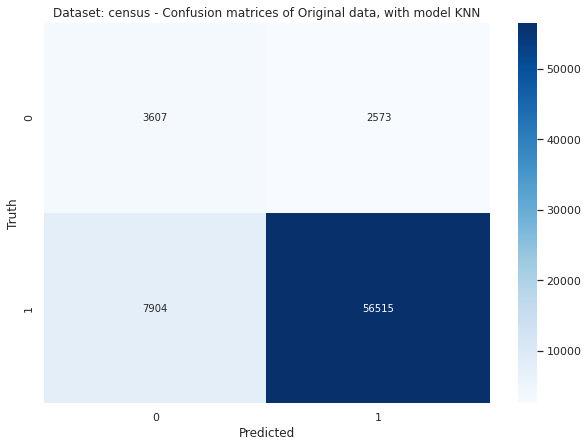

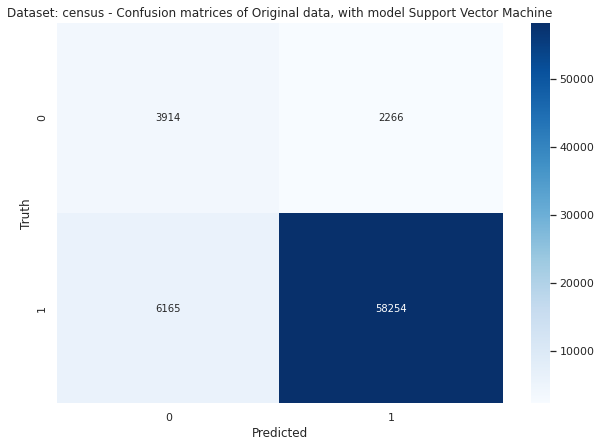

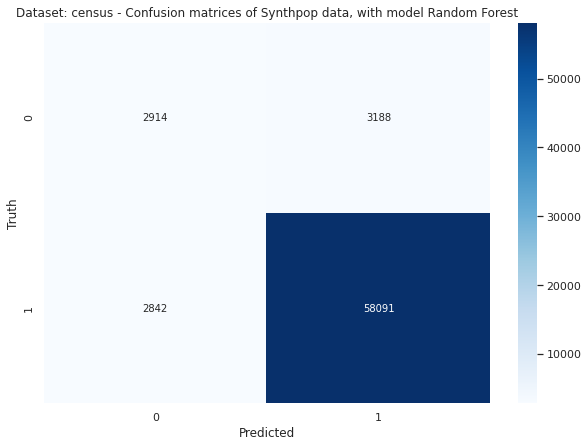

...

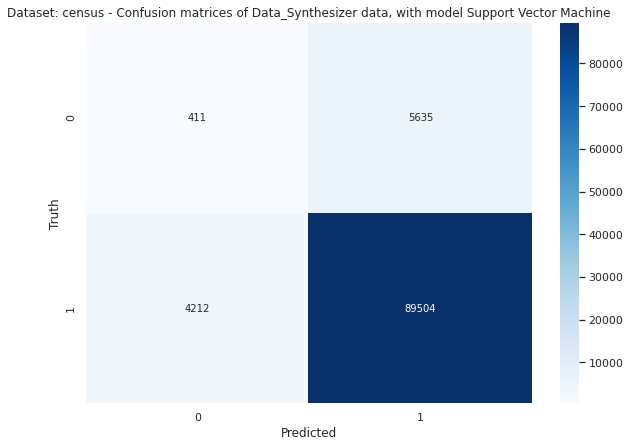

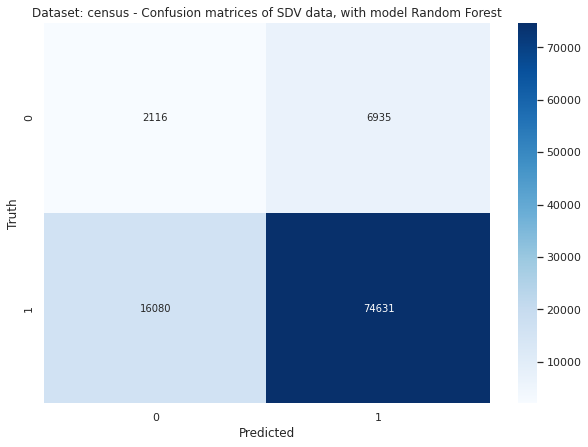

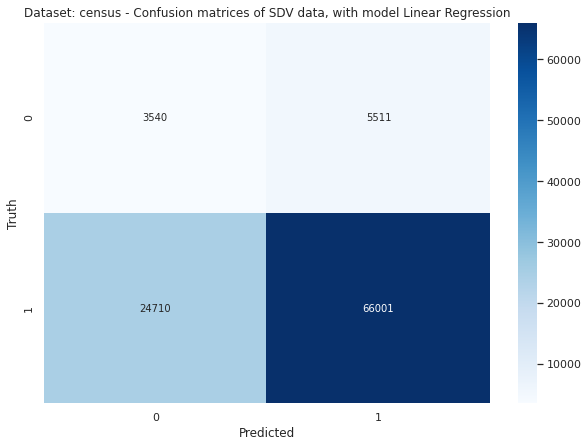

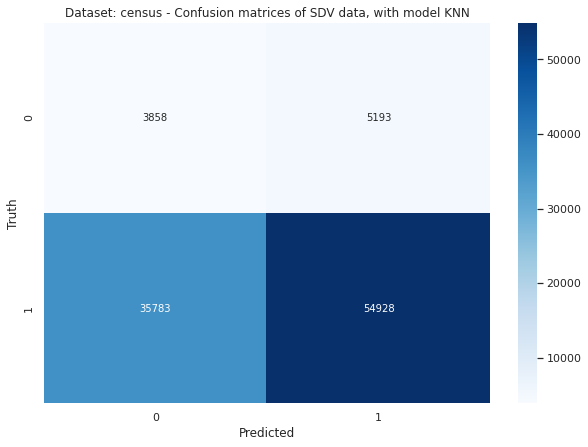

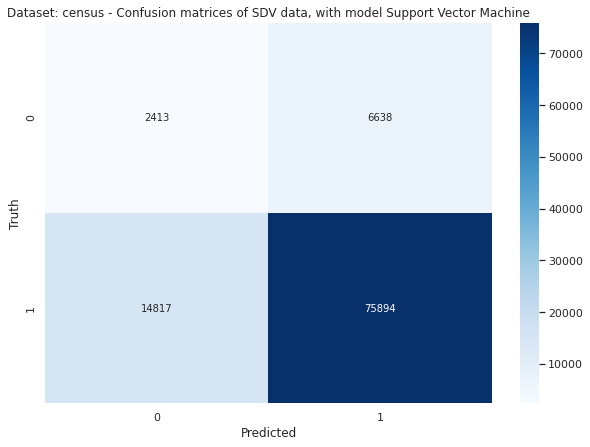

In [ ]:
plot_confusion_matrices(model_result_paths_census, DatasetNames.CENSUS)

#### Accuracy comparison only

In [ ]:
pd.DataFrame(accuracyDfFinal.groupby(["samplingApproach", "synthesizer", "samplingApproach", "algorithm", "sampleSize"])["accuracy"].mean())

accuracy
samplingApproach synthesizer      samplingApproach algorithm sampleSize          
original         original         original         knn       1.0         0.851598
                                                   lr        1.0         0.817745
                                                   rf        1.0         0.924135
                                                   svm       1.0         0.880579
random           data_synthesizer random           knn       0.3         0.475106
...                                                                           ...
stratify         synthpop         stratify         rf        0.9         0.932279
                                                   svm       0.3         0.920310
                                                             0.5         0.923568
                                                             0.7         0.921812
                                                             0.9         0.922138

[77 rows x 1 columns]

In [ ]:
results = get_accuracy_tables(model_result_paths_census, DatasetNames.CENSUS)
pd.DataFrame(results)

,Random Forest,Linear Regression,KNN,Support Vector Machine
Original,0.924135,0.817745,0.851598,0.880579
Synthpop,0.910047,0.811322,0.847796,0.872947
Data_Synthesizer,0.925553,0.717538,0.840731,0.901295
SDV,0.769301,0.697069,0.589262,0.784938


## Comparison of data utility in classification tasks - Forest Dataset

### Performance metrics comparison

In [ ]:
# currently DS and SDV point to default modes. e.g. random for DS and GaussianCopula for SDV
DS_DEFAULT_MODE = 'random'
SDV_DEFAULT_MODEL = 'GaussianCopula'

model_result_paths_forest = {
    'Random Forest': {
        'Original': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.ORIGINAL}/rf_results.csv',
        'Synthpop': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.SYNTHPOP}/rf_results.csv',
        'Data_Synthesizer': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DS_DEFAULT_MODE}/rf_results.csv',
        'SDV': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.SDV}/{SDV_DEFAULT_MODEL}/rf_results.csv',
    },
    'Linear Regression': {
        'Original': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.ORIGINAL}/lr_results.csv',
        'Synthpop': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.SYNTHPOP}/lr_results.csv',
        'Data_Synthesizer': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DS_DEFAULT_MODE}/lr_results.csv',
        'SDV': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.SDV}/{SDV_DEFAULT_MODEL}/lr_results.csv',
    },
    'KNN': {
        'Original': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.ORIGINAL}/knn_results.csv',
        'Synthpop': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.SYNTHPOP}/knn_results.csv',
        'Data_Synthesizer': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DS_DEFAULT_MODE}/knn_results.csv',
        'SDV': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.SDV}/{SDV_DEFAULT_MODEL}/knn_results.csv',
    },
    'Support Vector Machine': {
        'Original': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.ORIGINAL}/svm_results.csv',
        'Synthpop': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.SYNTHPOP}/svm_results.csv',
        'Data_Synthesizer': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DS_DEFAULT_MODE}/svm_results.csv',
        'SDV': f'{PATH_TO_TRAINING_RESULTS}/{DatasetNames.FOREST}/{SynthetizationApproaches.SDV}/{SDV_DEFAULT_MODEL}/svm_results.csv',
    },

}
model_performance_statistics(model_result_paths_forest, DatasetNames.FOREST)

Charts for Random Forest


Charts for Linear Regression


Charts for KNN


Charts for Support Vector Machine


### Confusion matrices

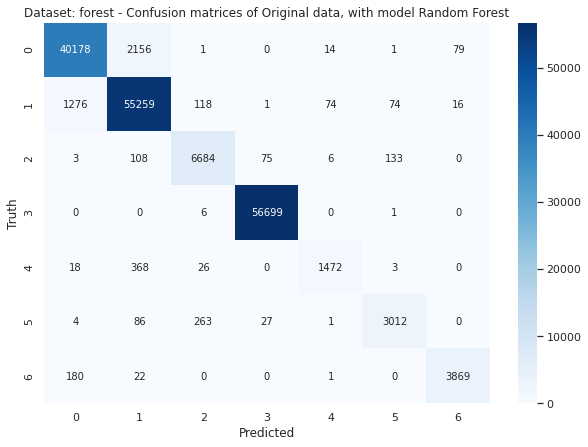

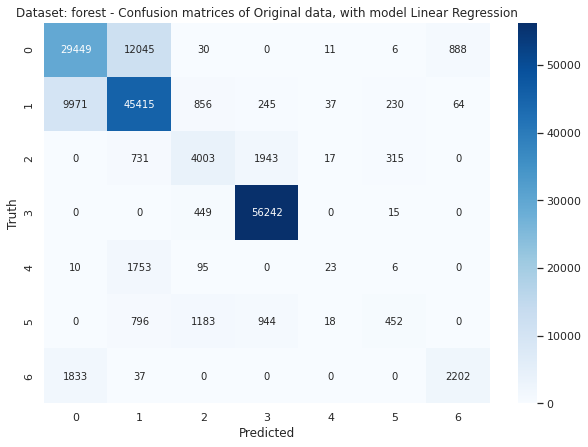

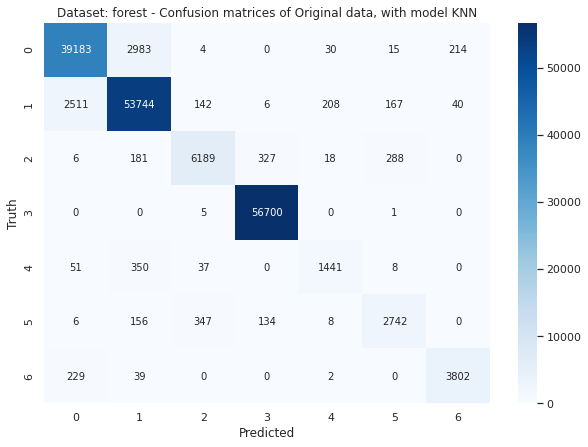

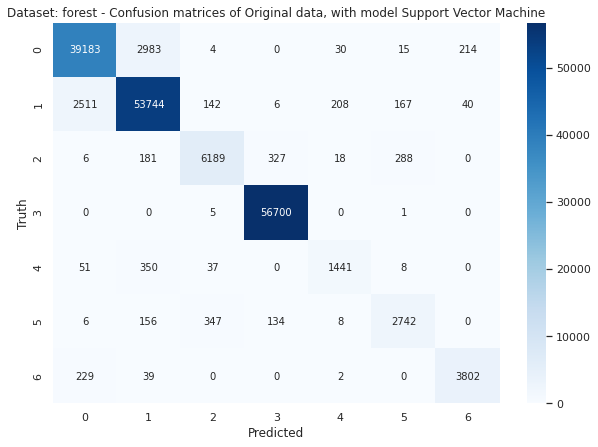

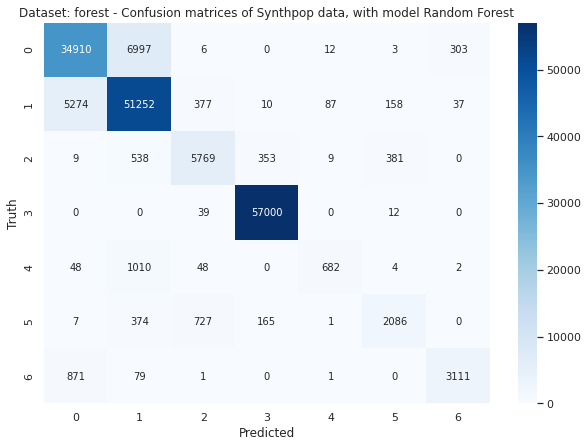

...

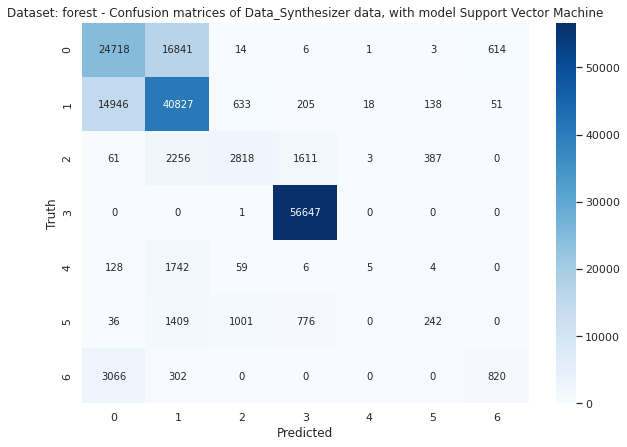

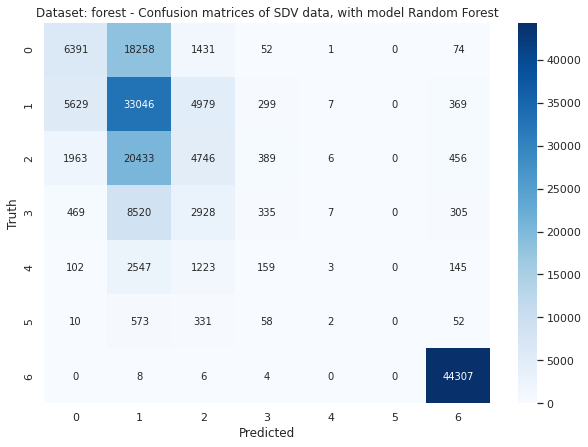

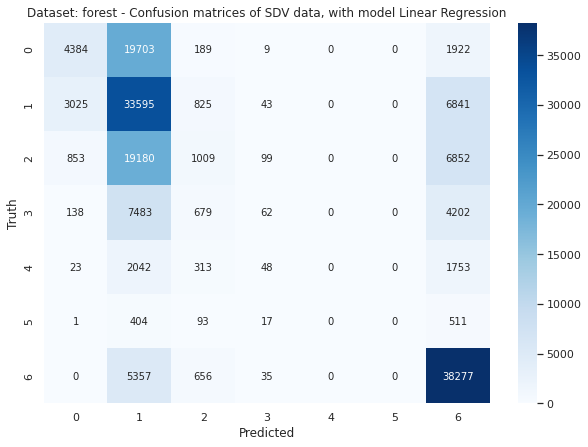

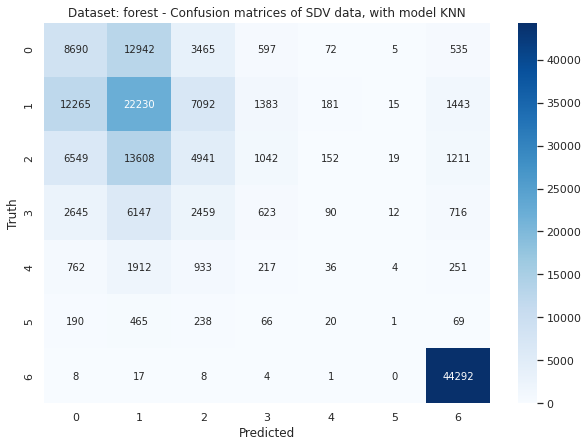

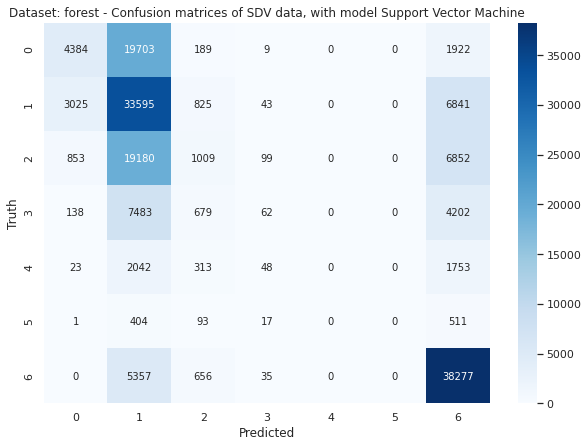

In [ ]:
plot_confusion_matrices(model_result_paths_forest, DatasetNames.FOREST)

### Accuracy comparison only

In [ ]:
results = get_accuracy_tables(model_result_paths_forest, DatasetNames.FOREST)
pd.DataFrame(results)

,Random Forest,Linear Regression,KNN,Support Vector Machine
Original,0.970165,0.799622,0.950596,0.950596
Synthpop,0.896135,0.788148,0.872668,0.788148
Data_Synthesizer,0.783074,0.756002,0.731326,0.731326
SDV,0.553022,0.481419,0.503122,0.481419


## Synthetic vs Original Data - Statistically


### Census

In [ ]:
# Census Data CSV's
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"
SAMPLE_APPROACH_stratify = "stratify"
SAMPLE_APPROACH_random = "random"
sampleSize = 0.2
DS_DEFAULT_MODE = 'random'
SDV_DEFAULT_MODEL = 'GaussianCopula'

original_data = pd.read_csv(f'{PATH_TO_ORIGINAL_DATASETS}/{DatasetNames.CENSUS}/train.csv', names=CENSUS_COLUMNS_RENAMED)
original_data = original_data.drop(CENSUS_COLUMNS_TO_DROP,axis=1)
original_data = label_encode(original_data)

ds_data=pd.read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{DS_DEFAULT_MODE}/synthetic_data_train.csv')
sdv_data=read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SDV_DEFAULT_MODEL}/synthetic_data_train.csv')
synthpop_data=pd.read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.SYNTHPOP}/{DatasetNames.CENSUS}/synthetic_data_train.csv')





#### Compare column distributions

In [ ]:
# original_data.shape, sdv_data.shape, 

In [ ]:
# # sampling the data
# original_data = original_data.sample(9000)
# ds_data = ds_data.sample(9000)
# sdv_data = sdv_data.sample(9000)
# synthpop_data = synthpop_data.sample(9000)


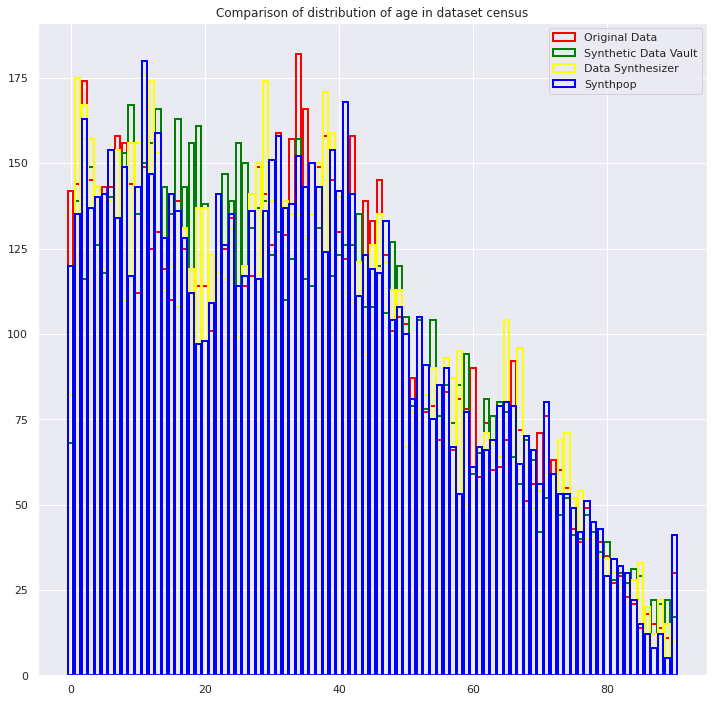

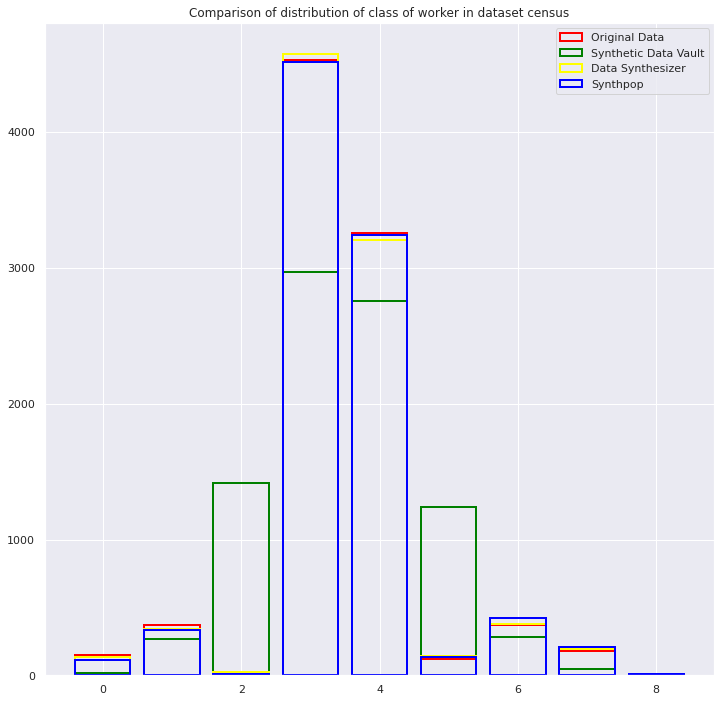

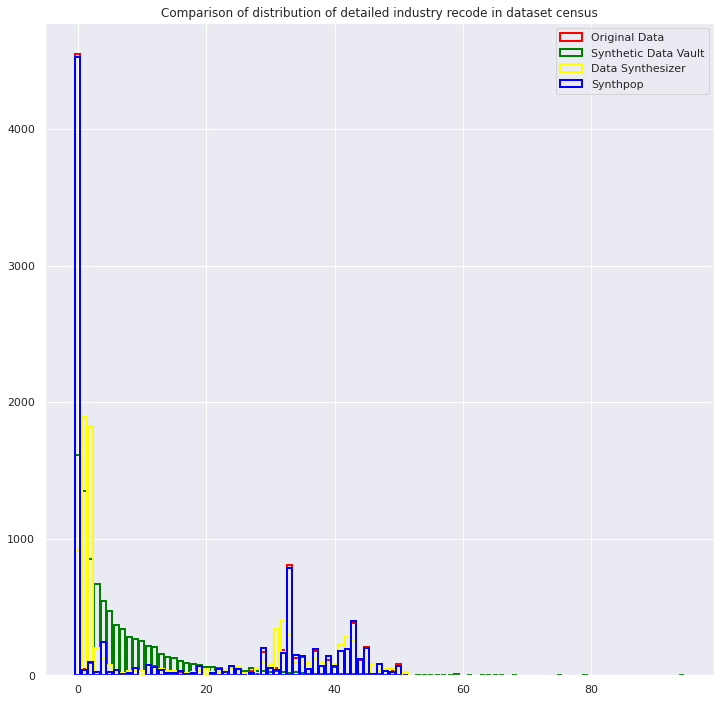

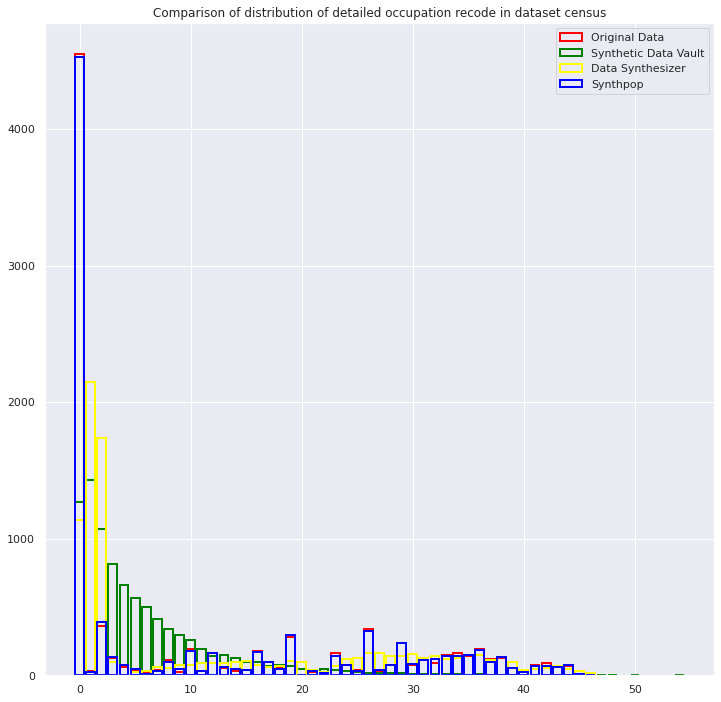

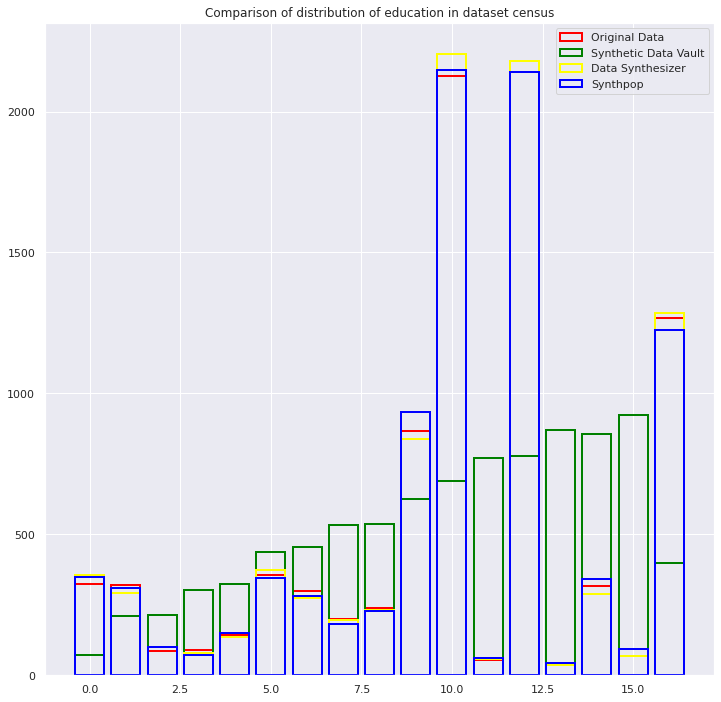

...

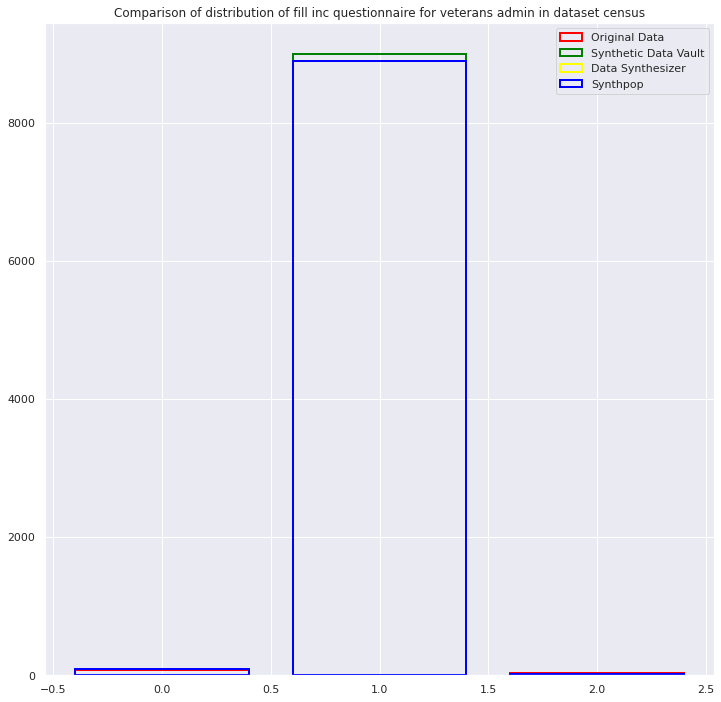

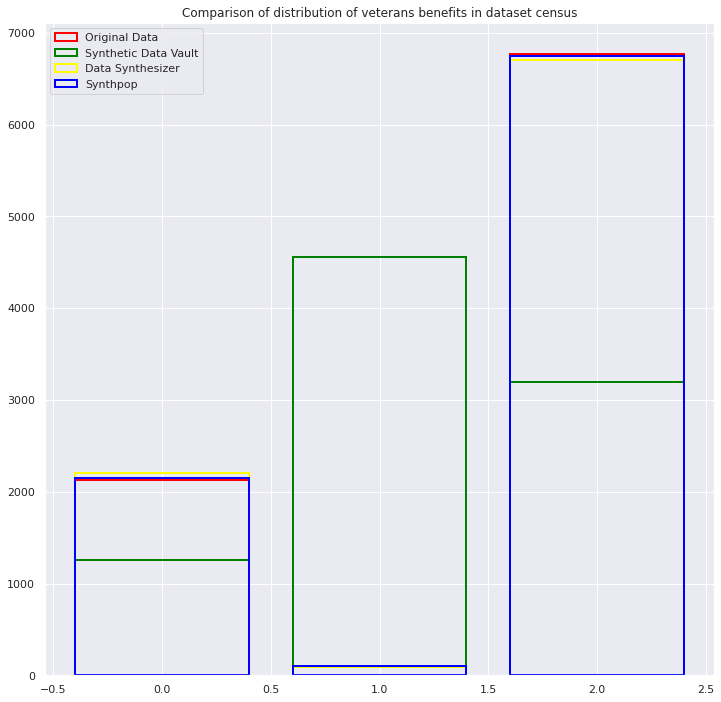

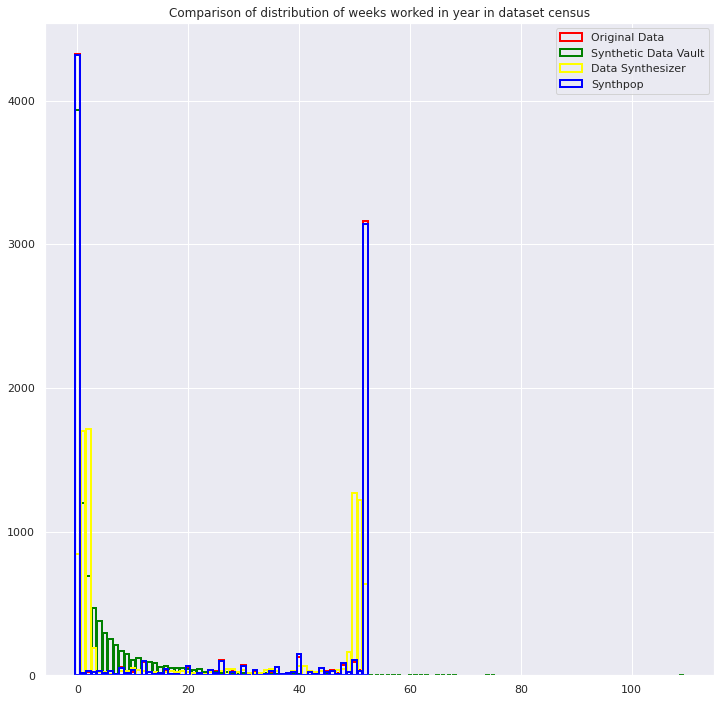

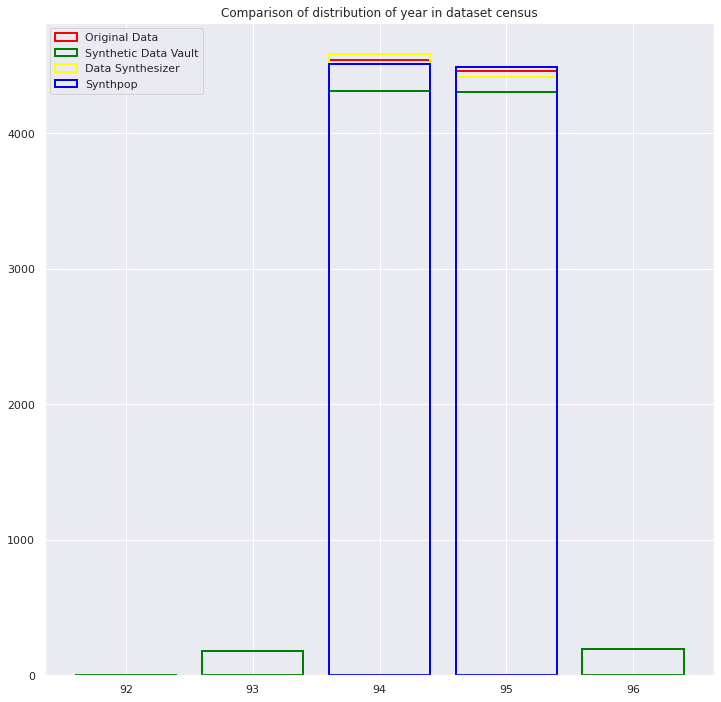

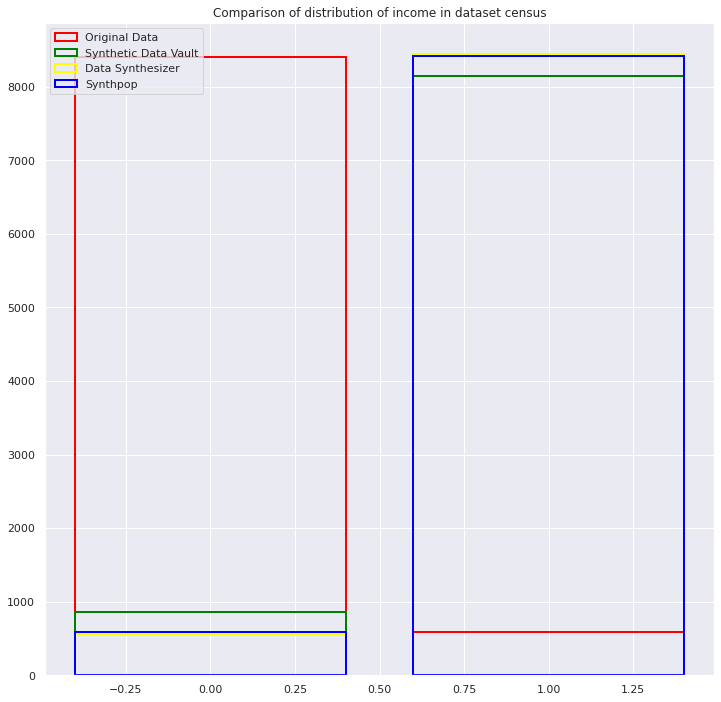

In [ ]:
plot_distribution_comparisons(original_data=original_data, sdv_data=sdv_data, ds_data=ds_data, 
                              synthpop_data=synthpop_data, dataset_name=DatasetNames.CENSUS)

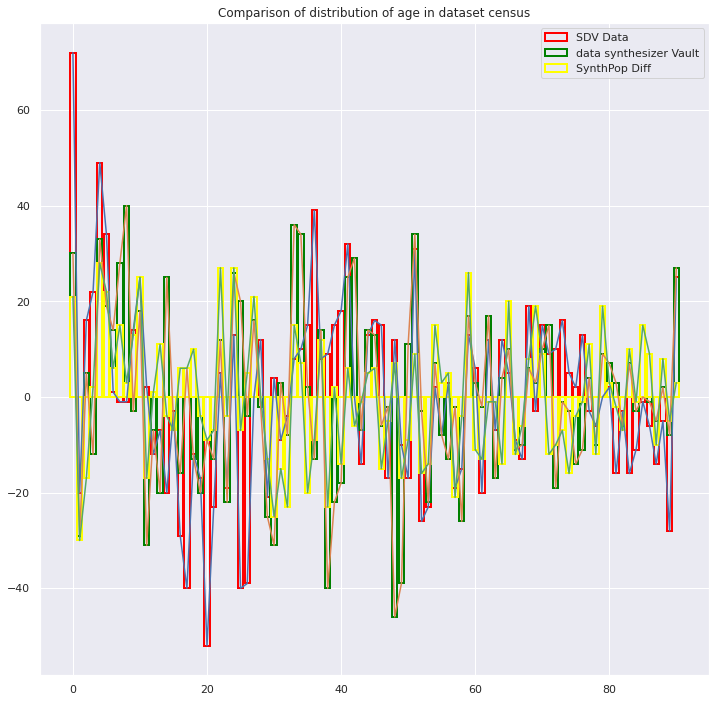

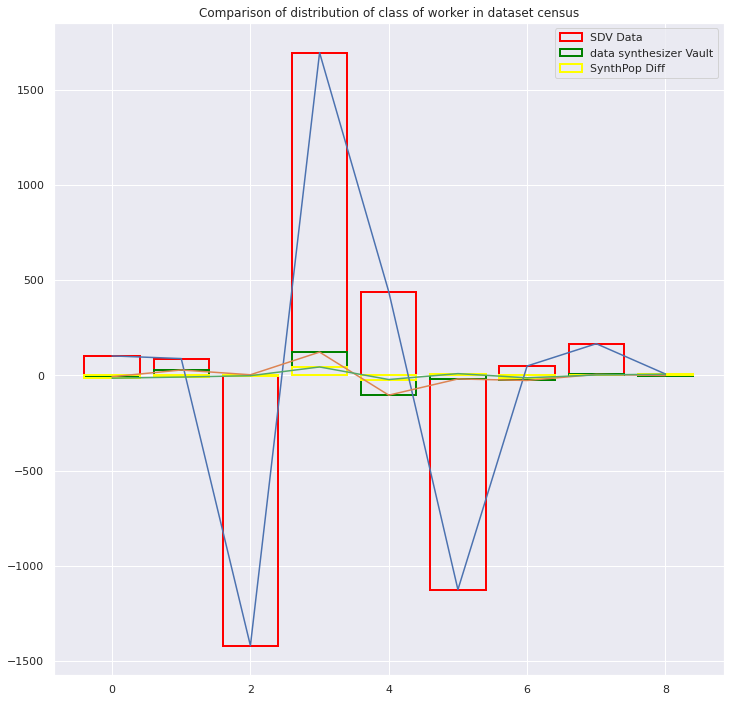

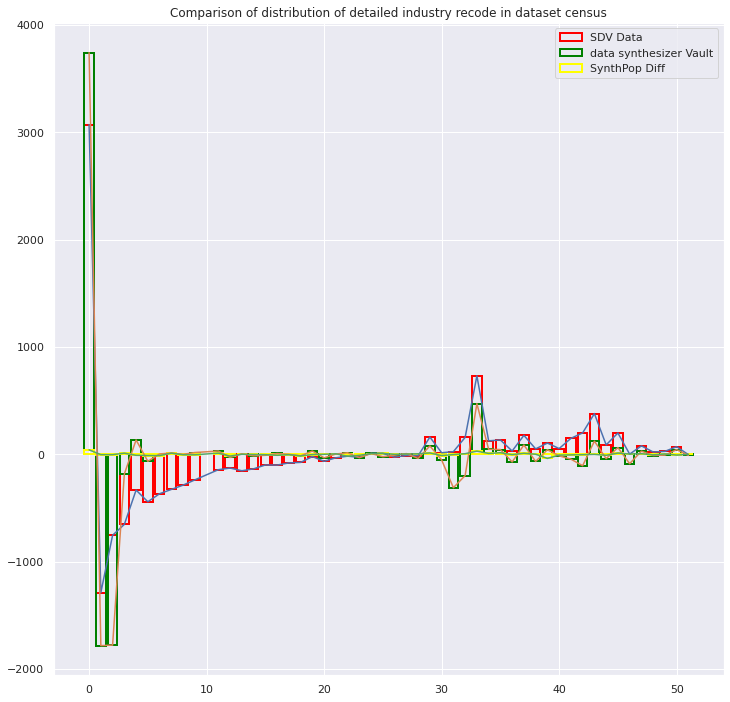

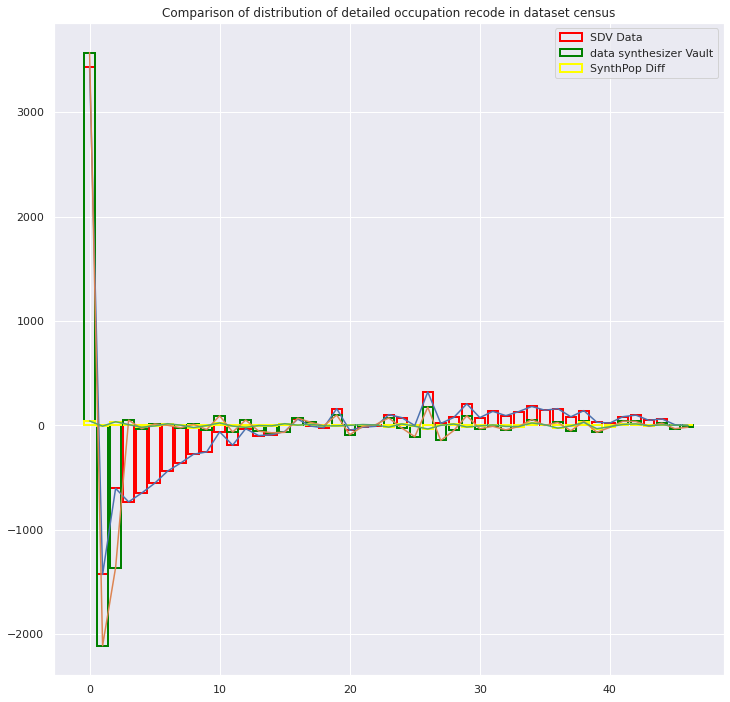

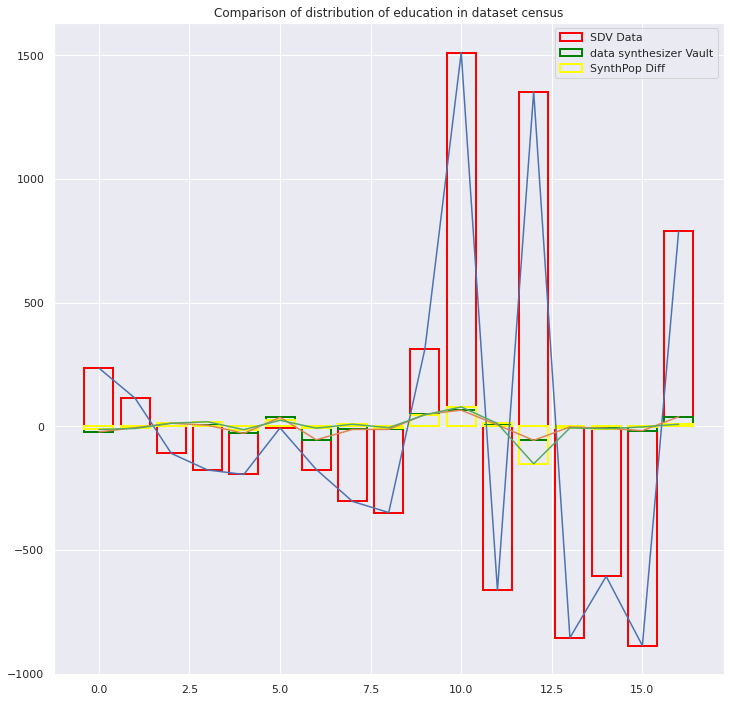

...

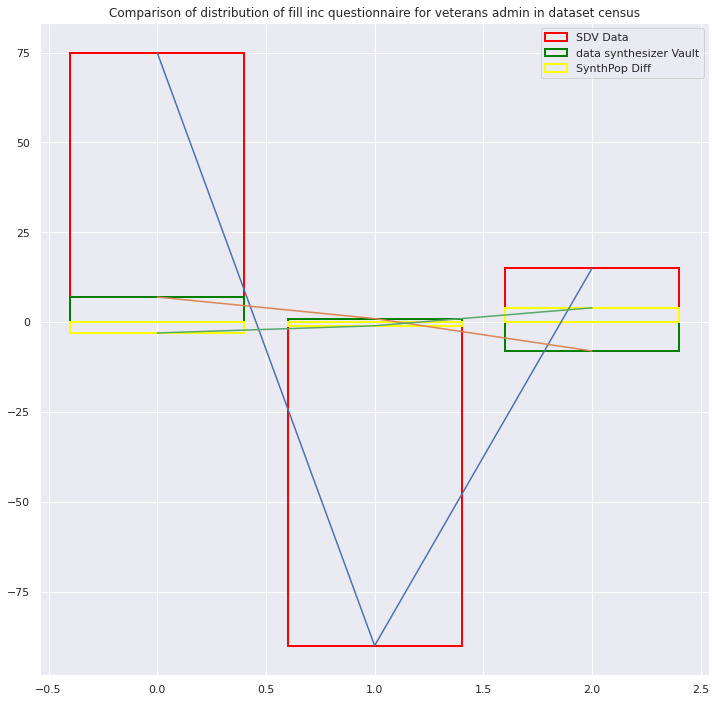

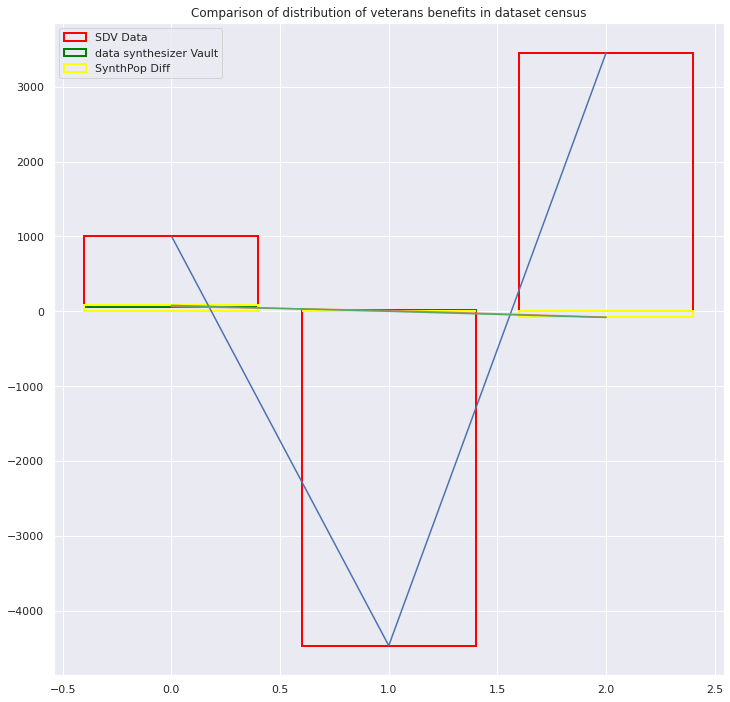

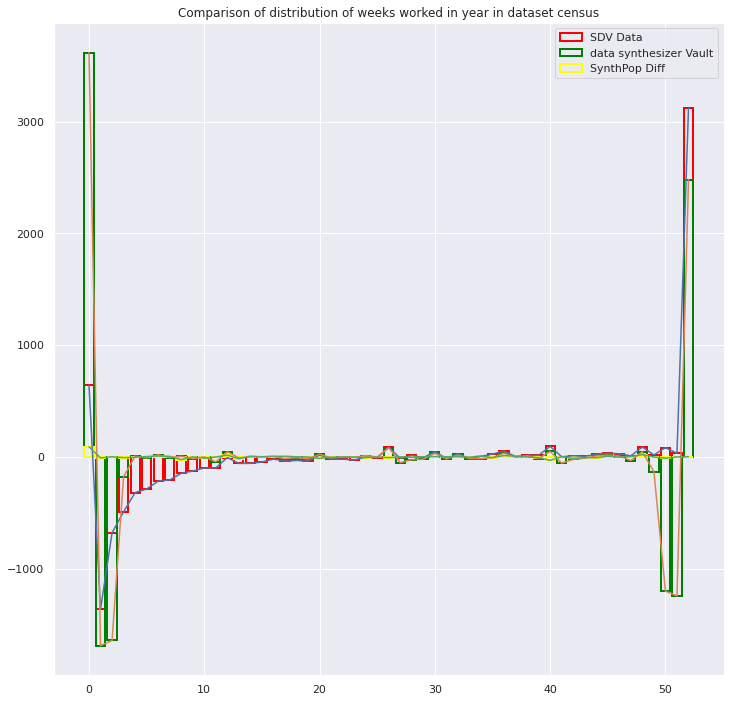

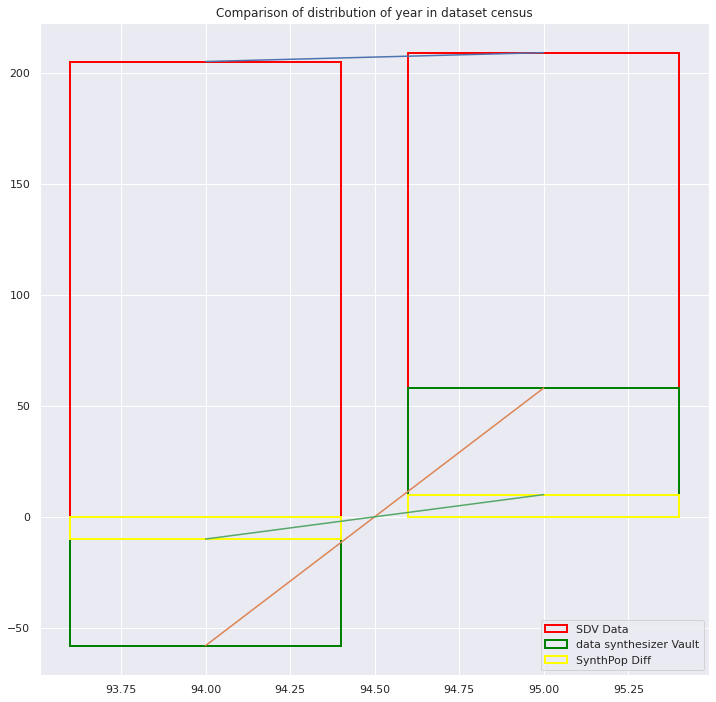

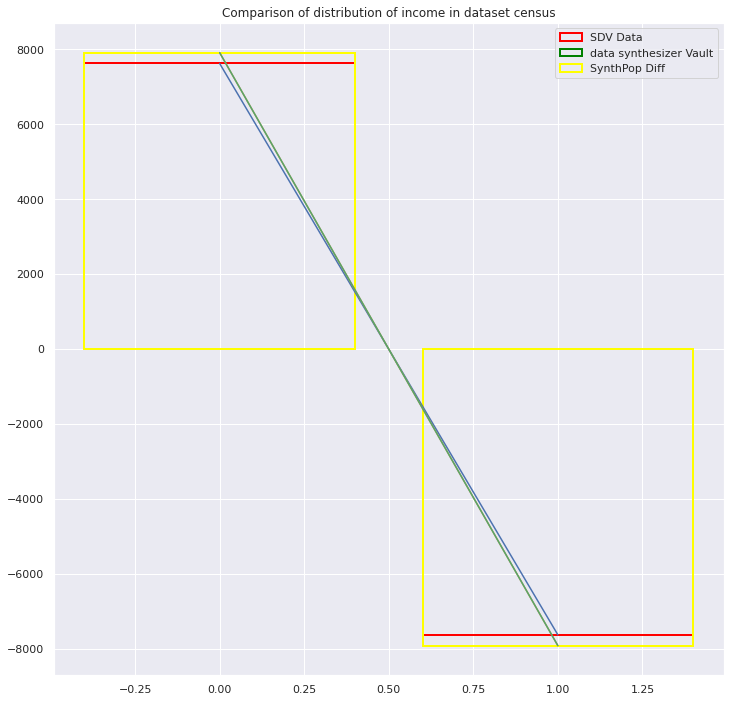

In [ ]:
plot_distribution_comparisons_difference(original_data=original_data, sdv_data=sdv_data, ds_data=ds_data, 
                              synthpop_data=synthpop_data, dataset_name=DatasetNames.CENSUS)

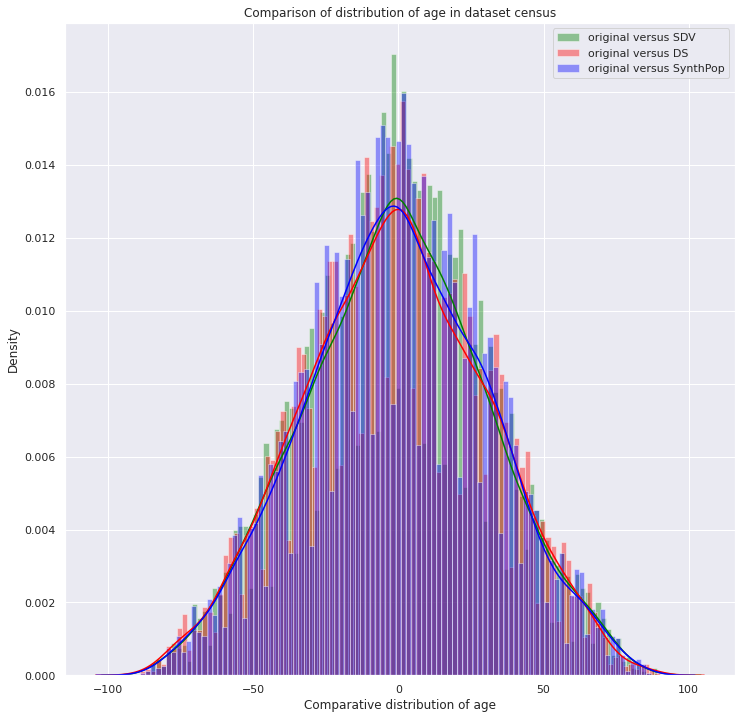

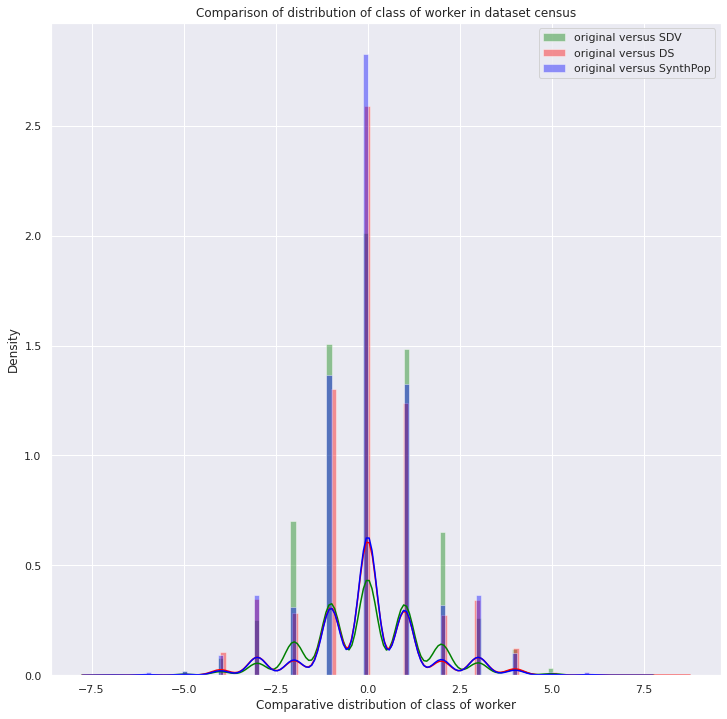

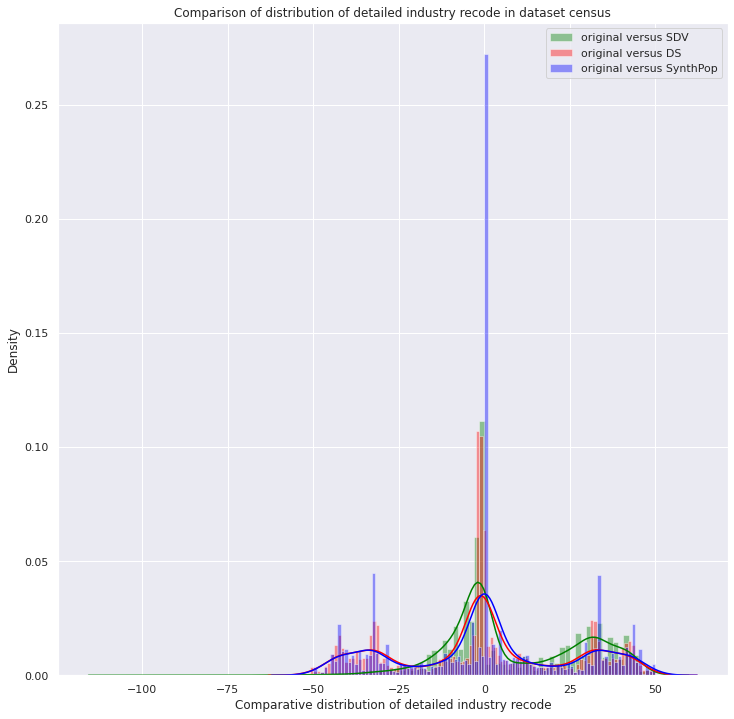

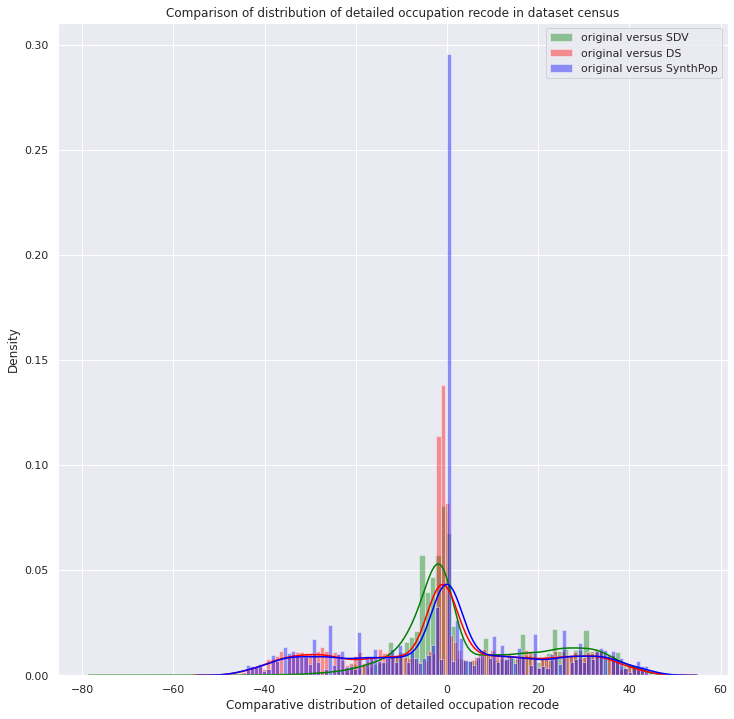

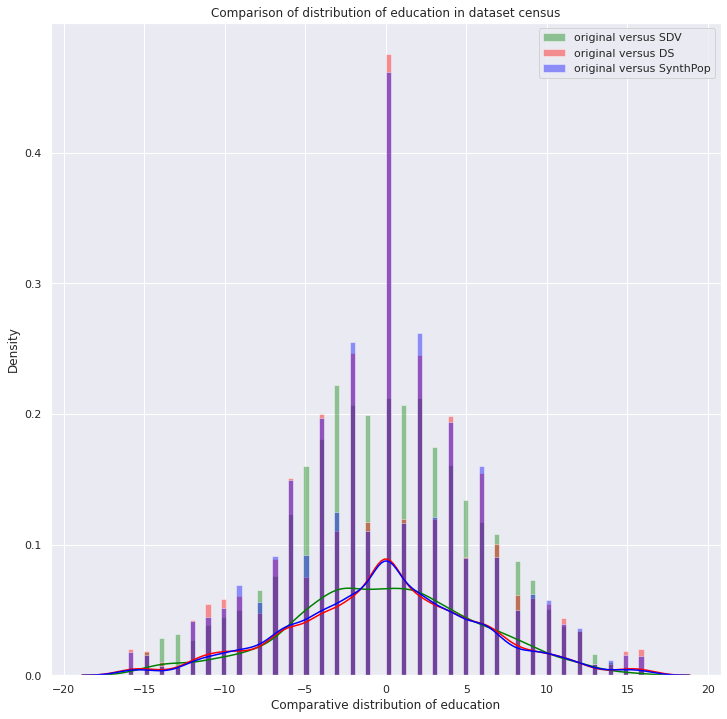

...

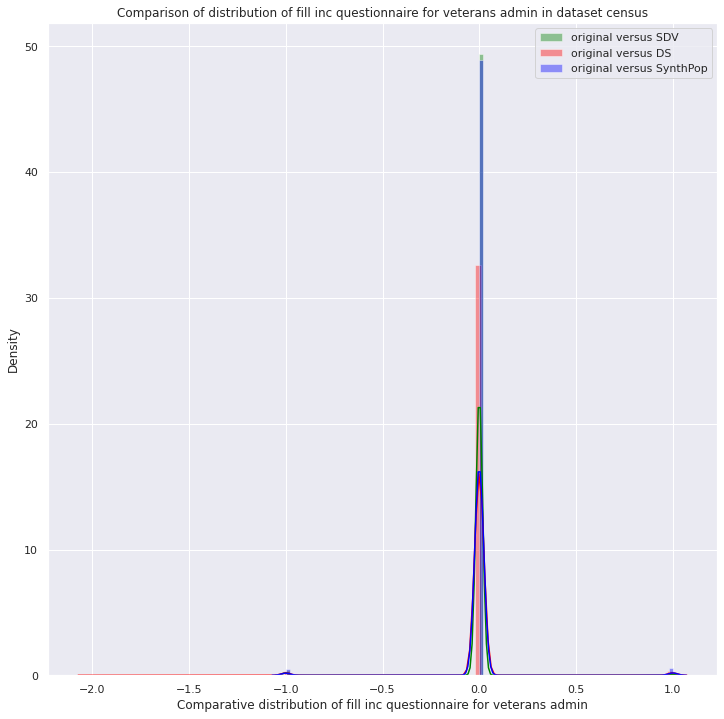

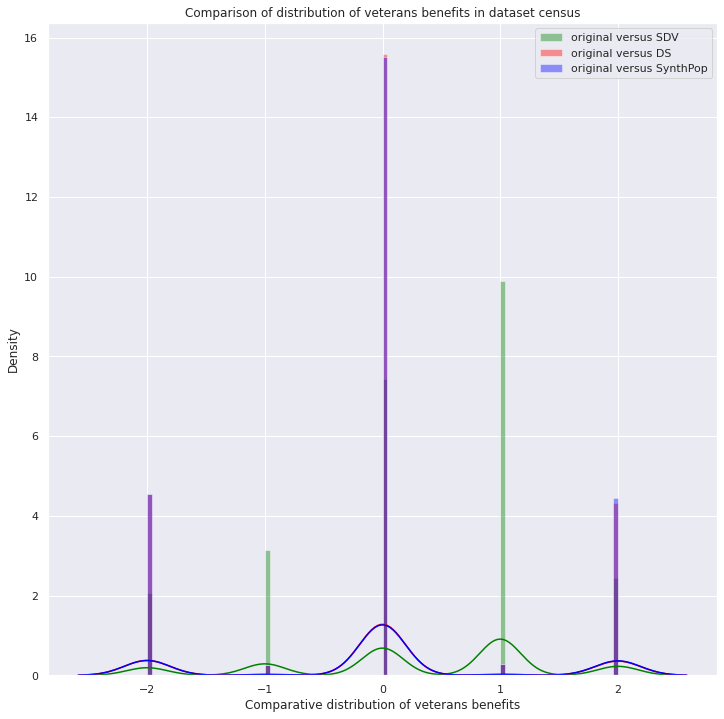

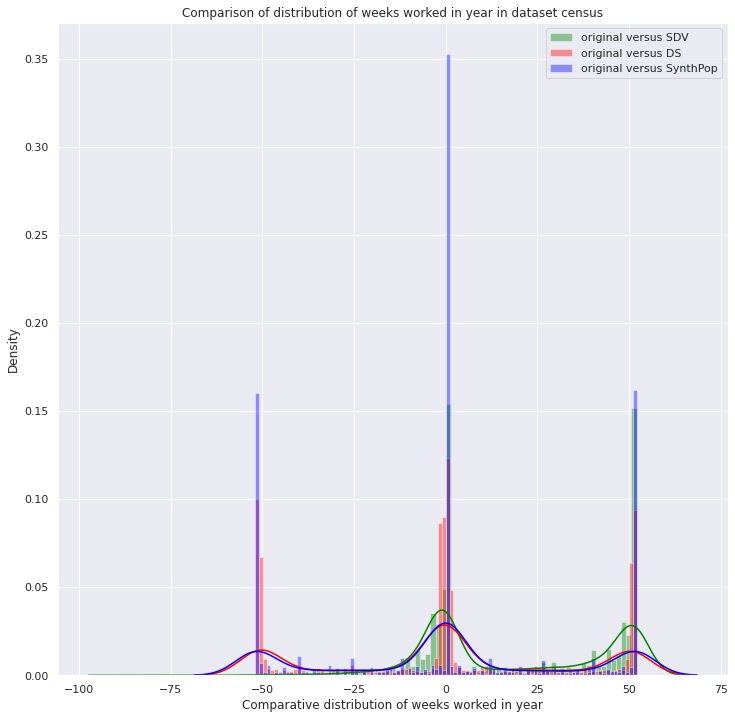

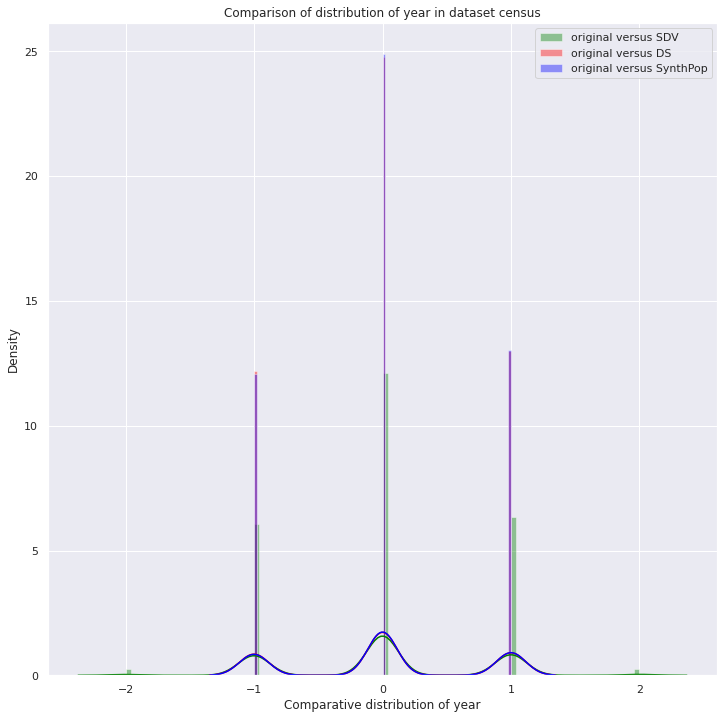

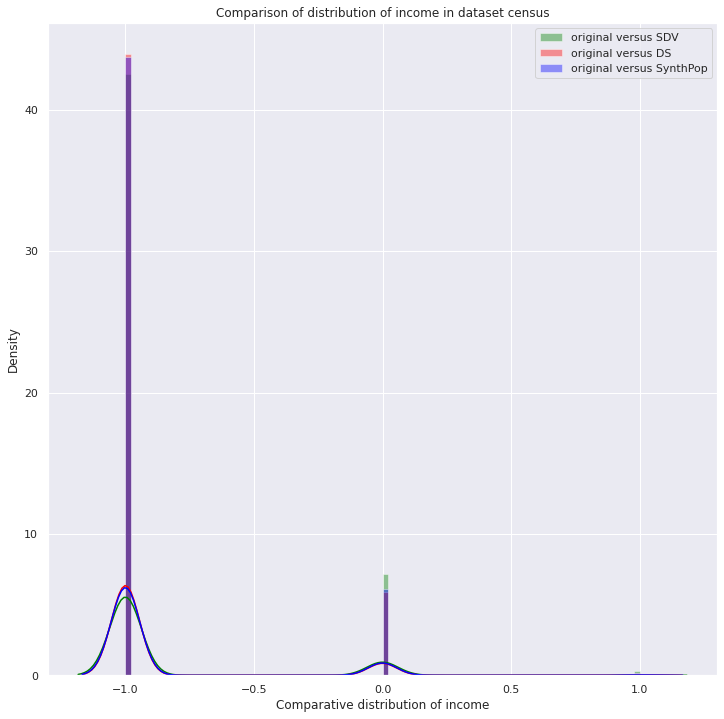

In [ ]:
plot_comparative_distribution_comparisons(original_data=original_data, sdv_data=sdv_data, ds_data=ds_data, 
                              synthpop_data=synthpop_data, dataset_name=DatasetNames.CENSUS)

#### Compare heatmaps

## Data Synthesizer appproach for sampling

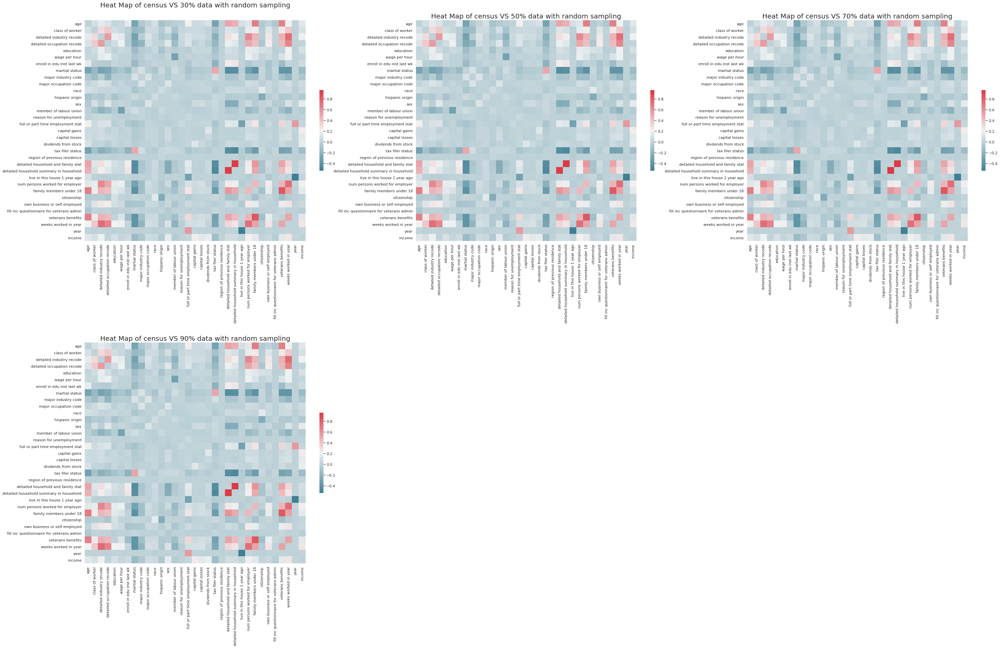

In [ ]:
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"
sampleSize = 0.3
sample_data_30=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_random}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.5
sample_data_50=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_random}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.7
sample_data_70=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_random}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.9
sample_data_90=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_random}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')

plot_heat_maps(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               sampleApproach = 'random', sample_data_30 = sample_data_30, sample_data_50 = sample_data_50, sample_data_70 = sample_data_70,
                   sample_data_90 = sample_data_90)


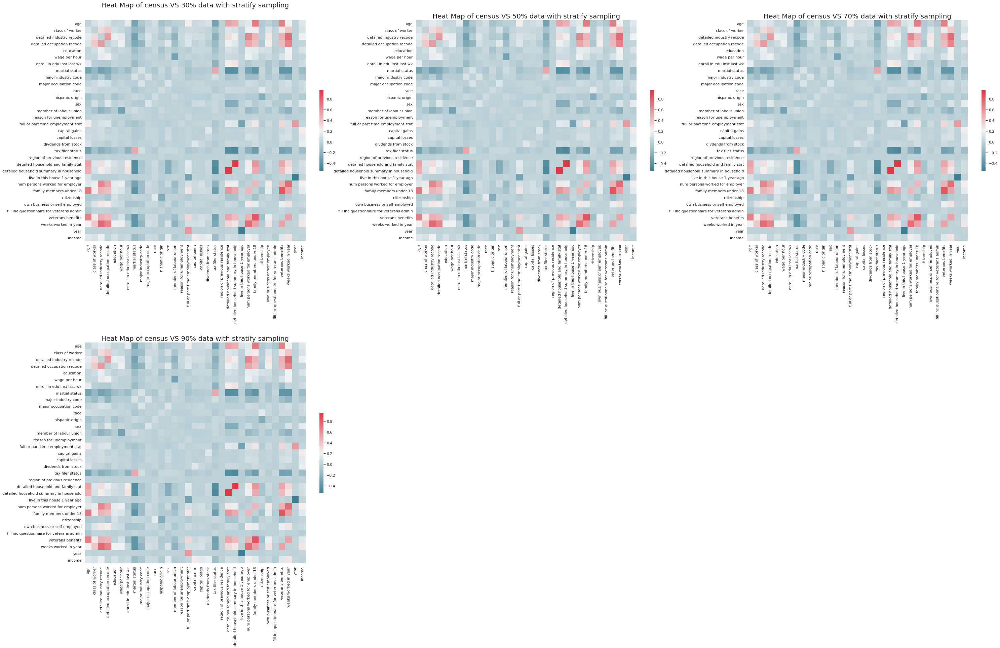

In [ ]:
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"
sampleSize = 0.3
sample_data_30=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.5
sample_data_50=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.7
sample_data_70=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.9
sample_data_90=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')

plot_heat_maps(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               sampleApproach = 'stratify', sample_data_30 = sample_data_30, sample_data_50 = sample_data_50, sample_data_70 = sample_data_70,
                   sample_data_90 = sample_data_90)


## Synthpop apporach for sampling

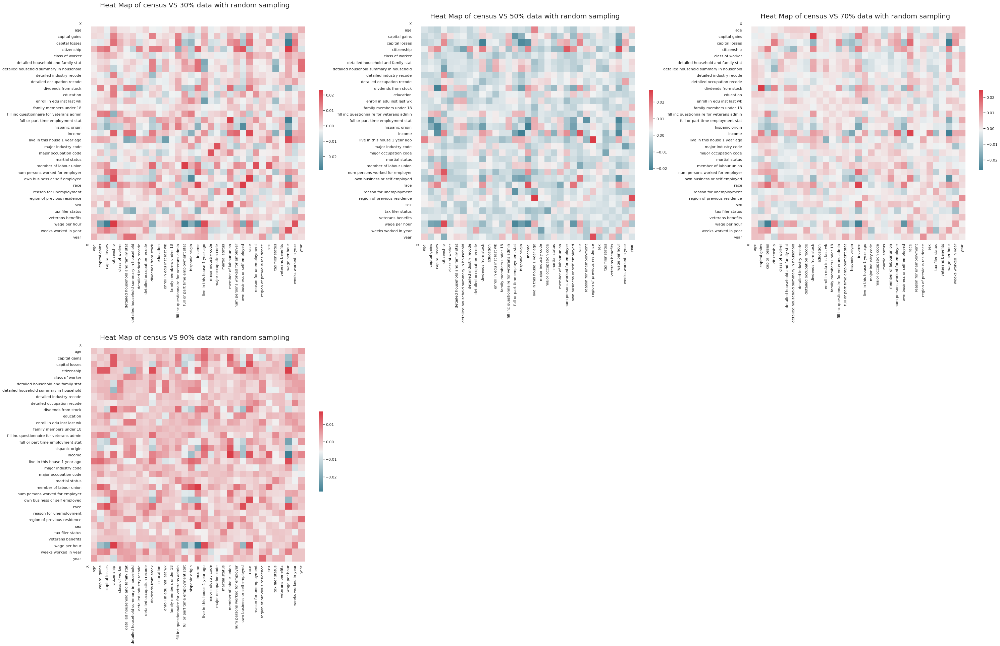

In [ ]:
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"

sampleSize = 0.3
sample_data_30 = pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_random}_{str(sampleSize)}_.csv')
sample_data_30.columns = list(map(lambda x: x.replace("."," "),(sample_data_30.columns.to_list())))
sampleSize = 0.5
sample_data_50=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_random}_{str(sampleSize)}_.csv')
sample_data_50.columns = list(map(lambda x: x.replace("."," "),(sample_data_50.columns.to_list())))

sampleSize = 0.7
sample_data_70=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_random}_{str(sampleSize)}_.csv')
sample_data_70.columns = list(map(lambda x: x.replace("."," "),(sample_data_70.columns.to_list())))

sampleSize = 0.9
sample_data_90=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_random}_{str(sampleSize)}_.csv')
sample_data_90.columns = list(map(lambda x: x.replace("."," "),(sample_data_90.columns.to_list())))

plot_heat_maps(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               sampleApproach = 'random', sample_data_30 = sample_data_30, sample_data_50 = sample_data_50, sample_data_70 = sample_data_70,
                   sample_data_90 = sample_data_90)


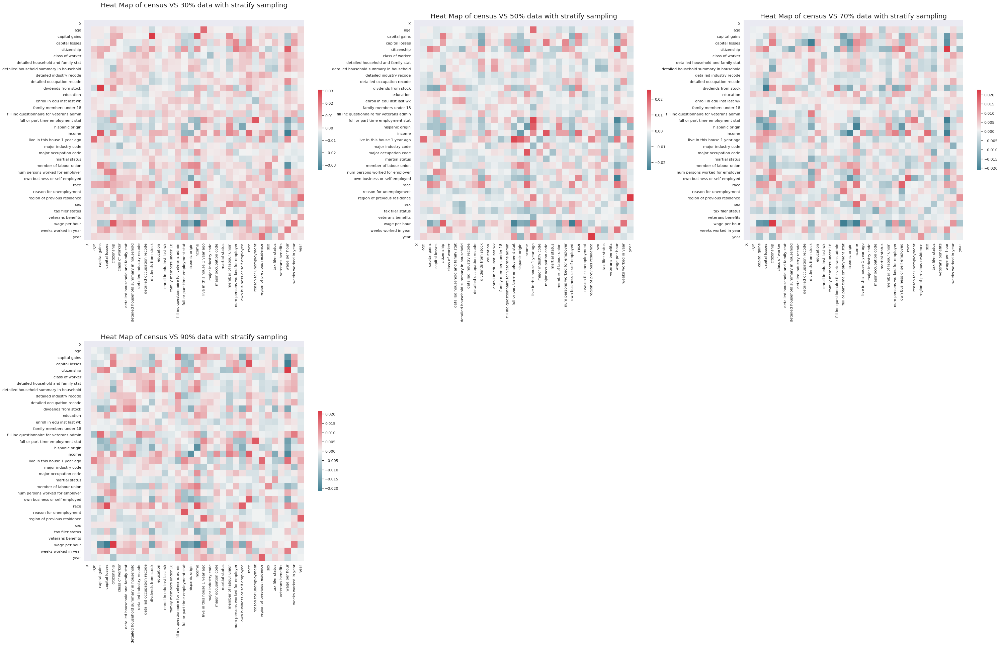

In [ ]:
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"

sampleSize = 0.3
sample_data_30 = pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_stratify}_{str(sampleSize)}_.csv')
sample_data_30.columns = list(map(lambda x: x.replace("."," "),(sample_data_30.columns.to_list())))
sampleSize = 0.5
sample_data_50=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_stratify}_{str(sampleSize)}_.csv')
sample_data_50.columns = list(map(lambda x: x.replace("."," "),(sample_data_50.columns.to_list())))

sampleSize = 0.7
sample_data_70=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_stratify}_{str(sampleSize)}_.csv')
sample_data_70.columns = list(map(lambda x: x.replace("."," "),(sample_data_70.columns.to_list())))

sampleSize = 0.9
sample_data_90=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_stratify}_{str(sampleSize)}_.csv')
sample_data_90.columns = list(map(lambda x: x.replace("."," "),(sample_data_90.columns.to_list())))

plot_heat_maps(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               sampleApproach = 'stratify', sample_data_30 = sample_data_30, sample_data_50 = sample_data_50, sample_data_70 = sample_data_70,
                   sample_data_90 = sample_data_90)


## SDV Sampling approach

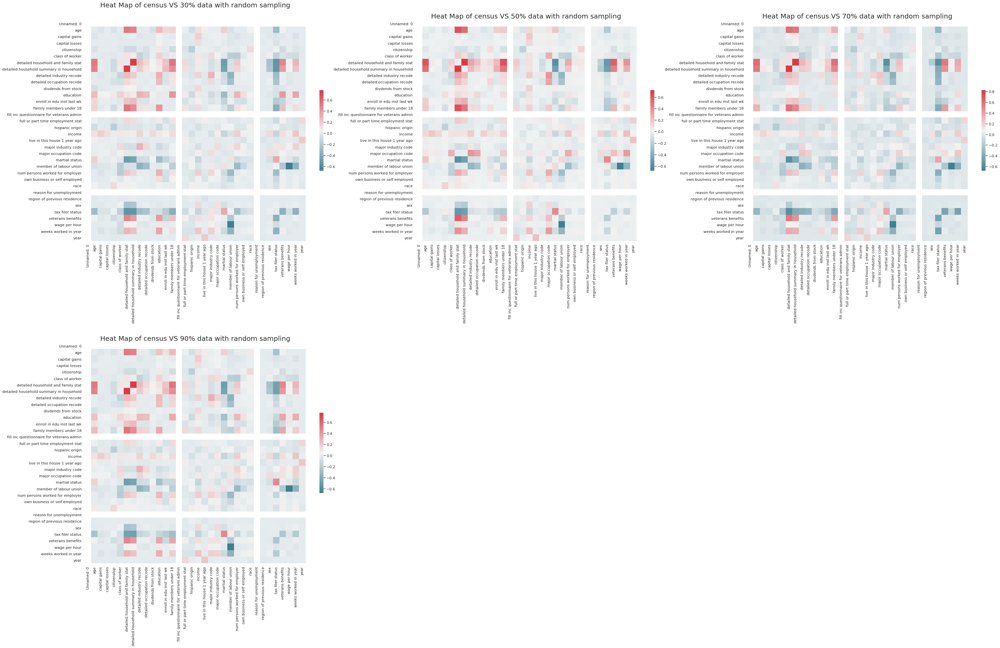

In [ ]:
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"
sampleSize = 0.3
sample_data_30=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_random}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
sample_data_30 = label_encode(sample_data_30)
sampleSize = 0.5
sample_data_50=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_random}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
sample_data_50 = label_encode(sample_data_50)
sampleSize = 0.7
sample_data_70=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_random}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
sample_data_70 = label_encode(sample_data_70)
sampleSize = 0.9
sample_data_90=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_random}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
sample_data_90 = label_encode(sample_data_90)

plot_heat_maps(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               sampleApproach = 'random', sample_data_30 = sample_data_30, sample_data_50 = sample_data_50, sample_data_70 = sample_data_70,
                   sample_data_90 = sample_data_90)


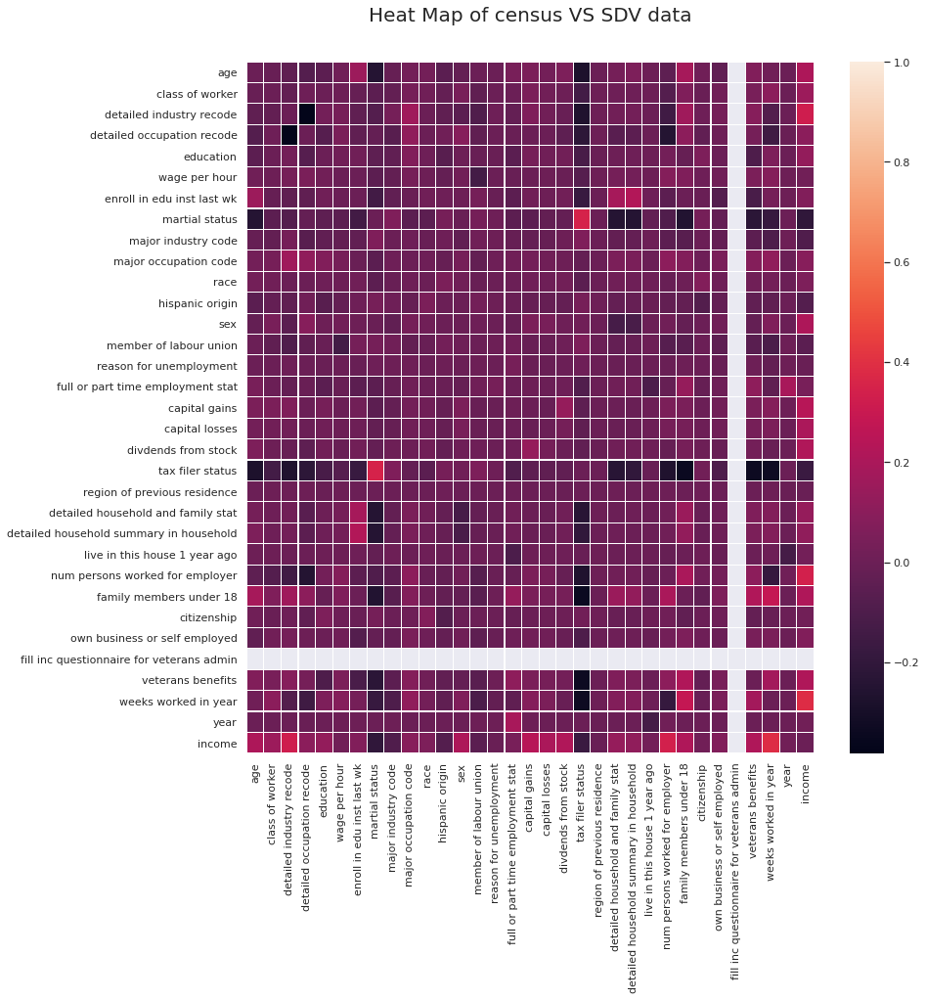

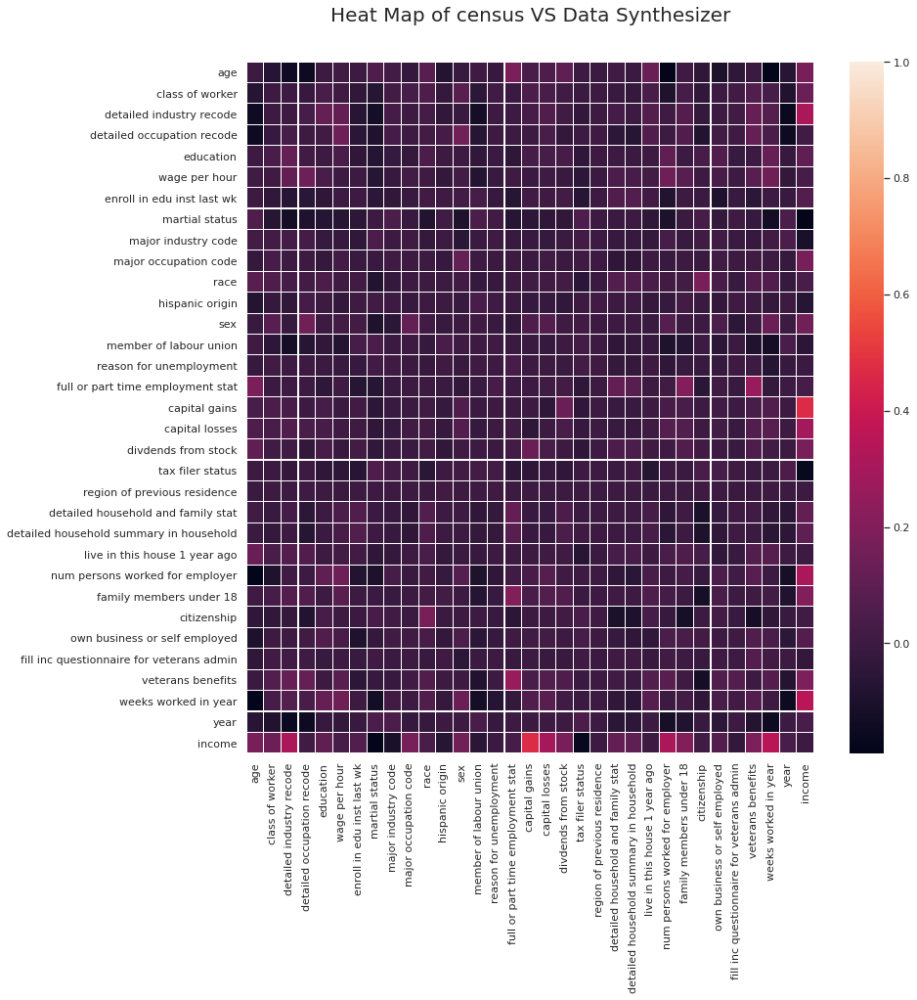

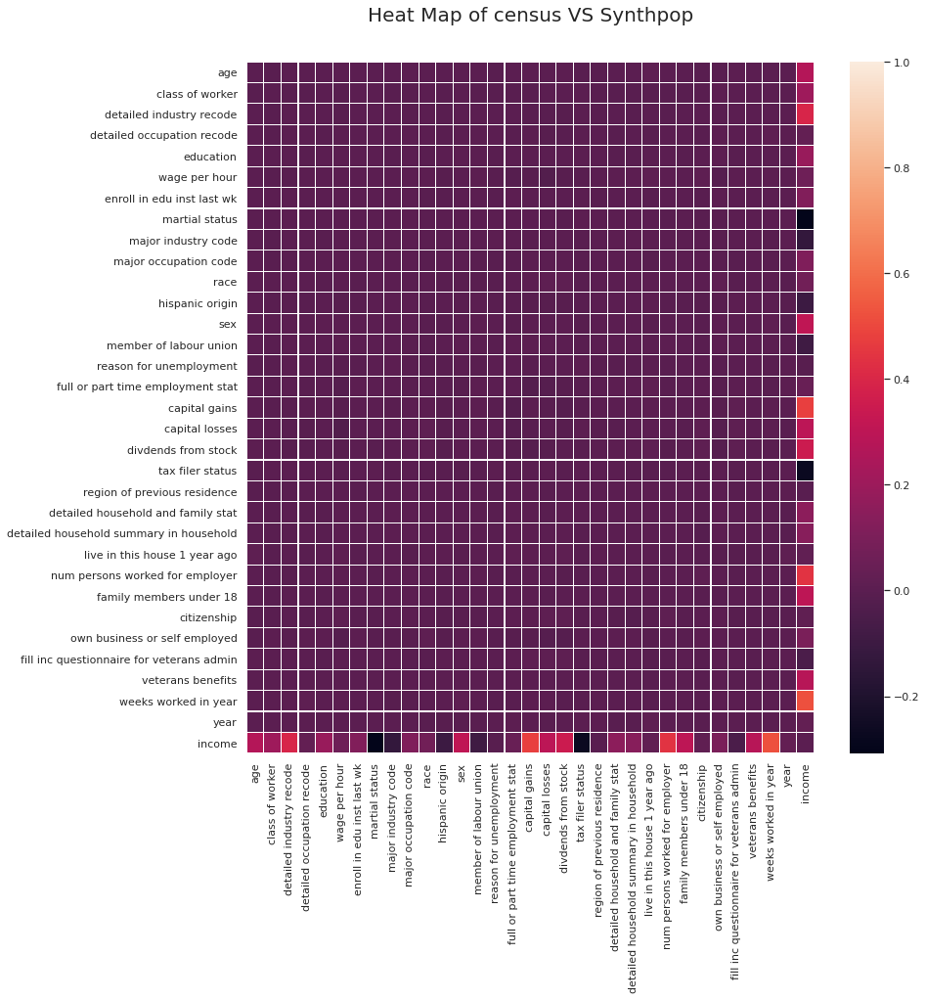

In [ ]:
plot_heat_maps(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS, comparative = True)

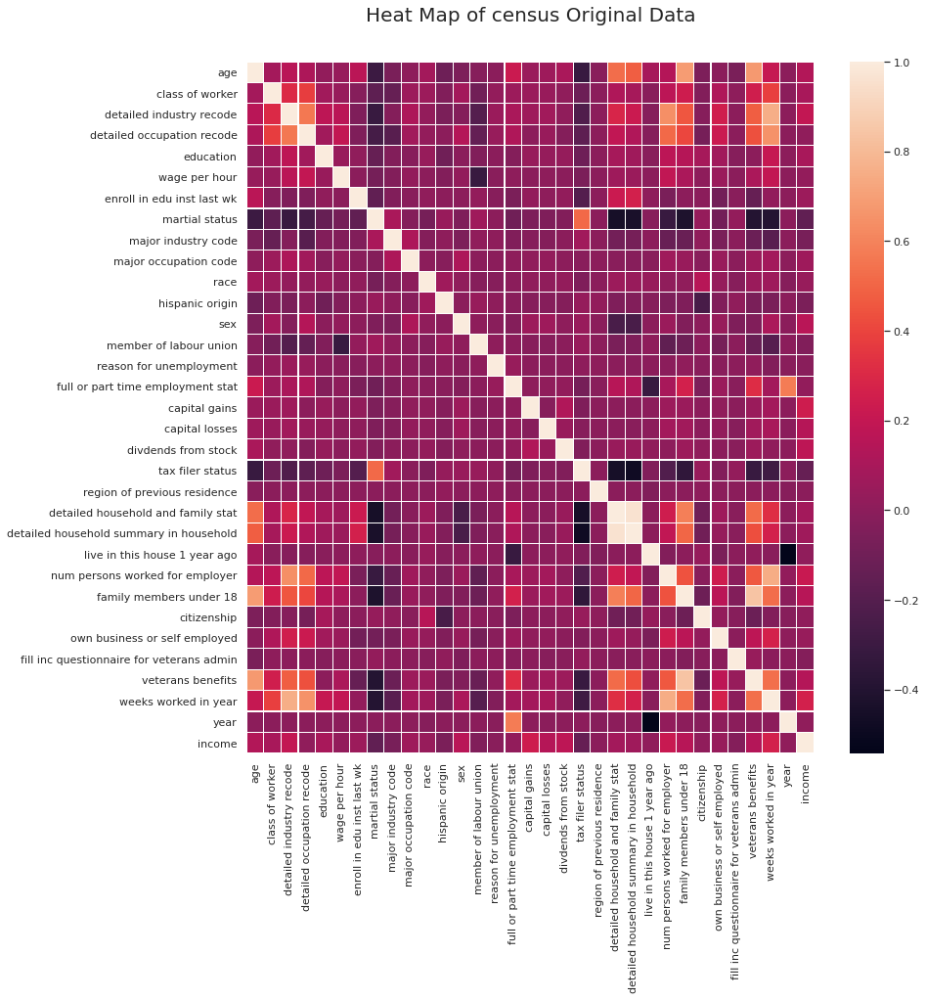

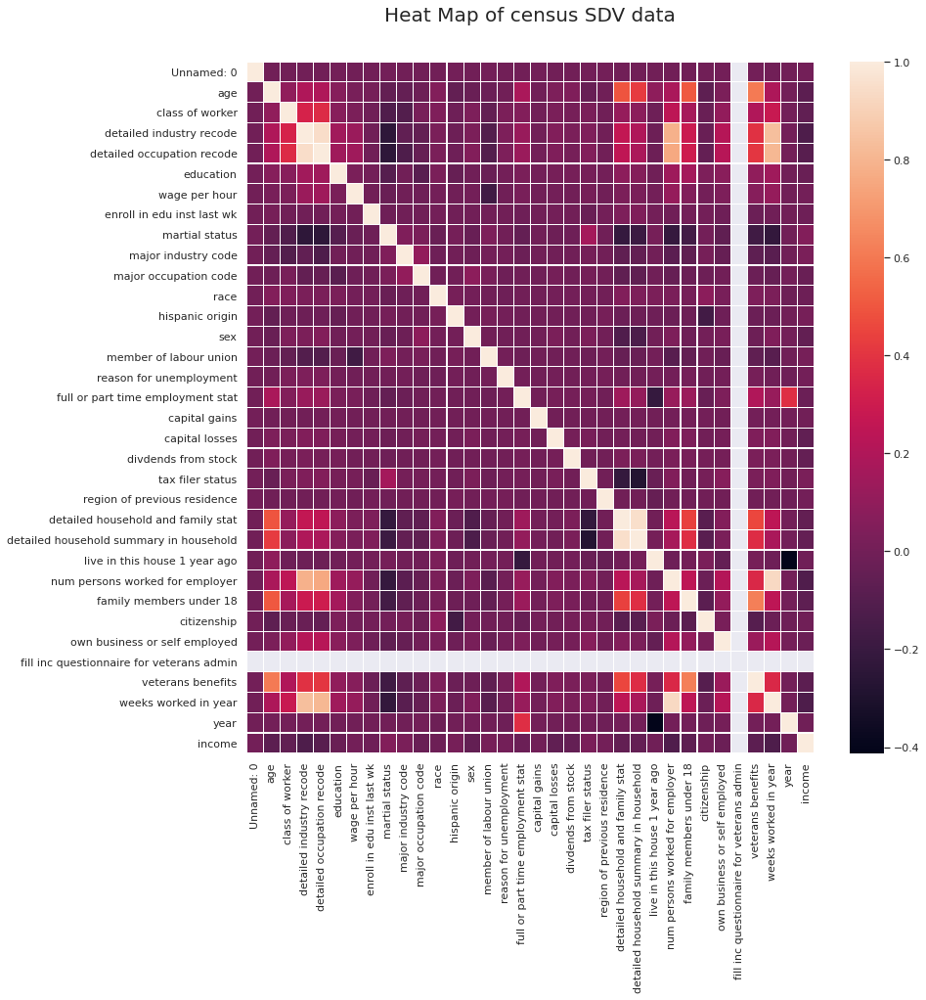

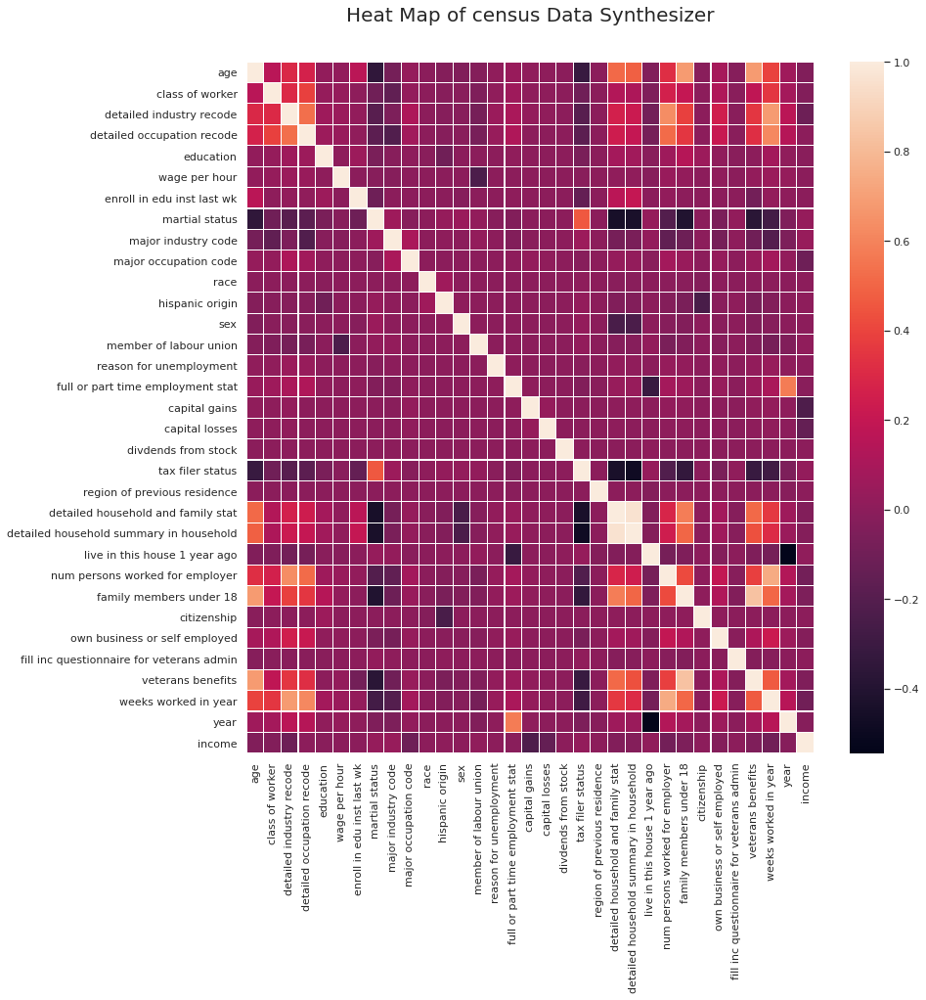

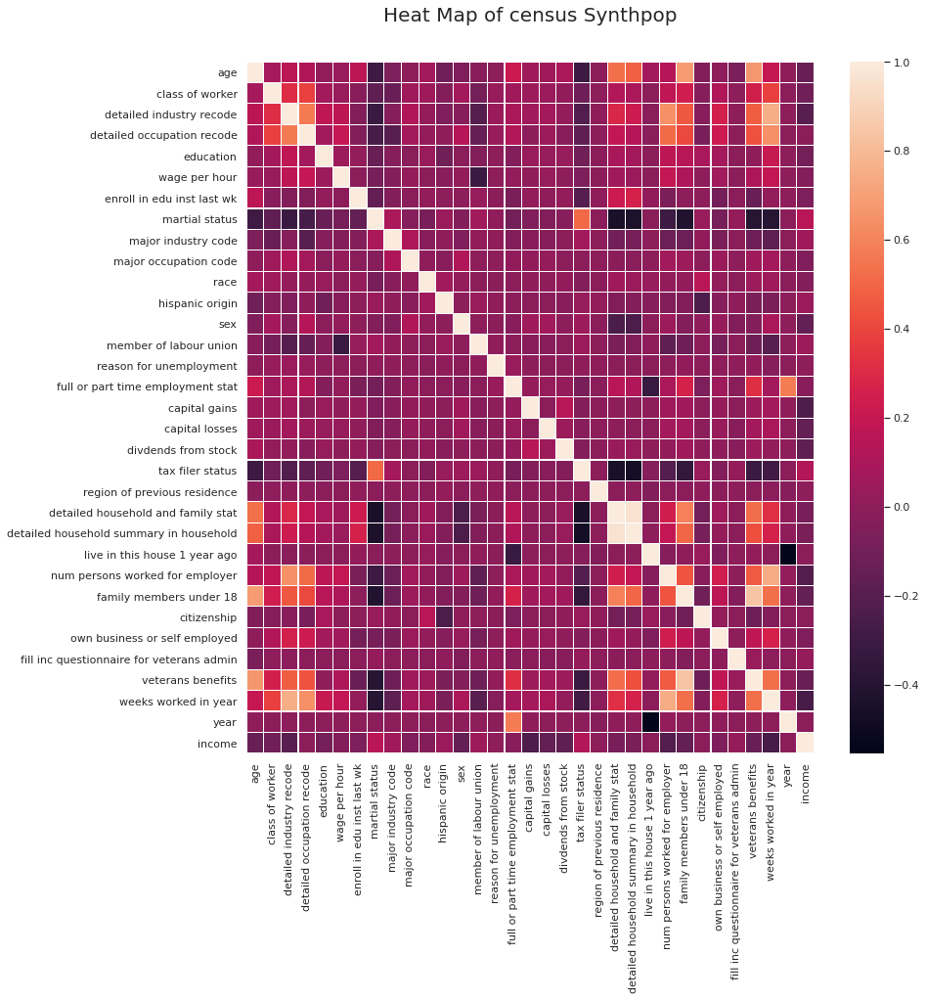

In [ ]:
plot_heat_maps(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS)

#### Compare distributions with boxplots

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

np.random.seed(44)
# DATAFRAMES WITH TRIAL COLUMN ASSIGNED
df1 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=1)
df2 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=2)
df3 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=3)

cdf = pd.concat([df1, df2, df3])                                # CONCATENATE
mdf = pd.melt(cdf, id_vars=['Trial'], var_name=['Number'])      # MELT

print(mdf.head())

   Trial Number     value
0      1      1 -0.750615
1      1      1 -1.715070
2      1      1 -0.963404
3      1      1  0.360856
4      1      1 -1.190504


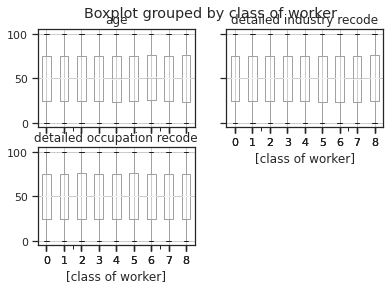

In [ ]:
import pandas as pd, numpy as np

# df = pd.DataFrame(np.random.rand(12,2), columns=['Apples', 'Oranges'] )

# df['Categories'] = pd.Series(list('AAAABBBBCCCC'))

# pd.options.display.mpl_style = 'default'

sample_data_30.iloc[:,:4].boxplot(by='class of worker')
plt.show()

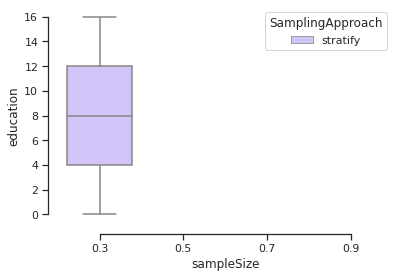

In [ ]:
sns.set_theme(style="ticks", palette="pastel")

# Load the example tips dataset
tips = sns.load_dataset("tips")

# Draw a nested boxplot to show bills by day and time
sns.boxplot(x="sampleSize", y="education",
                hue="SynthesizationApproach", palette=["m", "g"],
            data=sampleDATA_SYNTHESIZER_Stratify)
sns.despine(offset=10, trim=True)

In [ ]:
# sample_data_30=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
# sample_data_30 = label_encode(sample_data_30)
# sample_data_30 = sample_data_30.iloc[:,1:]
# sample_data_30["sampleSize"], sample_data_30["SynthesizationApproach"], sample_data_30["SamplingApproach"]  = sampleSize, SynthetizationApproaches.SDV, SAMPLE_APPROACH_stratify
# sample_data_30

In [ ]:
SynthetizationApproaches.DATA_SYNTHESIZER

'data_synthesizer'

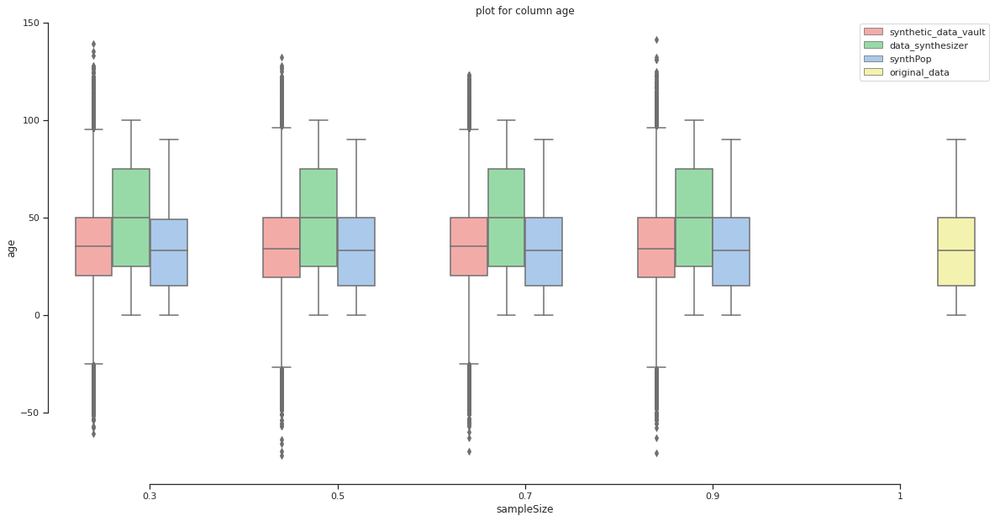

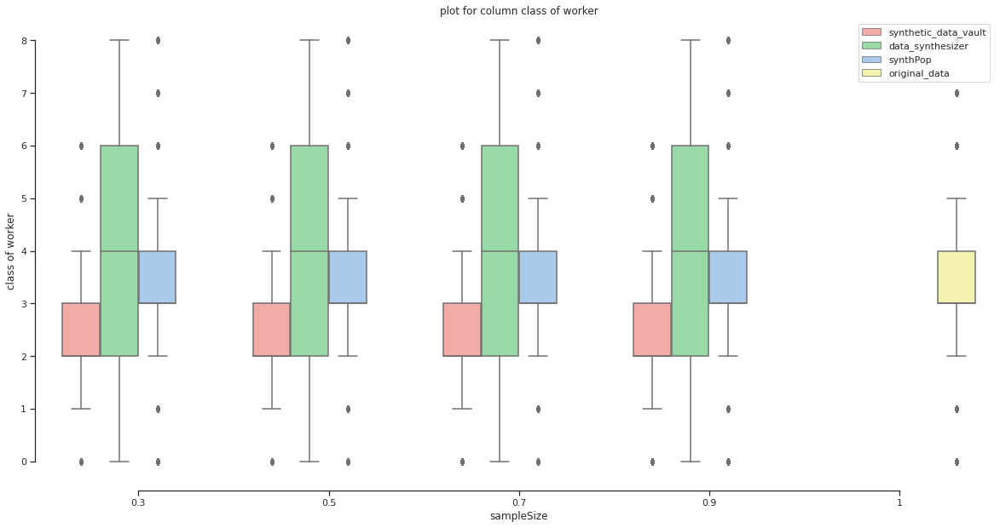

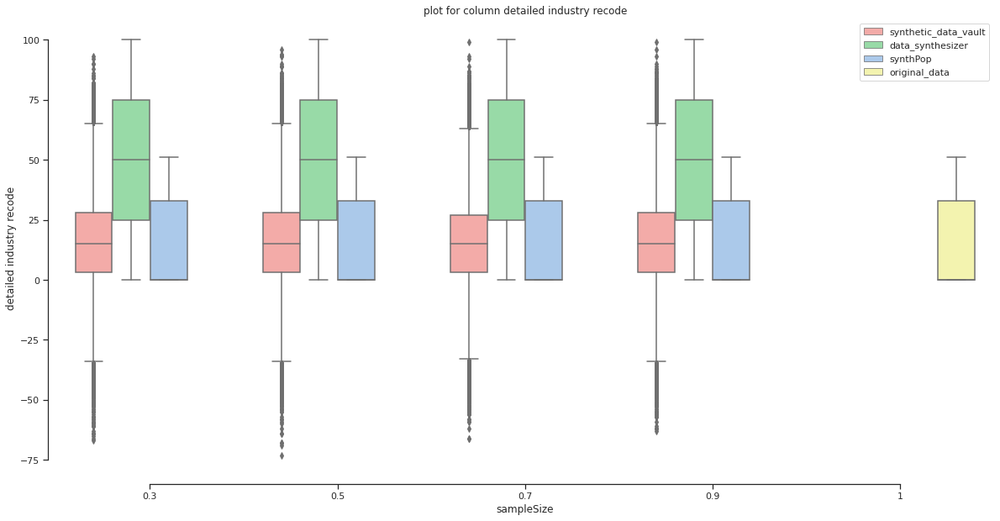

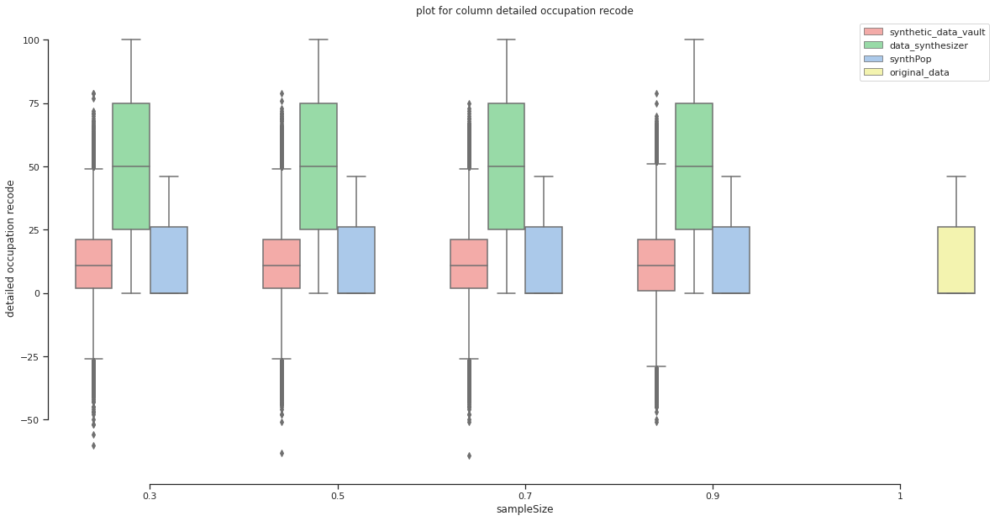

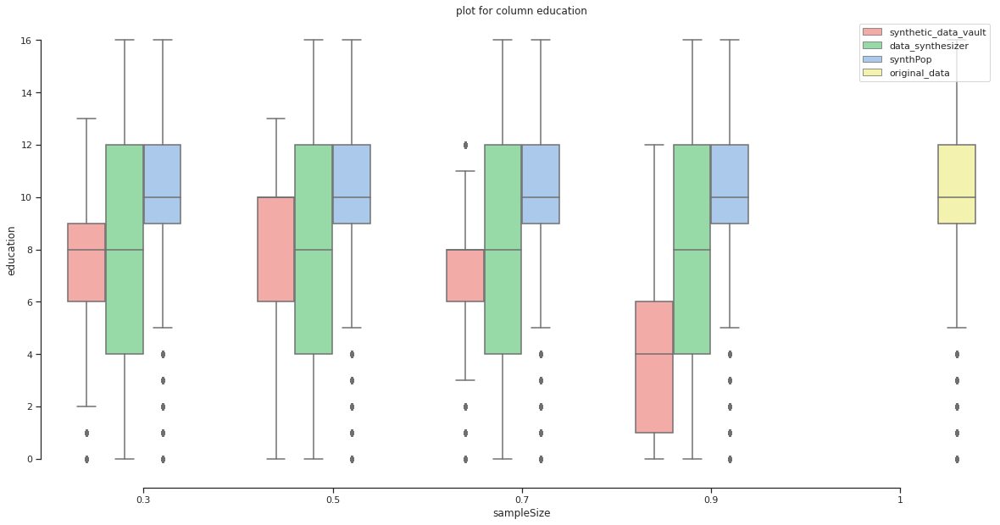

...

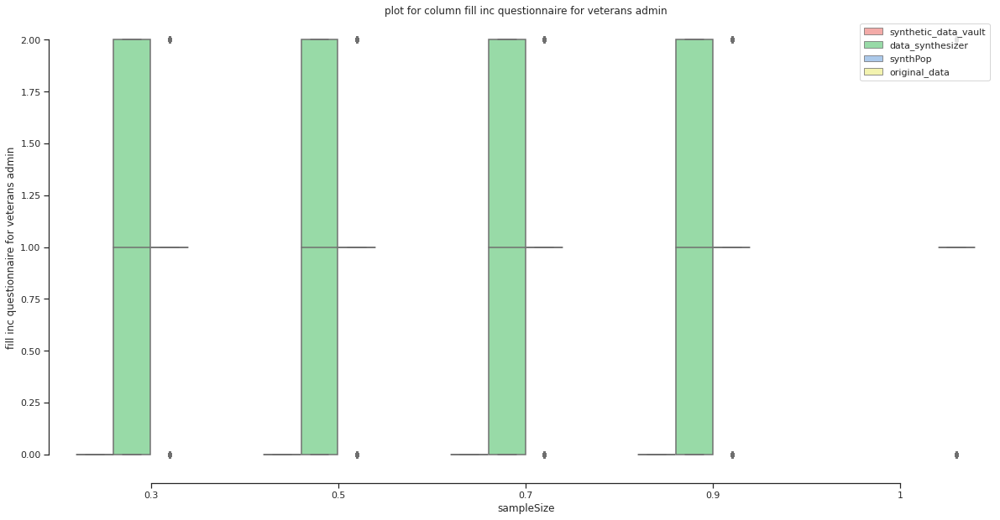

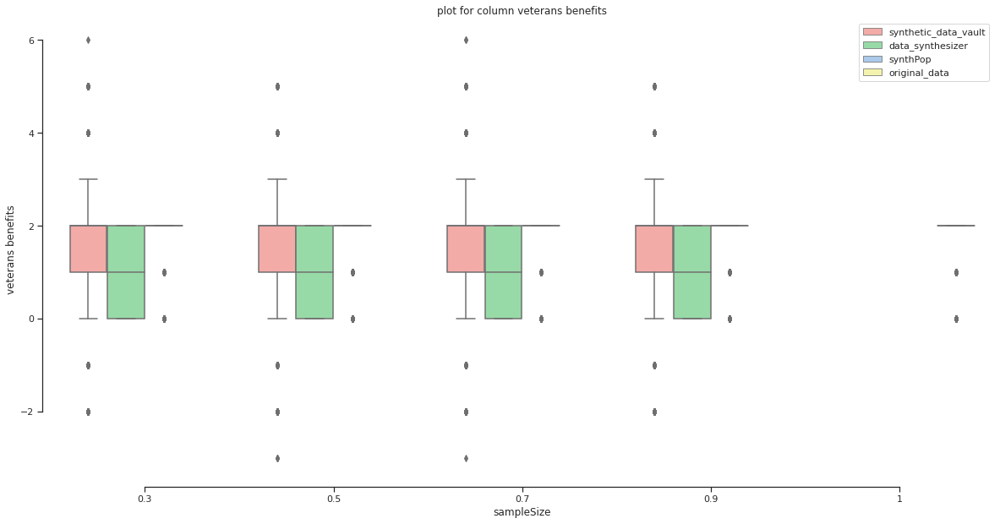

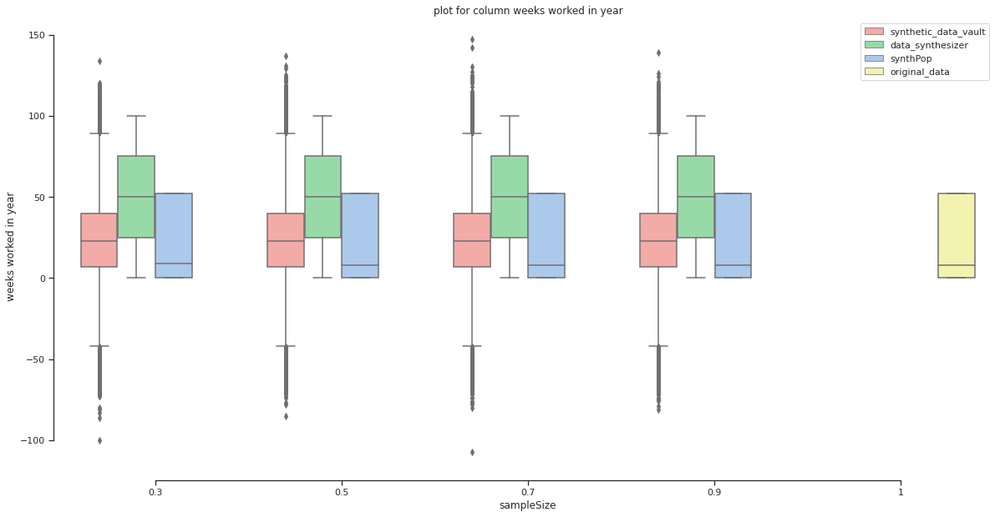

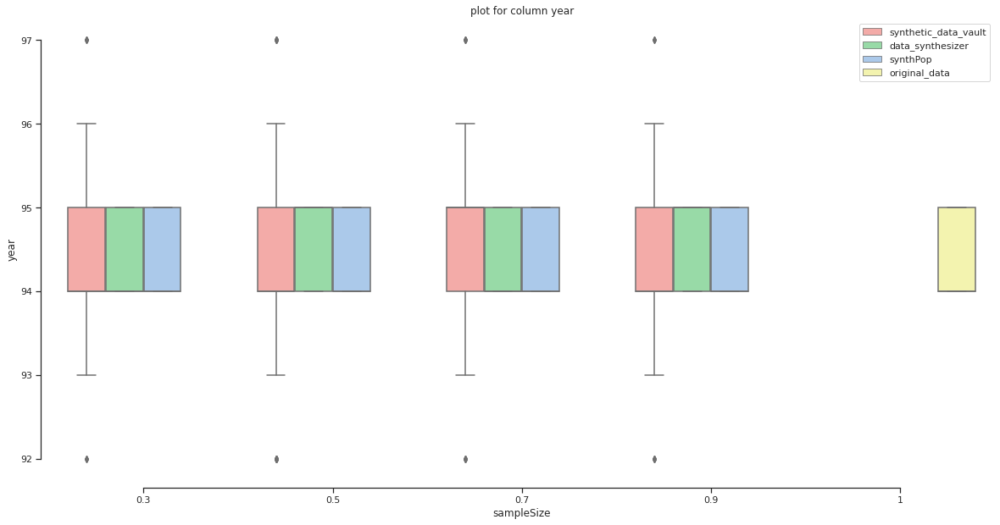

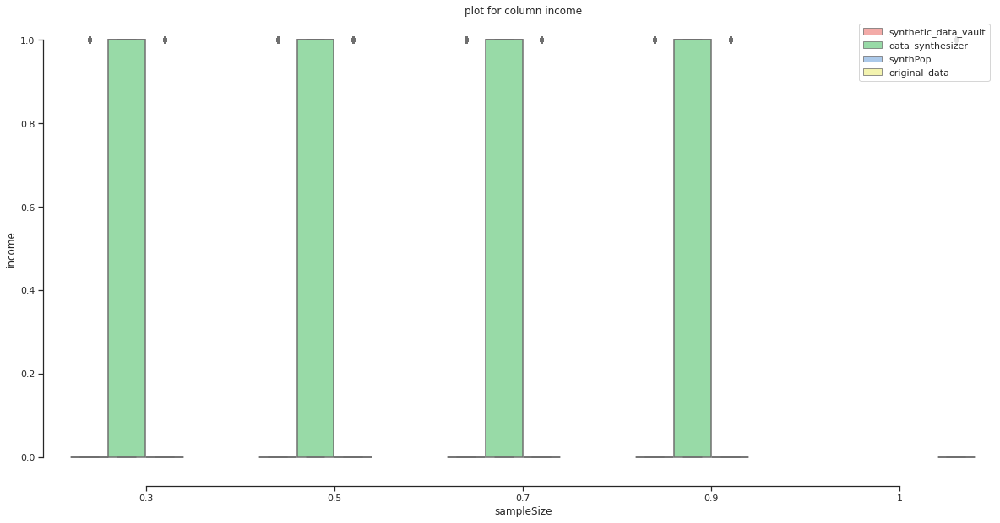

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

In [ ]:
# plotting sample data box plots with sample technique being stratify

import seaborn as sns
original_data_boxPlot = original_data.copy()
original_data_boxPlot["sampleSize"], original_data_boxPlot["SynthesizationApproach"], original_data_boxPlot["SamplingApproach"]  = str(1), "original_data", "original_data"

sampleDATA_SYNTHESIZER_Stratify = readingSampleData.fetchSampleData("data_synthesizer", "stratify", True)
sampleSDV_Stratify = readingSampleData.fetchSampleData("sdv", "stratify", True)
sampleSynthPop_Stratify = readingSampleData.fetchSampleData("synthPop", "stratify", True)

sampleDataFinal = pd.concat([sampleSDV_Stratify, sampleDATA_SYNTHESIZER_Stratify,sampleSynthPop_Stratify,original_data_boxPlot])
sampleDataFinal['sampleSize'] = sampleDataFinal['sampleSize'].astype(str)

exceptions = []
for column in sampleDataFinal.columns:
  sns.set_theme(style="ticks", palette="pastel")
  try:
    plt.figure(figsize=(20,10))
    sns.boxplot(x="sampleSize", y=column,
                hue="SynthesizationApproach", palette=["r", "g","b","y"],
                data=sampleDataFinal)
    sns.despine(offset=10, trim=True)
    plt.title(f"plot for column {column}")
    plt.legend(loc = 'upper right')
  except:
    exceptions.append(column)

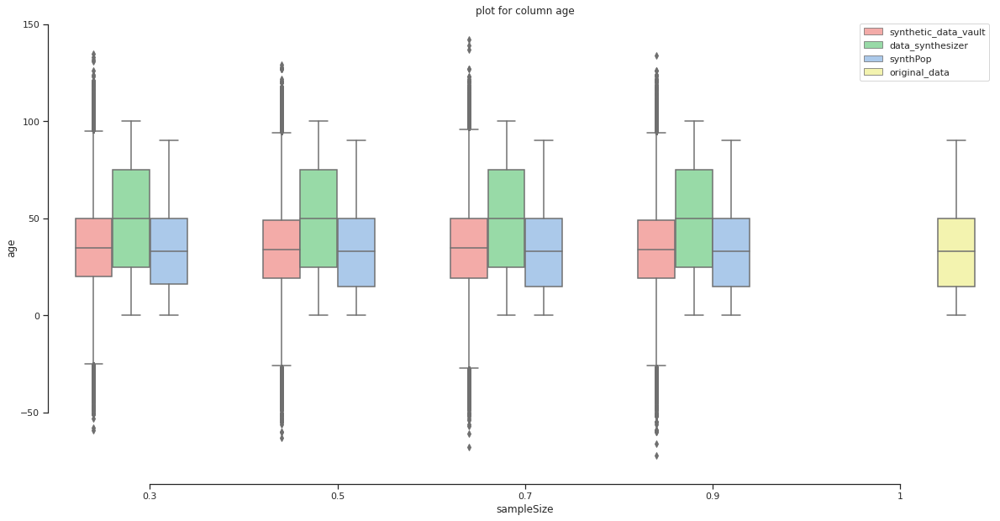

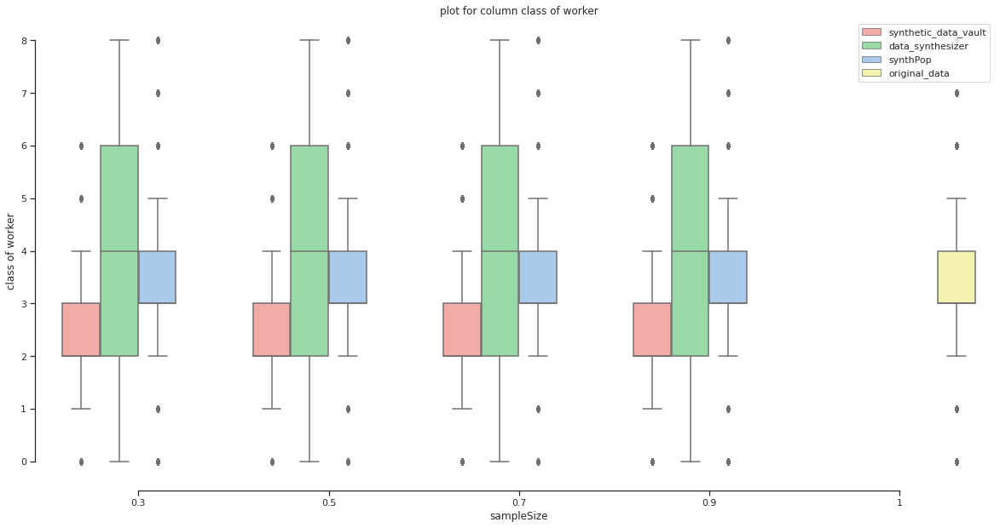

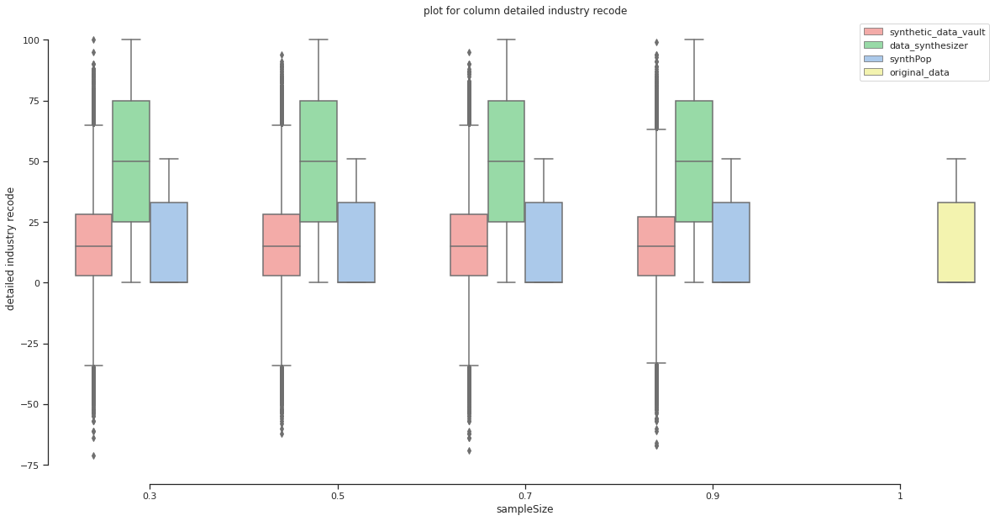

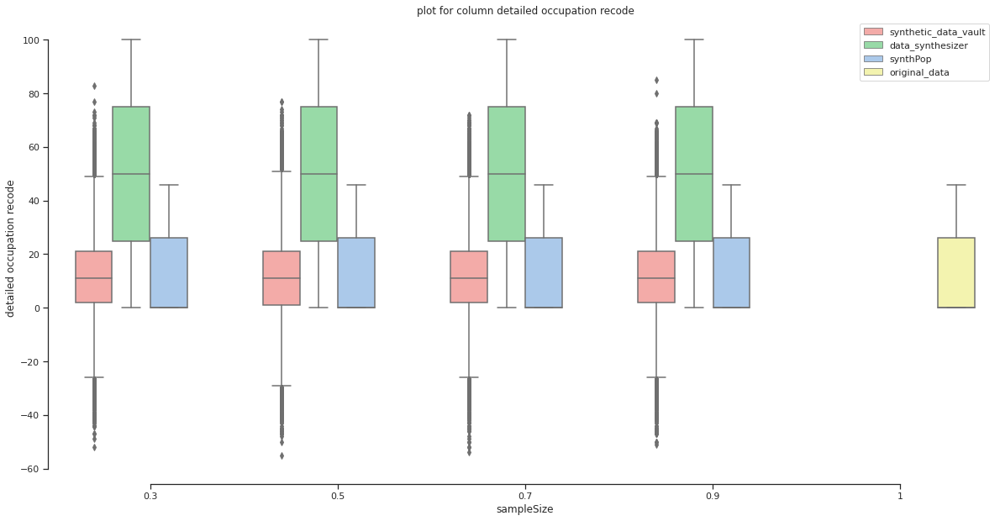

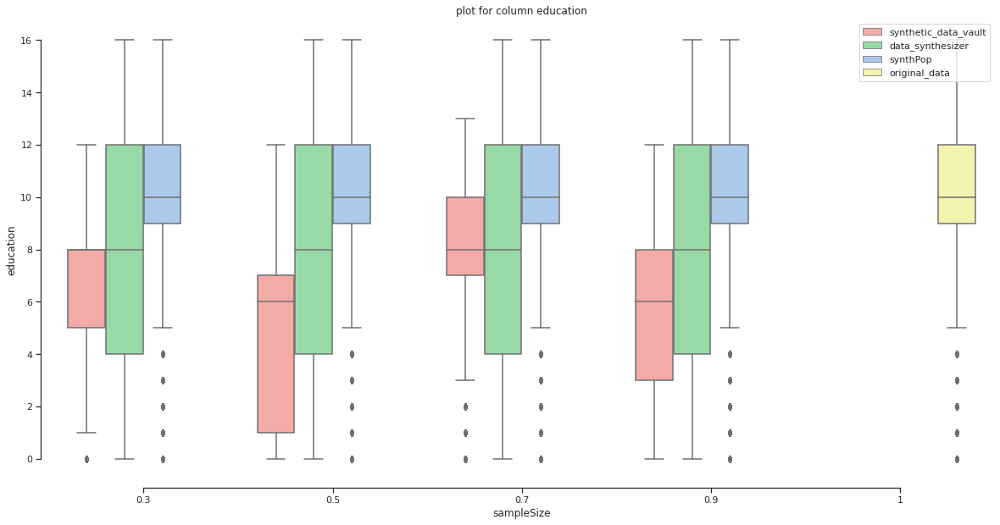

...

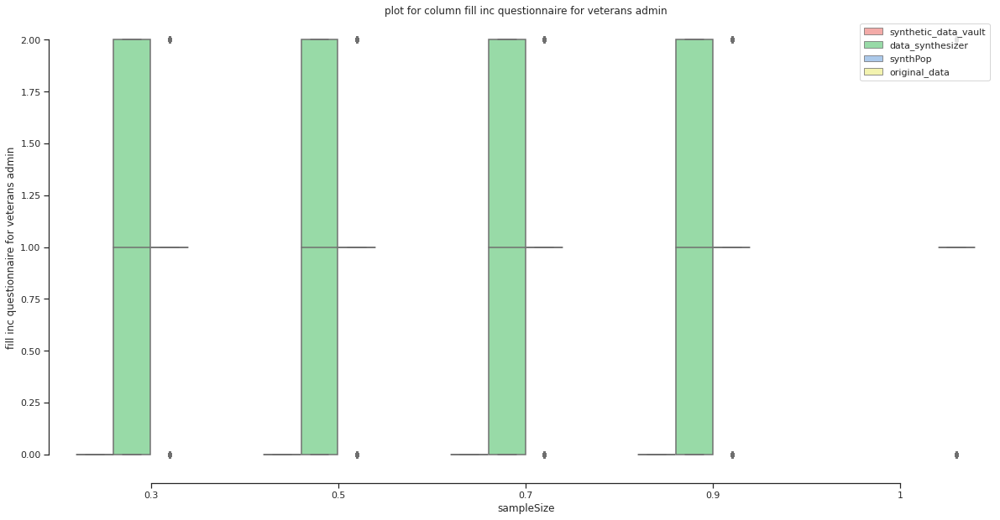

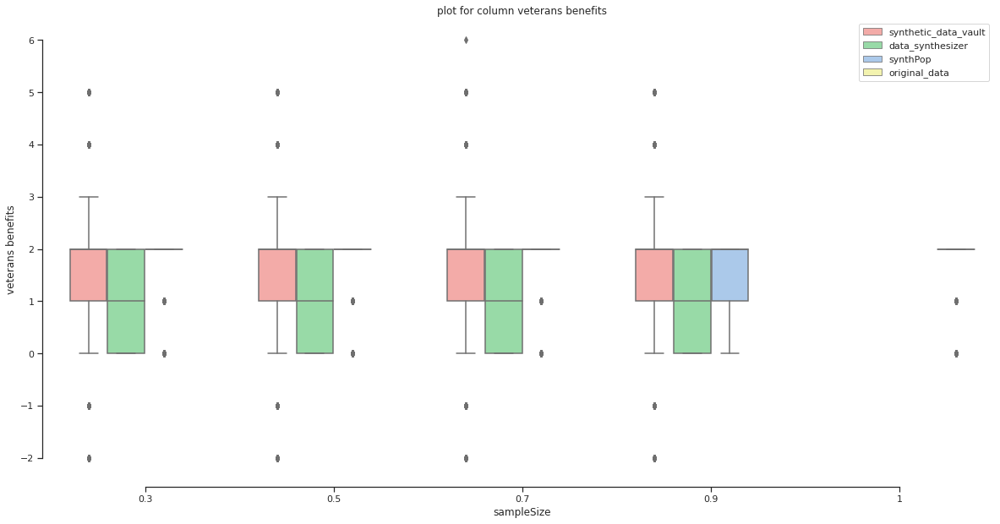

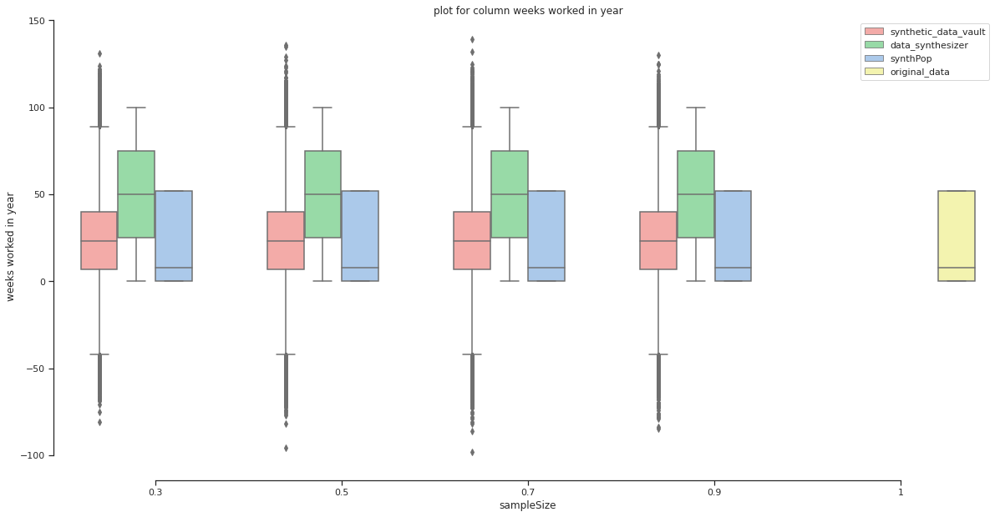

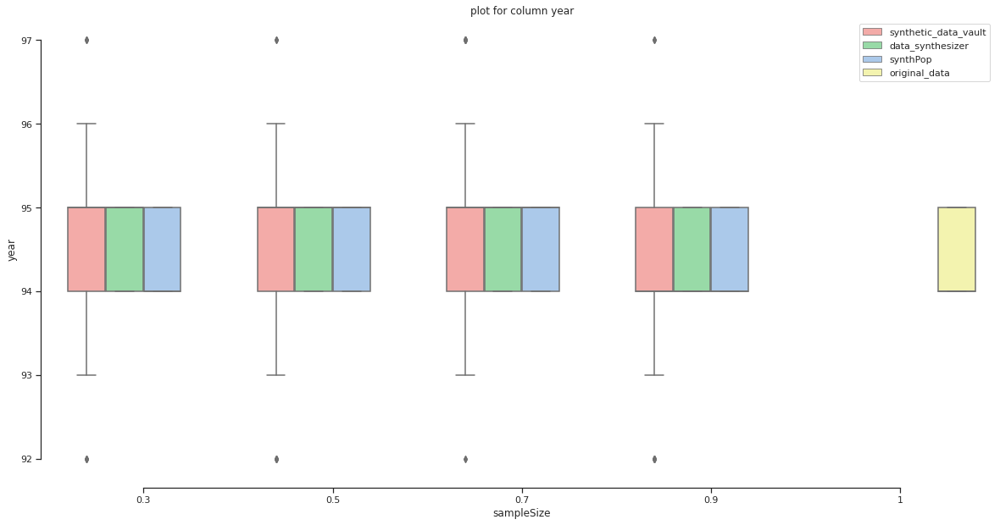

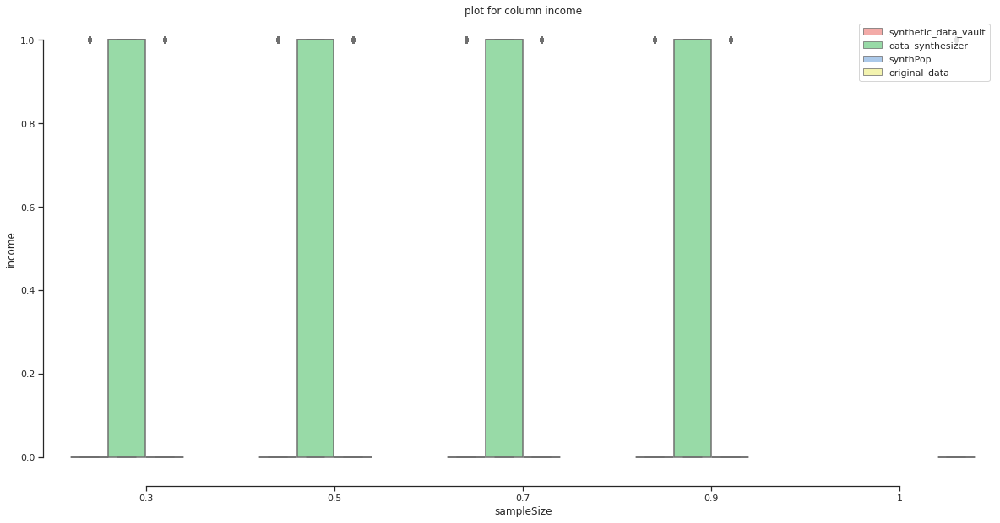

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

In [ ]:
# plotting sample data box plots with sample technique being stratify

import seaborn as sns
original_data_boxPlot = original_data.copy()
original_data_boxPlot["sampleSize"], original_data_boxPlot["SynthesizationApproach"], original_data_boxPlot["SamplingApproach"]  = str(1), "original_data", "original_data"

sampleDATA_SYNTHESIZER_Stratify = readingSampleData.fetchSampleData("data_synthesizer", "random", True)
sampleSDV_Stratify = readingSampleData.fetchSampleData("sdv", "random", True)
sampleSynthPop_Stratify = readingSampleData.fetchSampleData("synthPop", "random", True)

sampleDataFinal = pd.concat([sampleSDV_Stratify, sampleDATA_SYNTHESIZER_Stratify,sampleSynthPop_Stratify,original_data_boxPlot])
sampleDataFinal['sampleSize'] = sampleDataFinal['sampleSize'].astype(str)

exceptions = []
for column in sampleDataFinal.columns:
  sns.set_theme(style="ticks", palette="pastel")
  try:
    plt.figure(figsize=(20,10))
    sns.boxplot(x="sampleSize", y=column,
                hue="SynthesizationApproach", palette=["r", "g","b","y"],
                data=sampleDataFinal)
    sns.despine(offset=10, trim=True)
    plt.title(f"plot for column {column}")
    plt.legend(loc = 'upper right')
  except:
    exceptions.append(column)

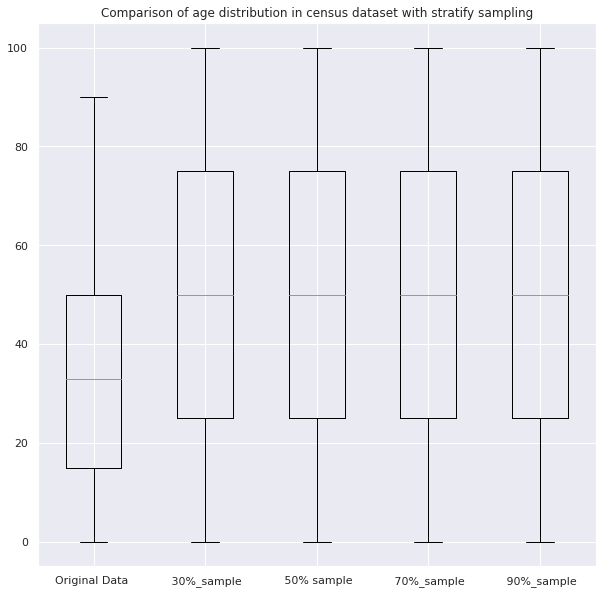

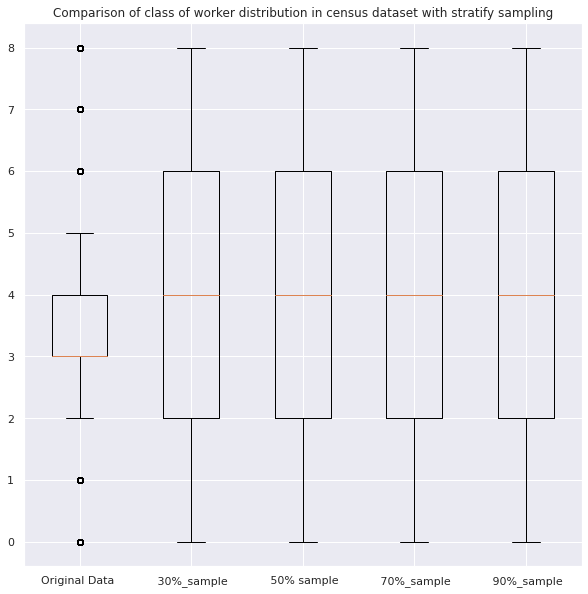

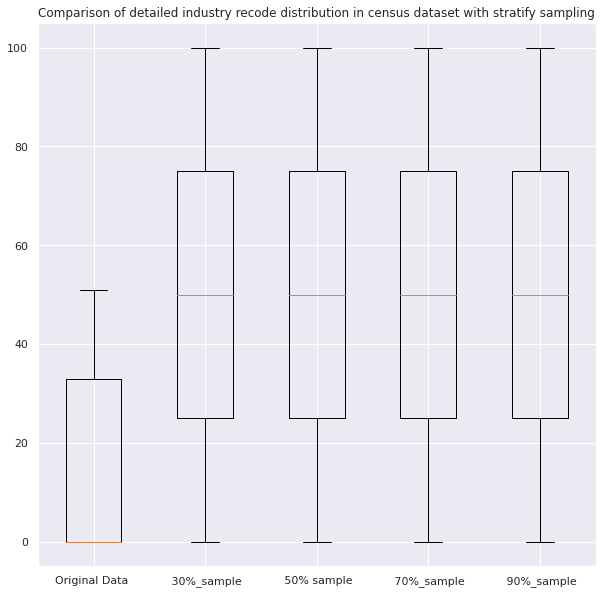

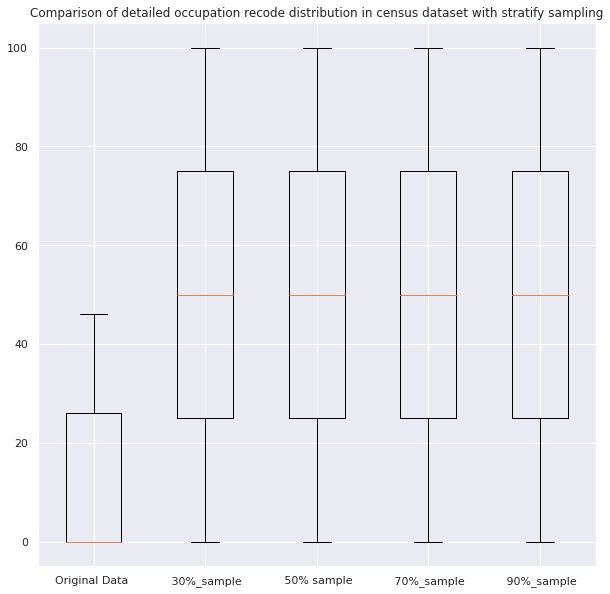

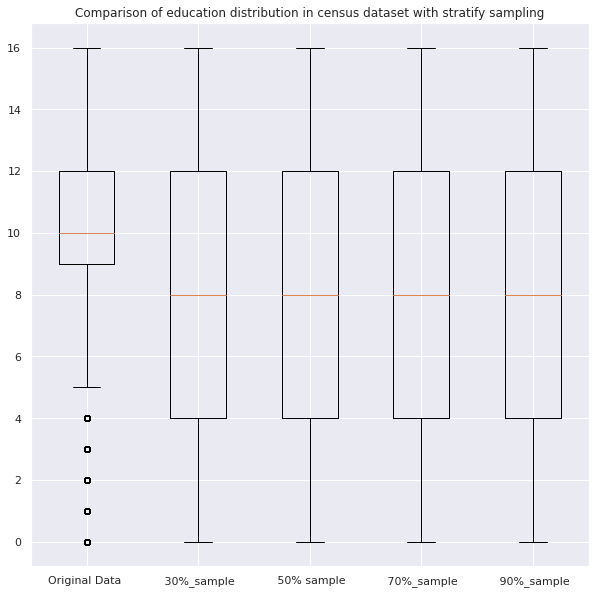

...

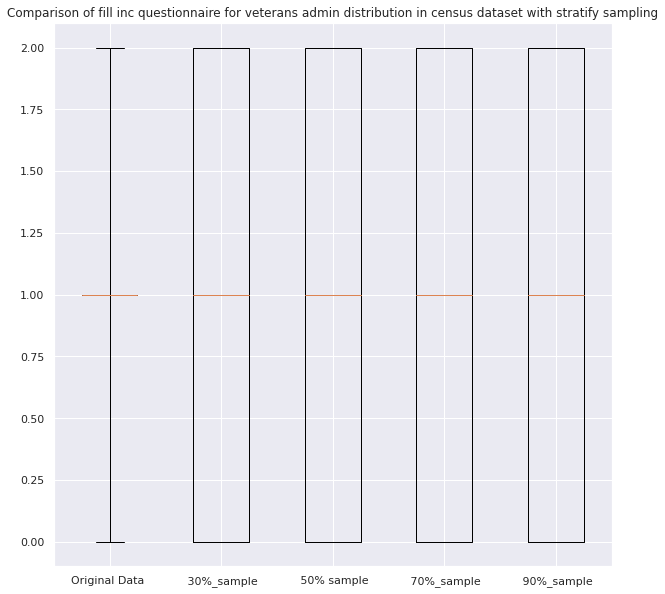

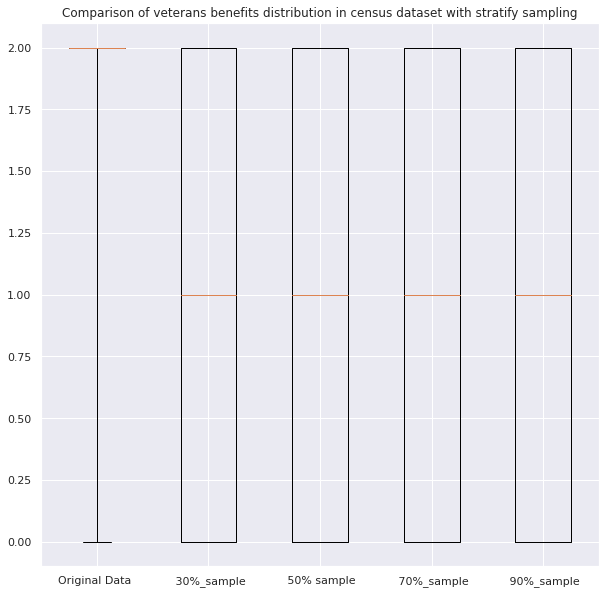

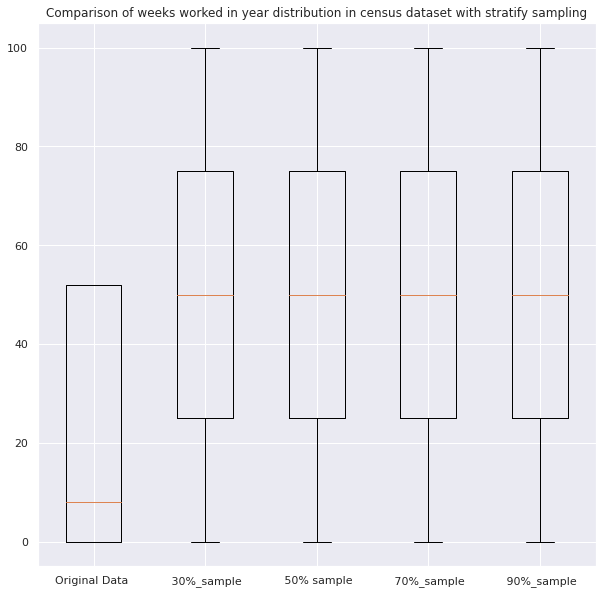

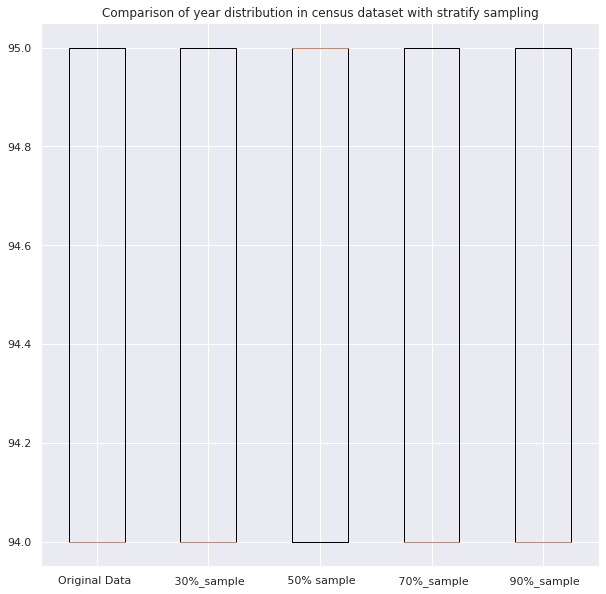

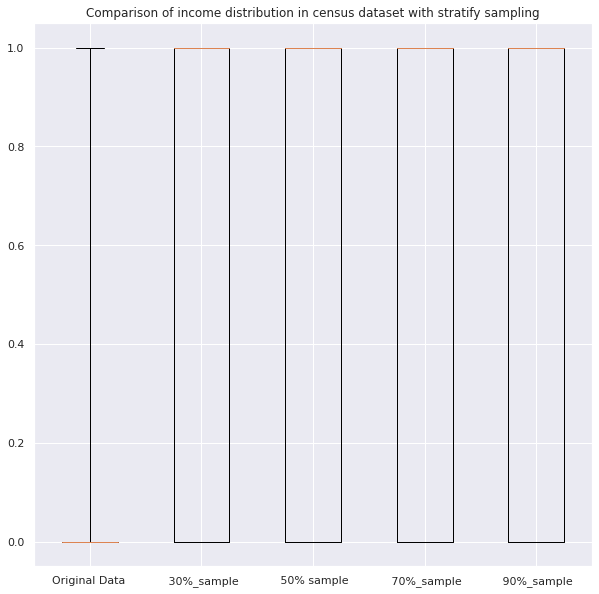

In [ ]:
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"
sampleSize = 0.3
sample_data_30=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.5
sample_data_50=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.7
sample_data_70=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')
sampleSize = 0.9
sample_data_90=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/{DS_DEFAULT_MODE}/synthetic_data.csv')

plot_box_plots(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               sampleApproach = 'stratify', sample_data_30 = sample_data_30, sample_data_50 = sample_data_50, sample_data_70 = sample_data_70,
                   sample_data_90 = sample_data_90)


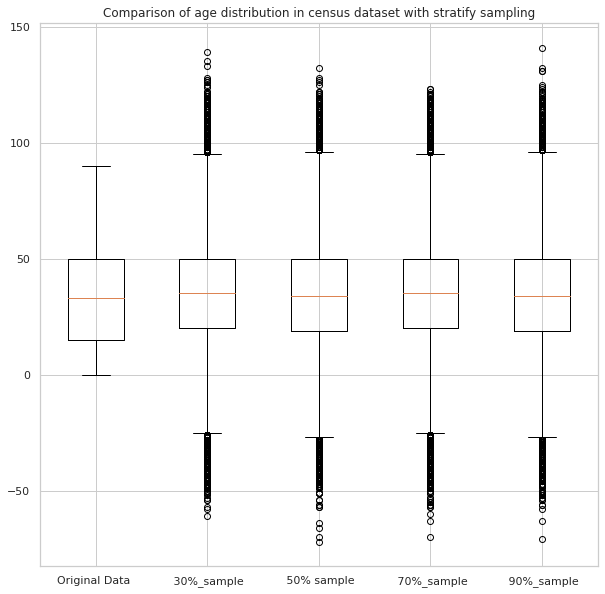

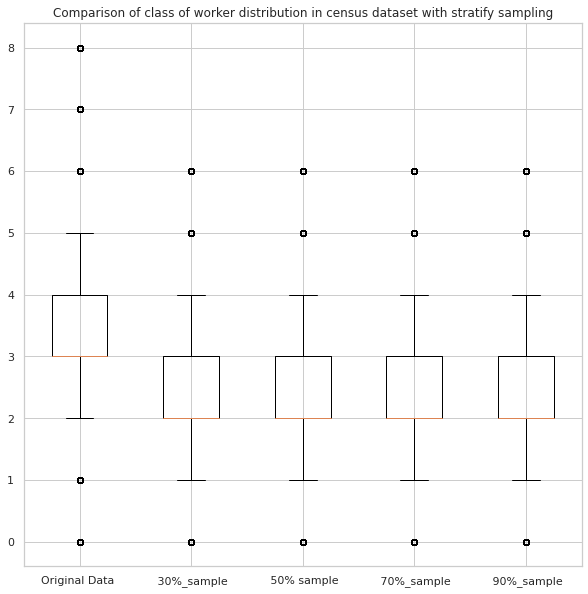

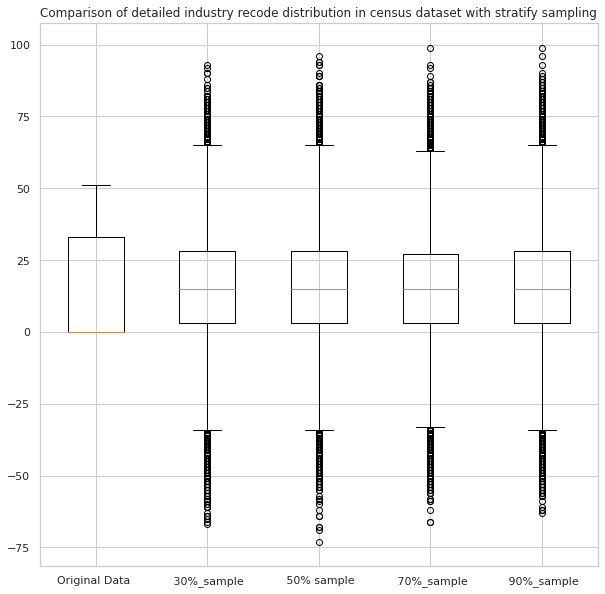

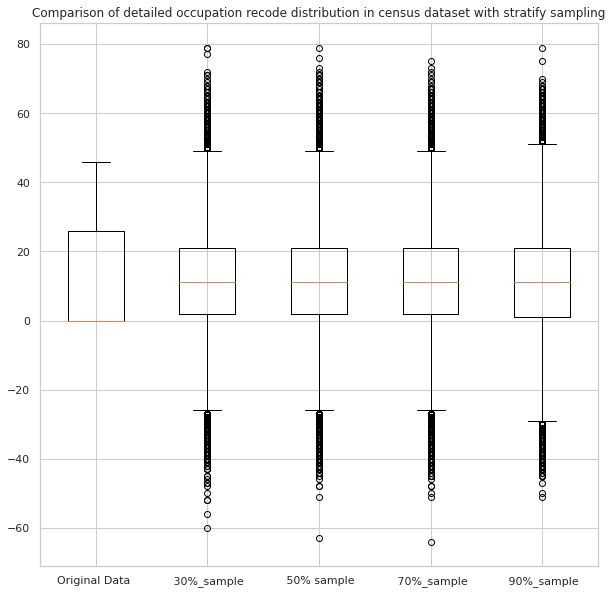

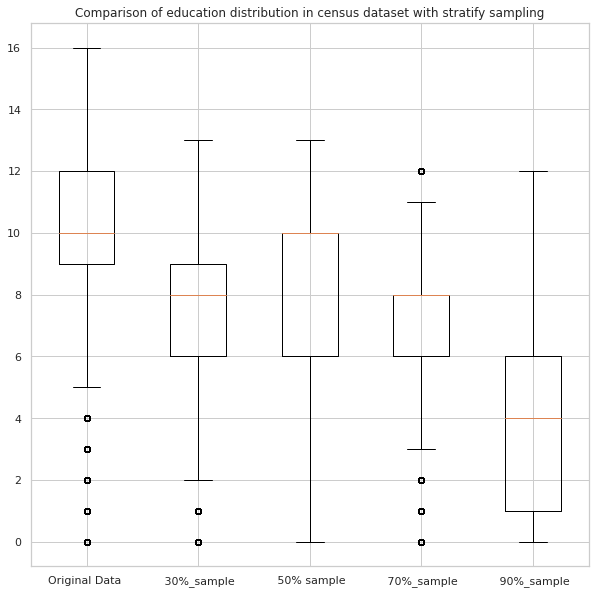

...

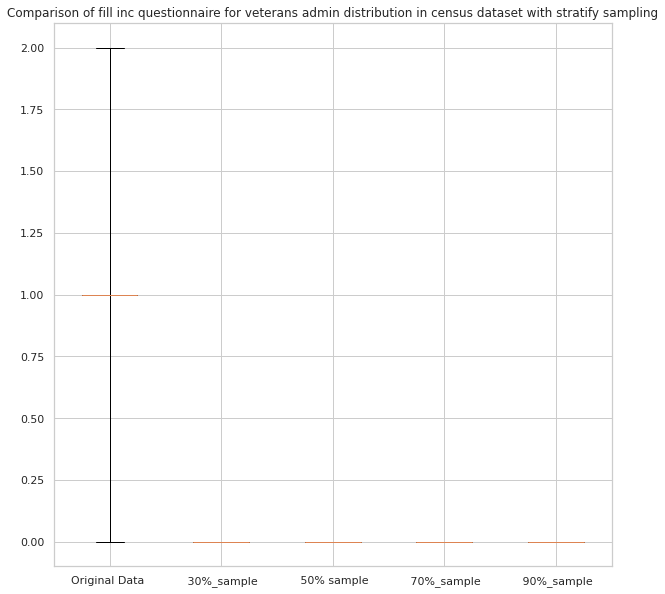

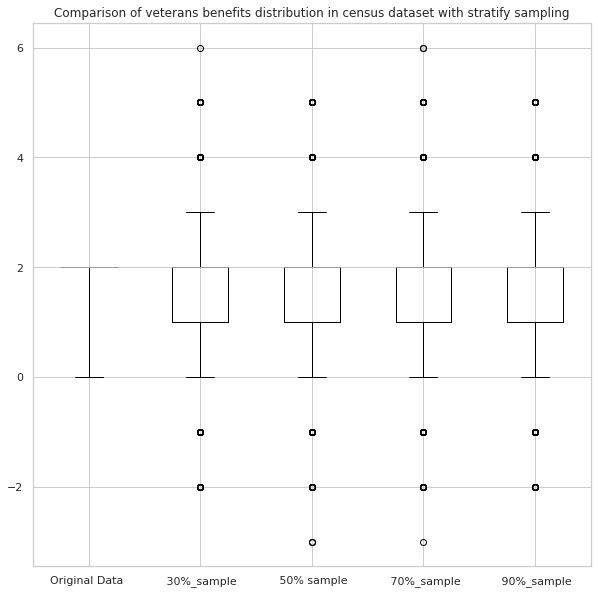

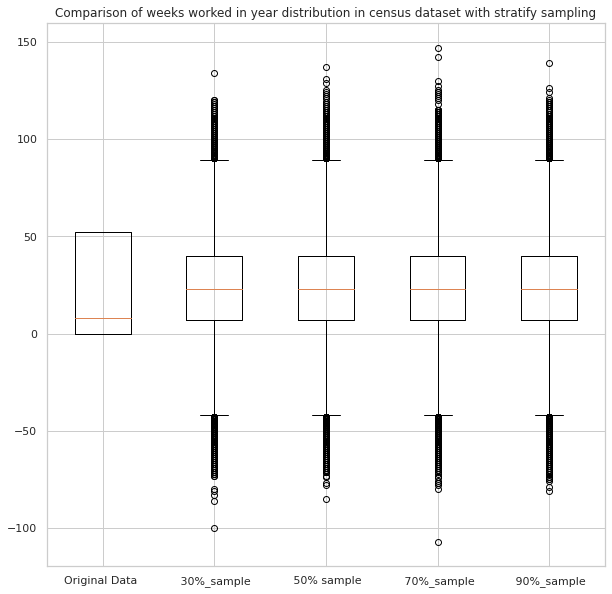

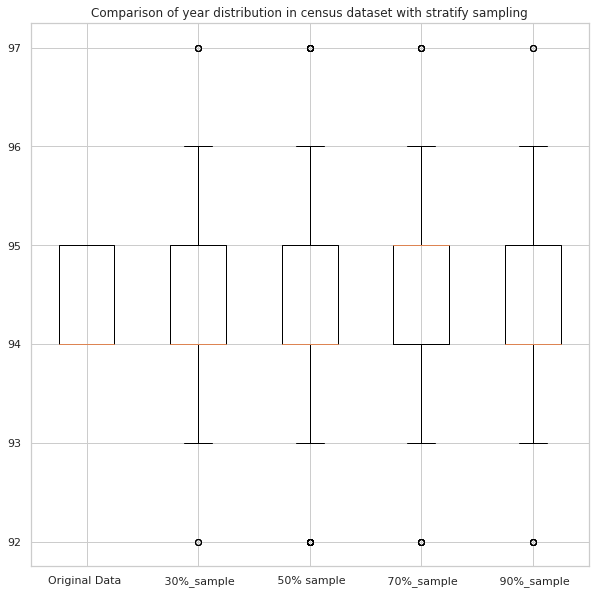

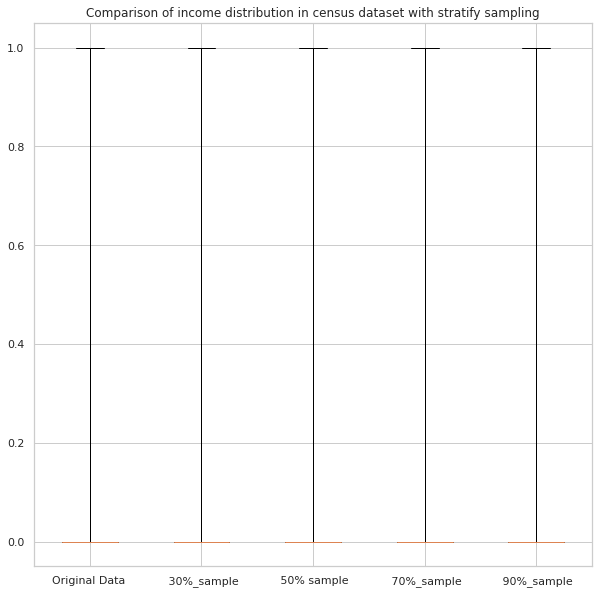

In [ ]:
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"
sampleSize = 0.3
sample_data_30=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
sample_data_30 = label_encode(sample_data_30)
sampleSize = 0.5
sample_data_50=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
sample_data_50 = label_encode(sample_data_50)
sampleSize = 0.7
sample_data_70=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
sample_data_70 = label_encode(sample_data_70)
sampleSize = 0.9
sample_data_90=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/{SynthetizationApproaches.SDV}/{DatasetNames.CENSUS}/{SAMPLE_APPROACH_stratify}/{str(sampleSize*100)}%_of_Sample/GaussianCopula/synthetic_data.csv')
sample_data_90 = label_encode(sample_data_90)

plot_box_plots(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               sampleApproach = 'stratify', sample_data_30 = sample_data_30, sample_data_50 = sample_data_50, sample_data_70 = sample_data_70,
                   sample_data_90 = sample_data_90)


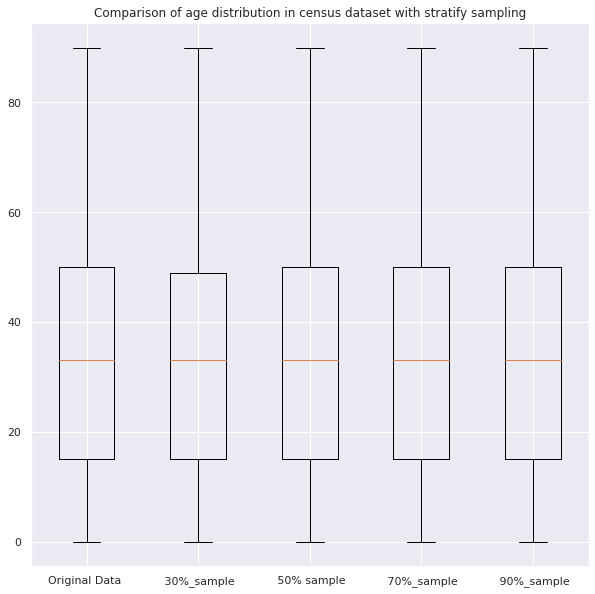

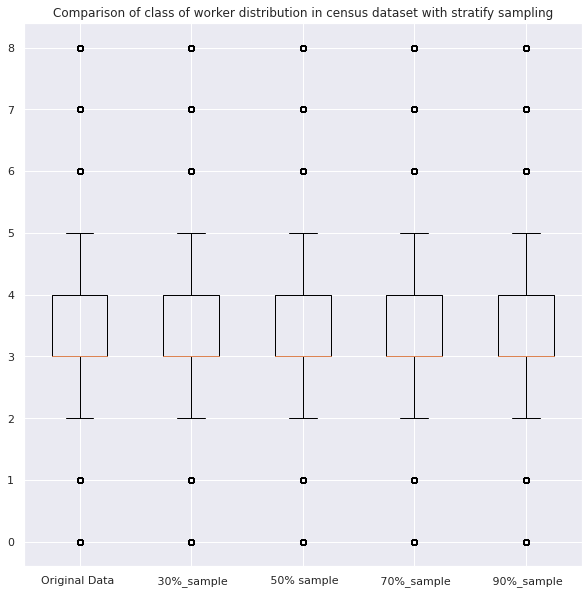

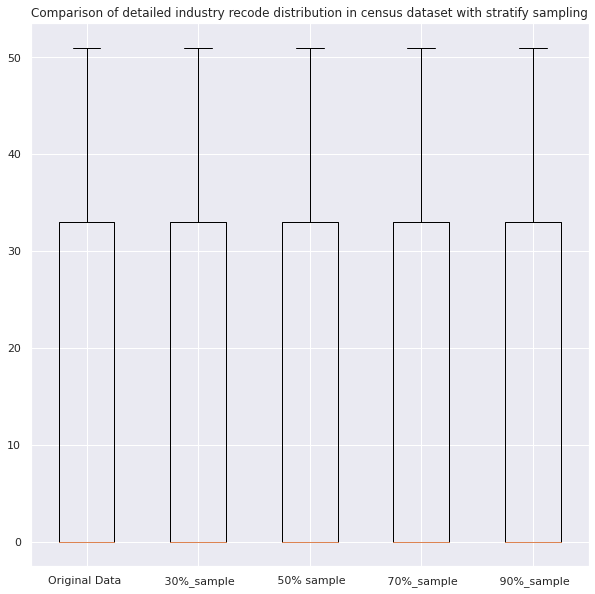

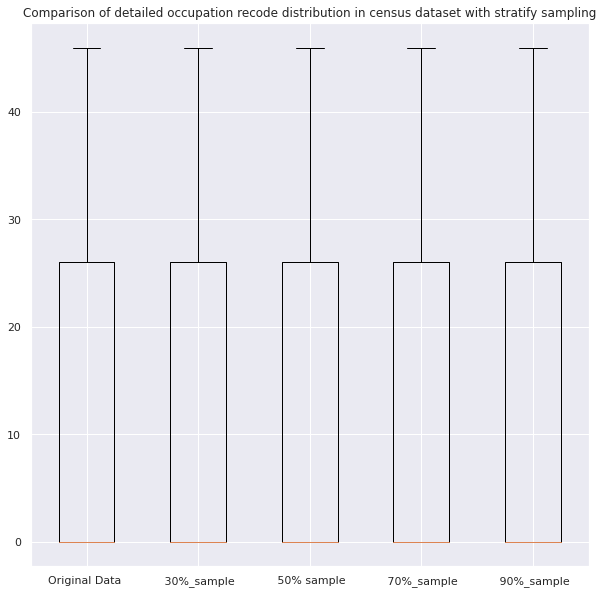

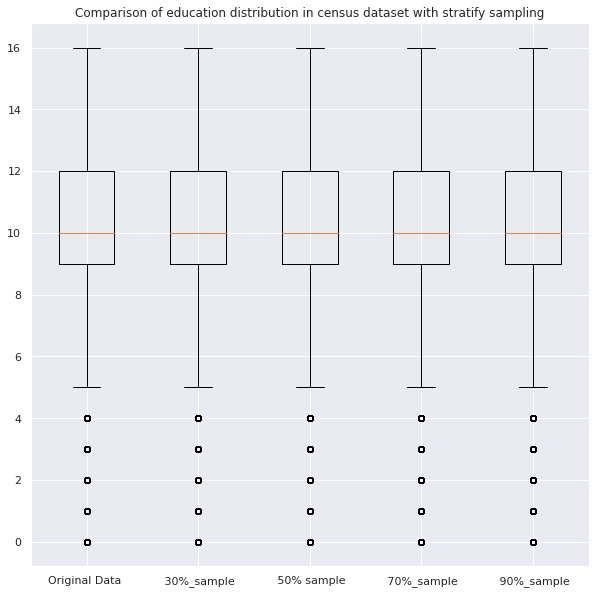

...

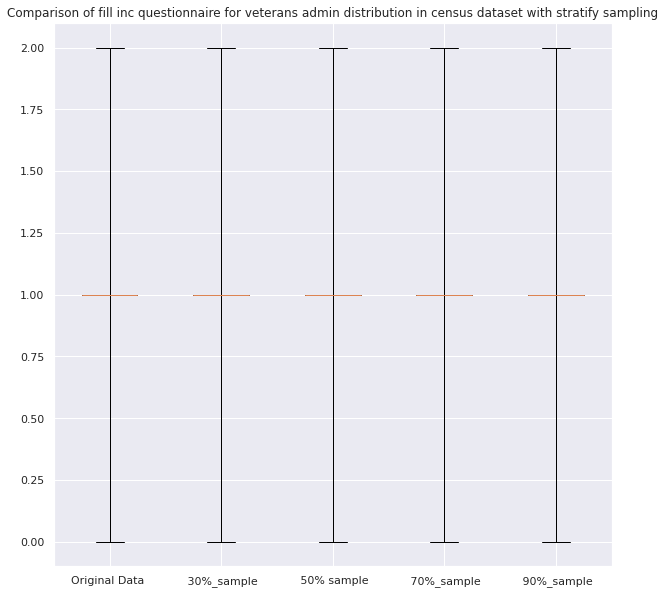

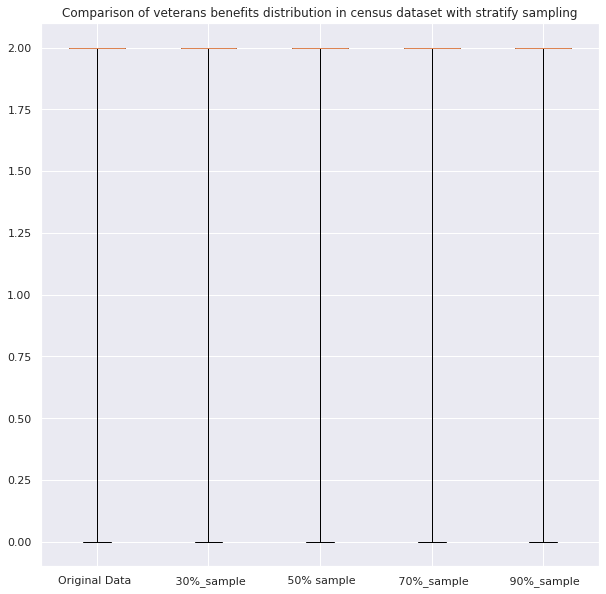

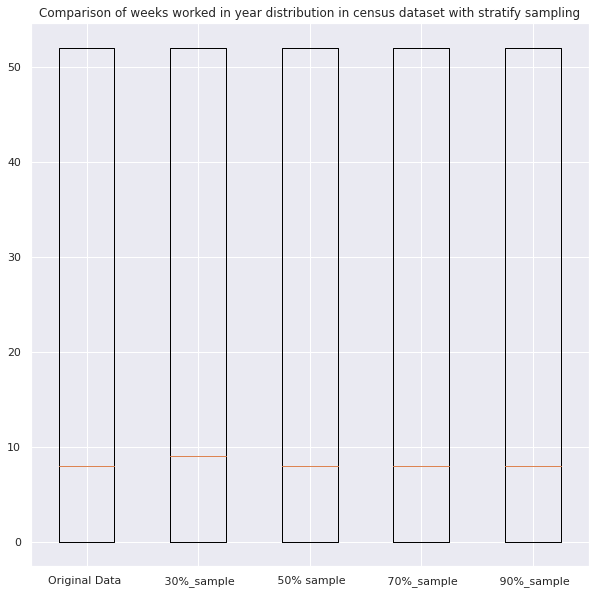

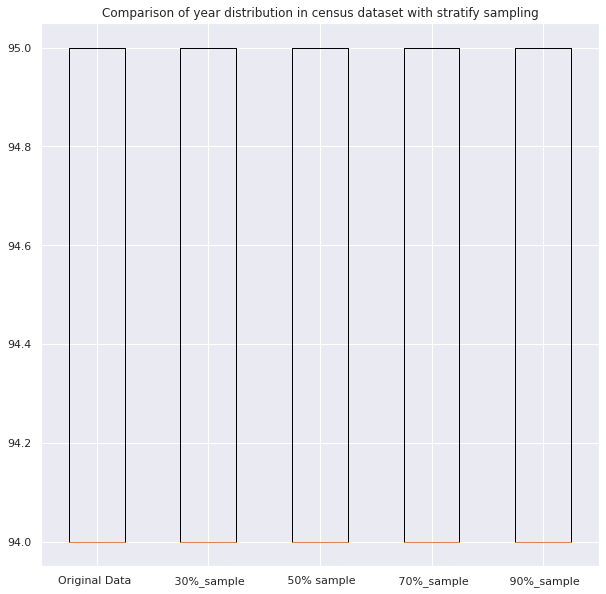

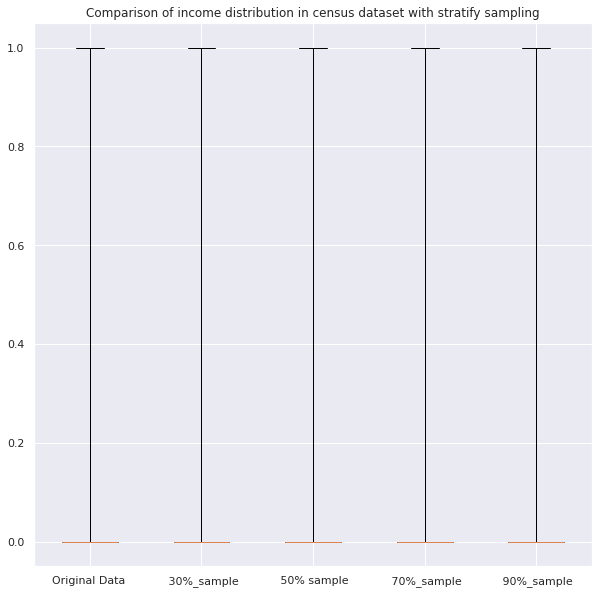

In [ ]:
PATH_TO_SAMPLE_DATA = f"{relativePath}sample data"

sampleSize = 0.3
sample_data_30 = pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_stratify}_{str(sampleSize)}_.csv')
sample_data_30.columns = list(map(lambda x: x.replace("."," "),(sample_data_30.columns.to_list())))

sampleSize = 0.5
sample_data_50=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_stratify}_{str(sampleSize)}_.csv')
sample_data_50.columns = list(map(lambda x: x.replace("."," "),(sample_data_50.columns.to_list())))

sampleSize = 0.7
sample_data_70=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_stratify}_{str(sampleSize)}_.csv')
sample_data_70.columns = list(map(lambda x: x.replace("."," "),(sample_data_70.columns.to_list())))

sampleSize = 0.9
sample_data_90=pd.read_csv(f'{PATH_TO_SAMPLE_DATA}/synthPopSampleData/dfSampled_{SAMPLE_APPROACH_stratify}_{str(sampleSize)}_.csv')
sample_data_90.columns = list(map(lambda x: x.replace("."," "),(sample_data_90.columns.to_list())))

plot_box_plots(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               sampleApproach = 'stratify', sample_data_30 = sample_data_30, sample_data_50 = sample_data_50, sample_data_70 = sample_data_70,
                   sample_data_90 = sample_data_90)


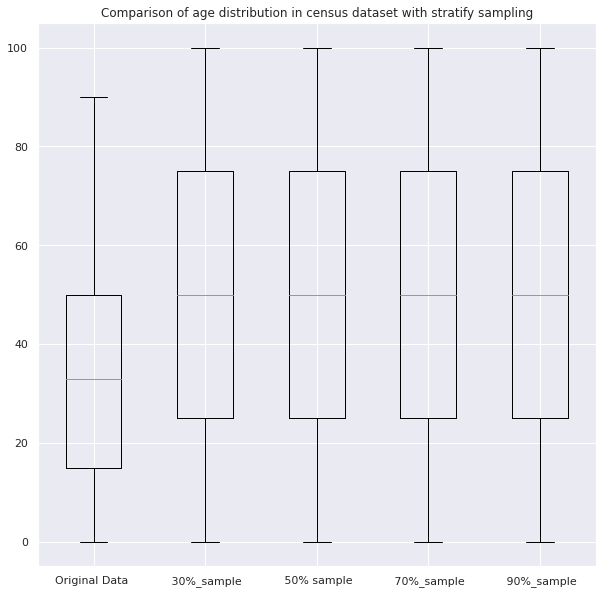

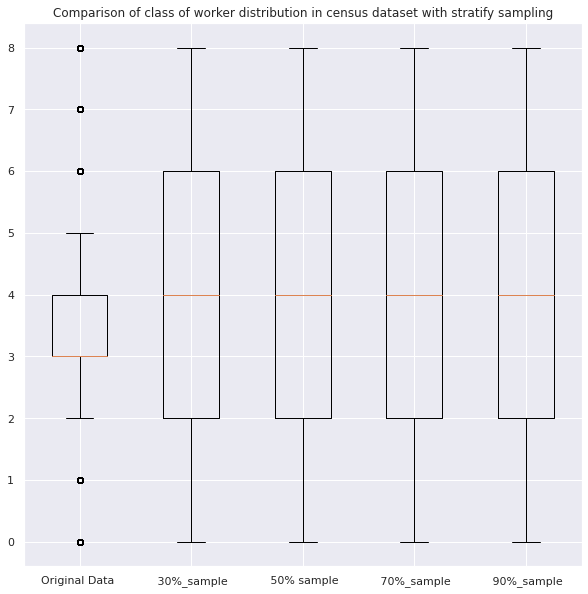

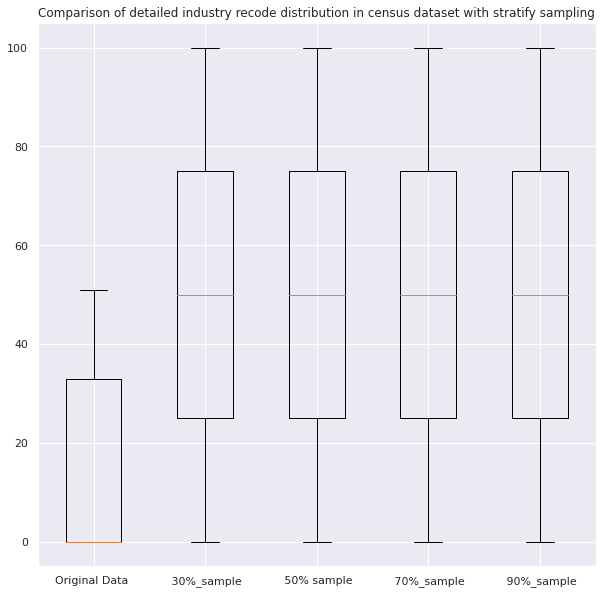

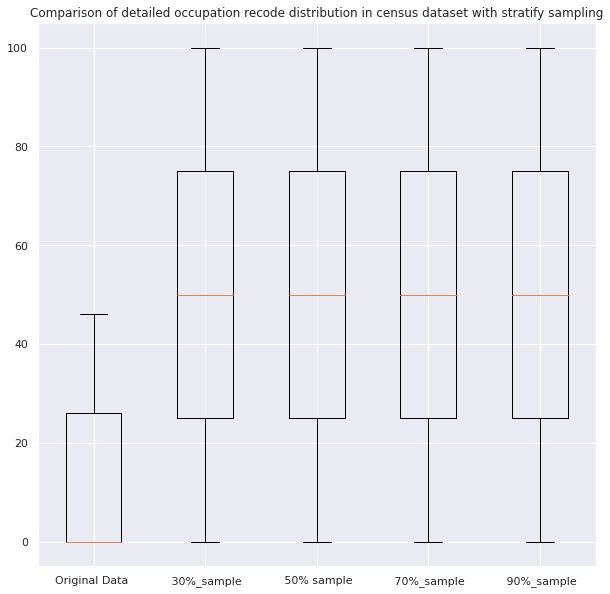

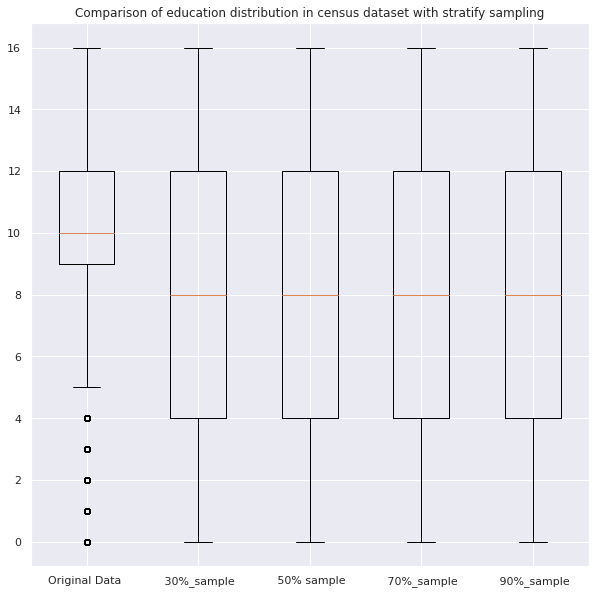

...

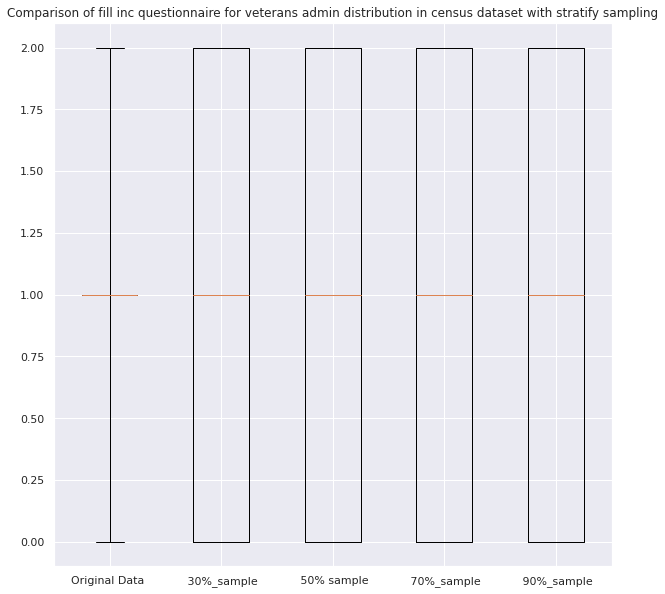

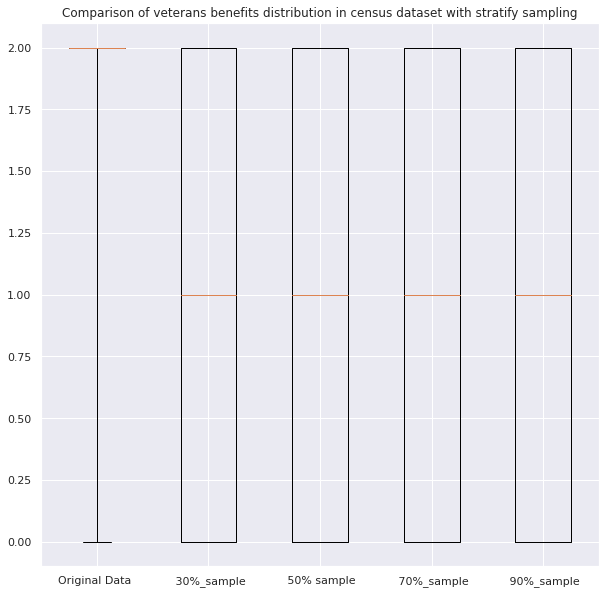

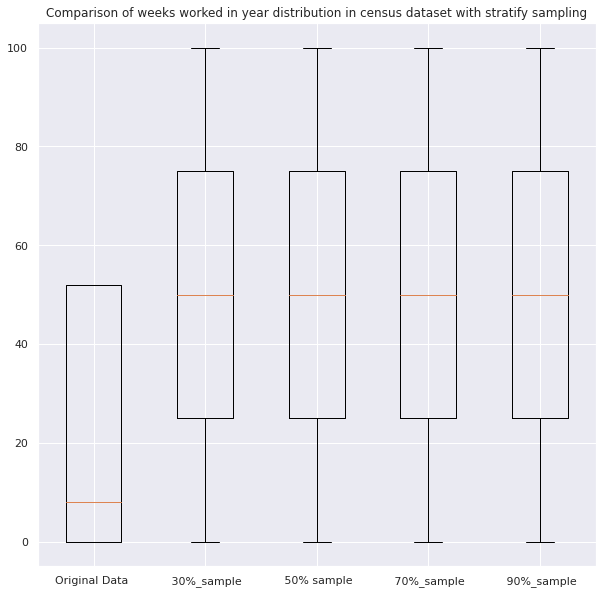

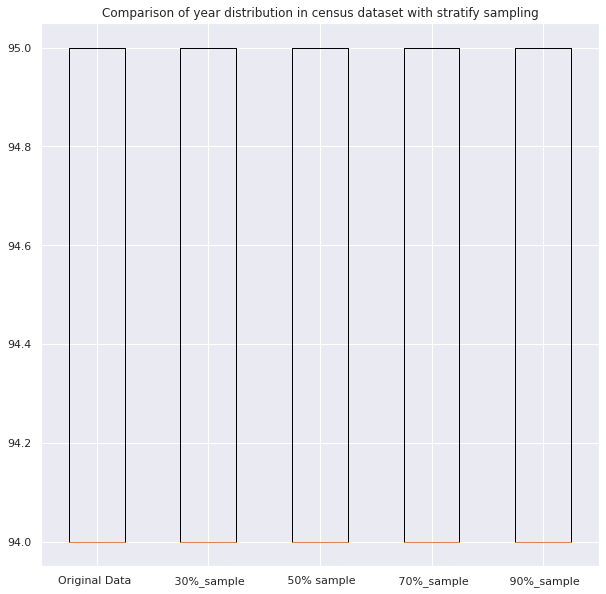

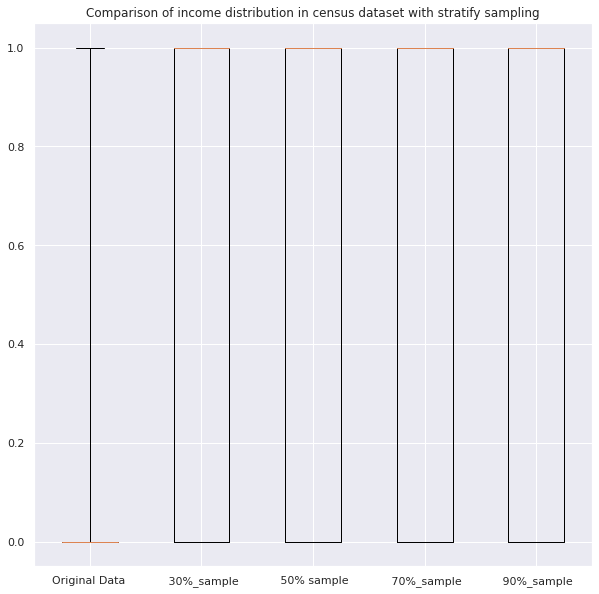

In [ ]:
plot_box_plots(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS,
               "stratify", ds_sample_data_20,ds_sample_data_20,ds_sample_data_20,ds_sample_data_20 )

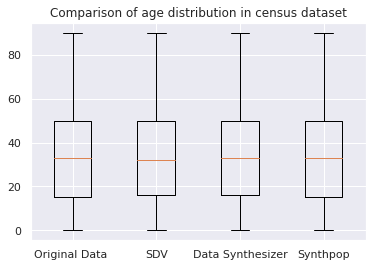

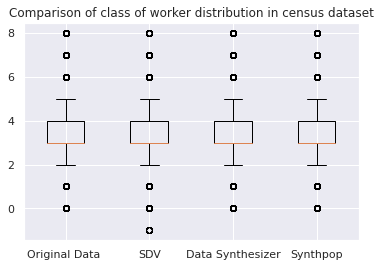

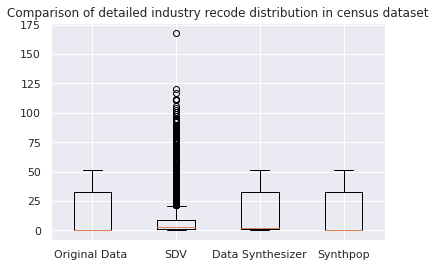

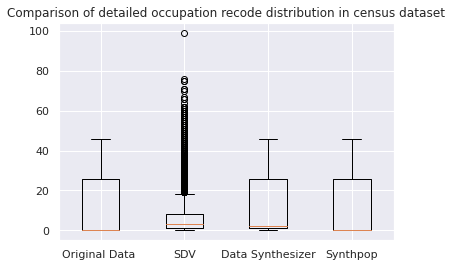

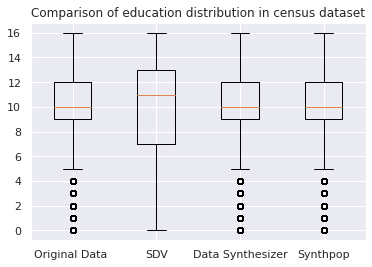

...

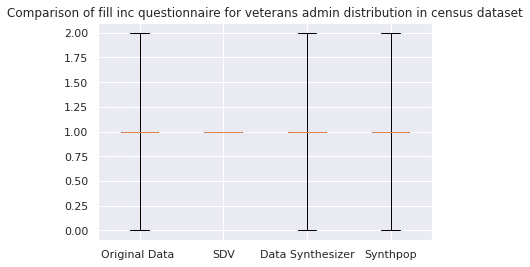

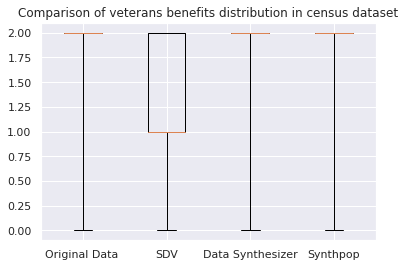

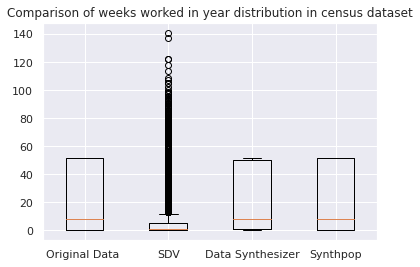

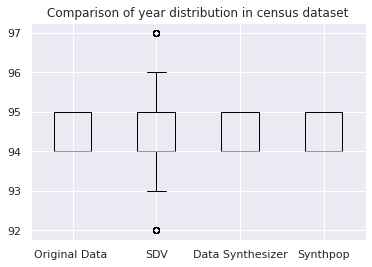

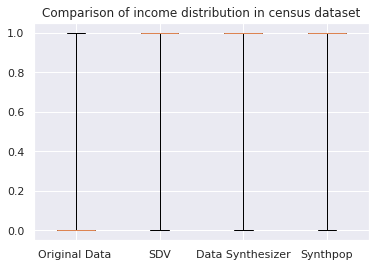

In [ ]:
plot_box_plots(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.CENSUS)

## Metadata Analysis

In [ ]:
sampleMode = "random"
synthesizerName = "SDV"
path = f"{relativePath}sample data/synthetic_data_vault/census/{sampleMode}"
synthesizerMode = "GaussianCopula"


metadataAnalysis.synTimelineGeneration(sampleMode, synthesizerName, path, synthesizerMode)

In [ ]:
sampleMode = "stratify"
synthesizerName = "SDV"
path = f"{relativePath}sample data/synthetic_data_vault/census/{sampleMode}"
synthesizerMode = "GaussianCopula"


metadataAnalysis.synTimelineGeneration(sampleMode, synthesizerName, path, synthesizerMode)

In [ ]:
sampleMode = "random"
synthesizerName = "DS"
path = f"{relativePath}sample data/data_synthesizer/census/{sampleMode}"
synthesizerMode = "correlated"


metadataAnalysis.synTimelineGeneration(sampleMode, synthesizerName, path, synthesizerMode)

In [ ]:
sampleMode = "stratify"
synthesizerName = "DS"
path = f"{relativePath}/sample data/data_synthesizer/census/{sampleMode}"
synthesizerMode = "correlated"


metadataAnalysis.synTimelineGeneration(sampleMode, synthesizerName, path, synthesizerMode)

In [ ]:
metadataAnalysis.metaSynth("random")
metadataAnalysis.metaSynth("stratify")

In [ ]:
dfFinal = metadataAnalysis.finalMetaDataFrame()

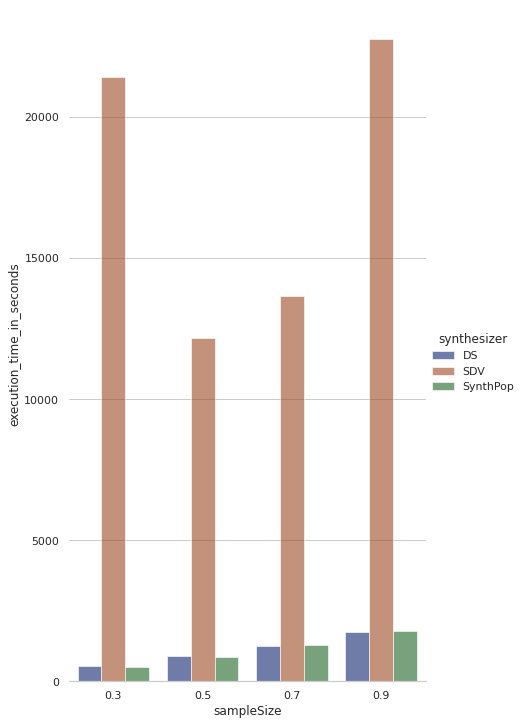

In [ ]:
metadataAnalysis.plotAccuracy("random", dfFinal)

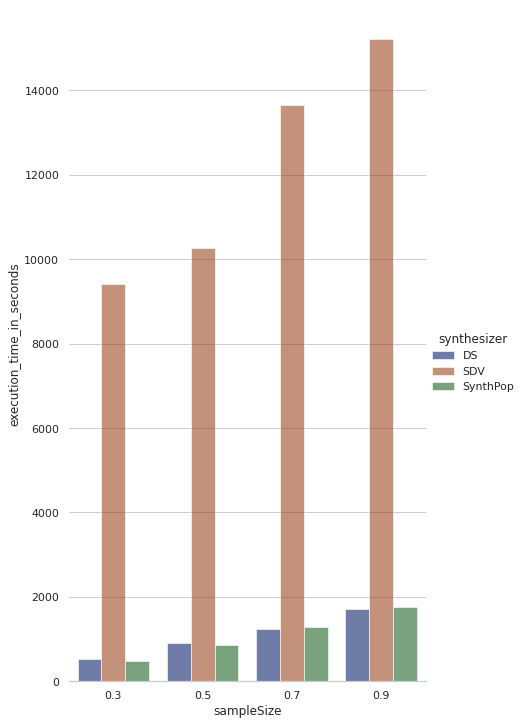

In [ ]:
metadataAnalysis.plotAccuracy("stratify", dfFinal)

### Forest

In [ ]:
# Census Data CSV's
DS_DEFAULT_MODE = 'random'
SDV_DEFAULT_MODEL = 'GaussianCopula'

original_data = pd.read_csv(f'{PATH_TO_ORIGINAL_DATASETS}/{DatasetNames.FOREST}/data.csv', names=FOREST_COLUMNS_RENAMED)
# original_data = label_encode(original_data)

ds_data=pd.read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.DATA_SYNTHESIZER}/{DatasetNames.FOREST}/{DS_DEFAULT_MODE}/synthetic_data.csv')
sdv_data=pd.read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.SDV}/{DatasetNames.FOREST}/{SDV_DEFAULT_MODEL}/synthetic_data.csv')
synthpop_data=pd.read_csv(f'{PATH_TO_SYNTHESIZED_DATASETS}/{SynthetizationApproaches.SYNTHPOP}/{DatasetNames.FOREST}/synthetic_data.csv')


#### Compare column distributions

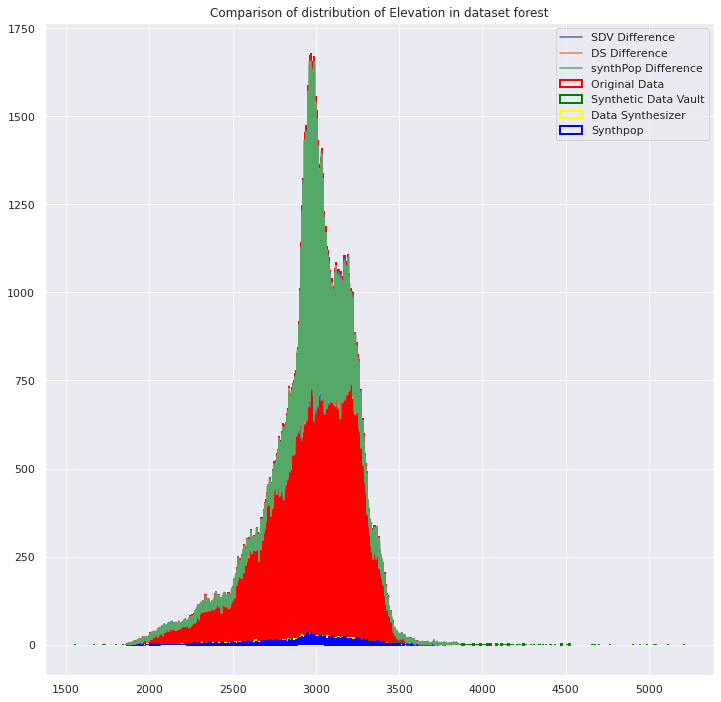

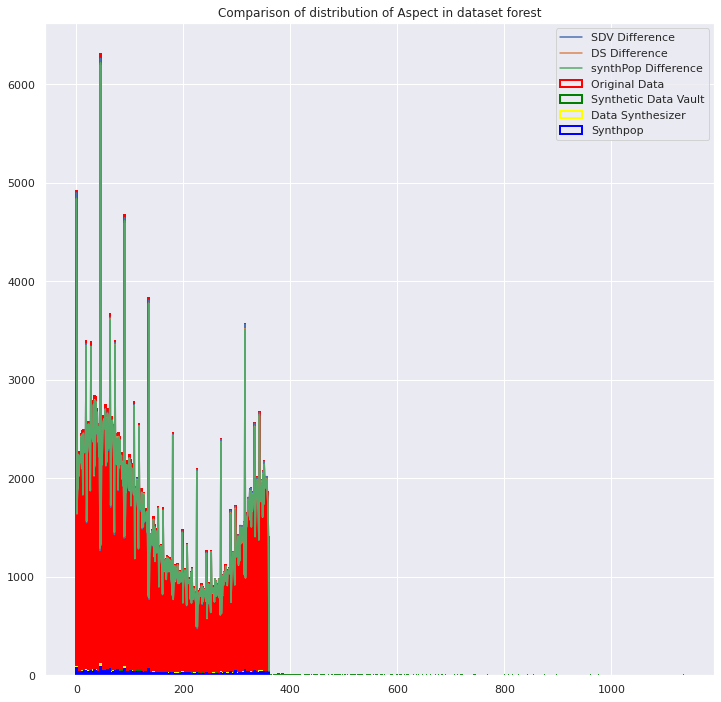

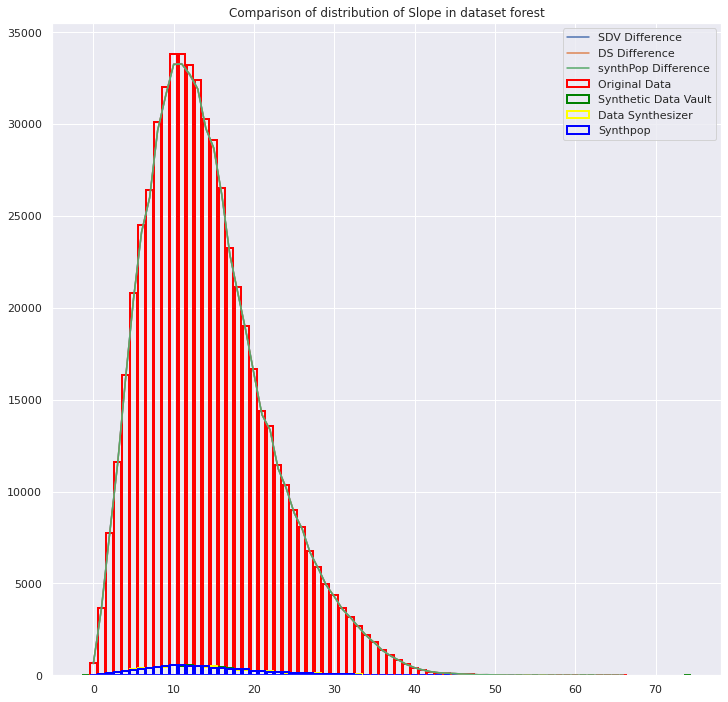

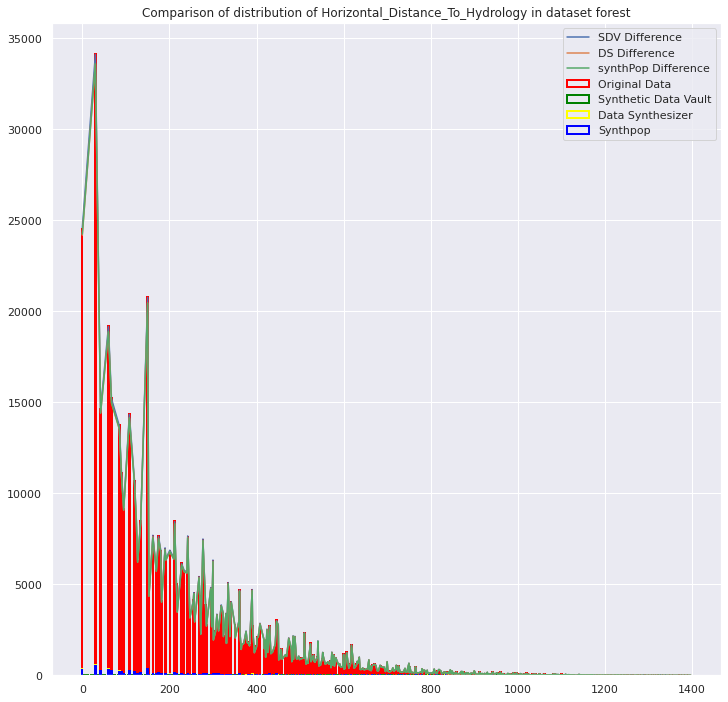

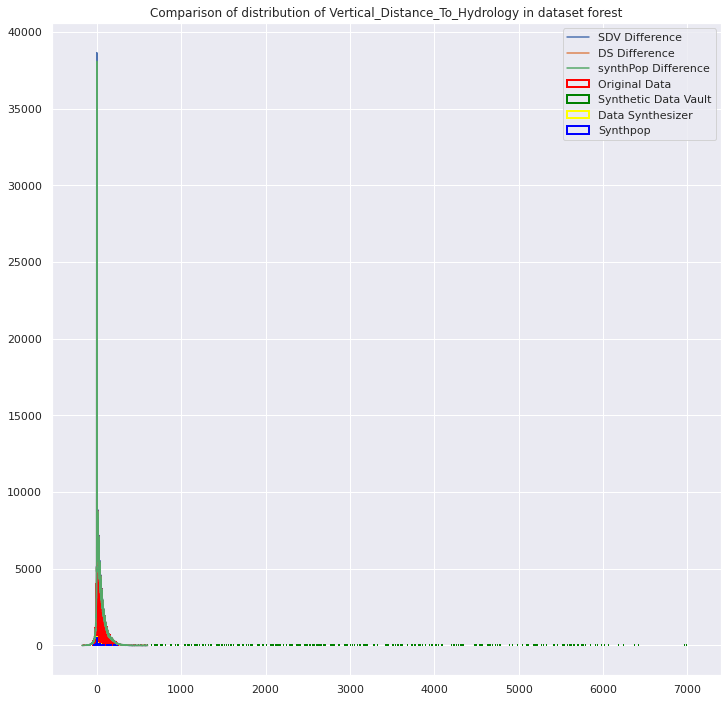

...

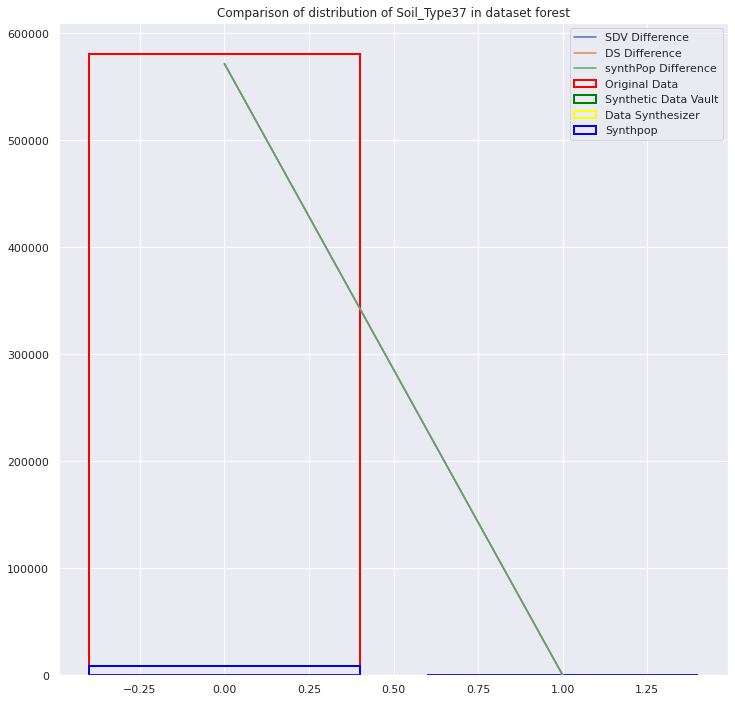

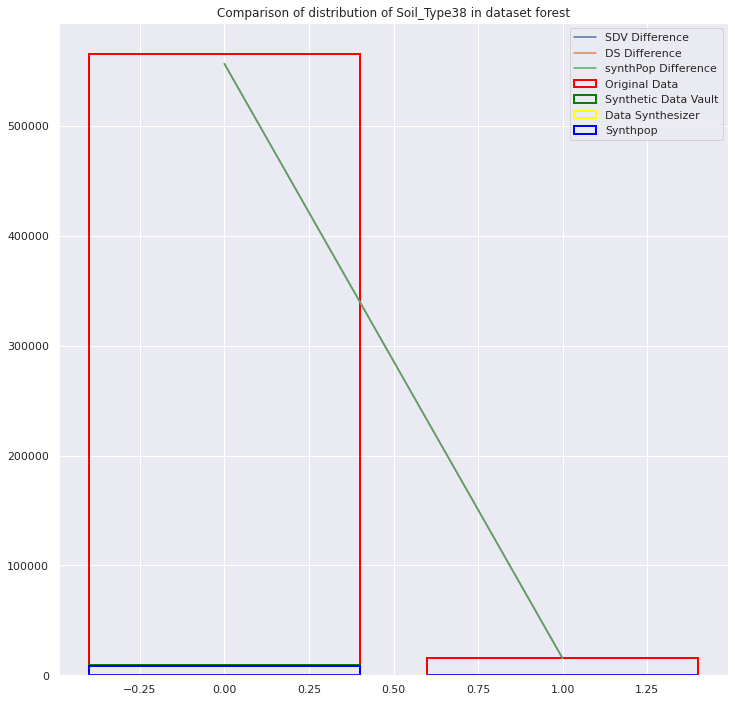

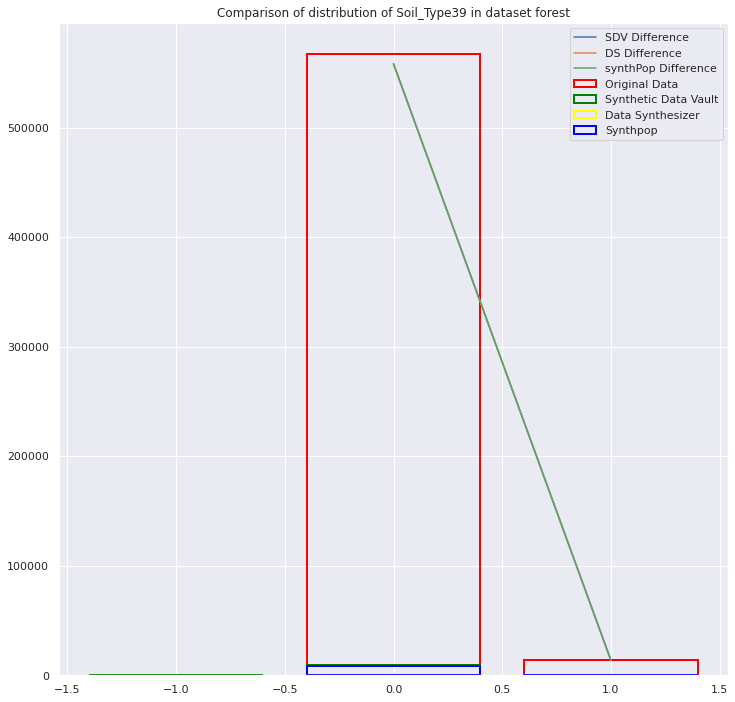

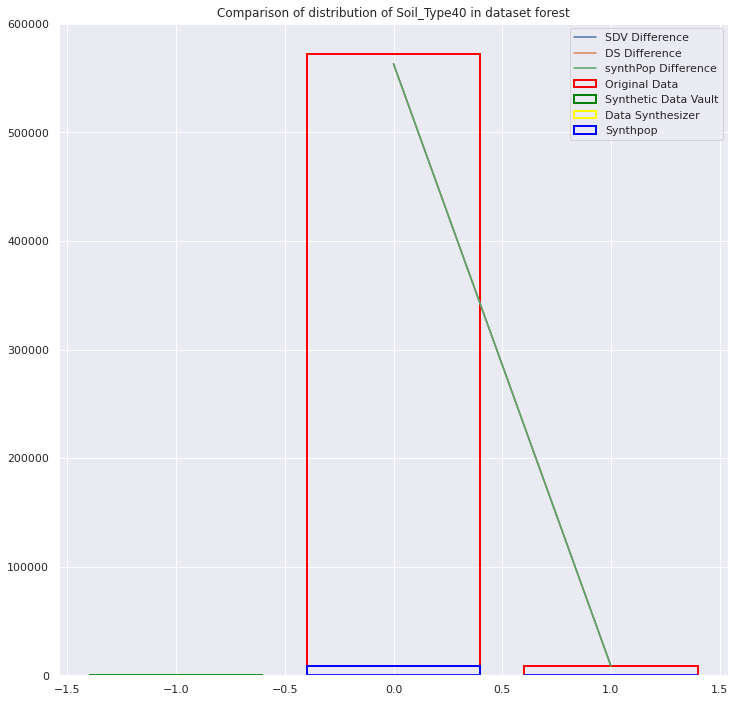

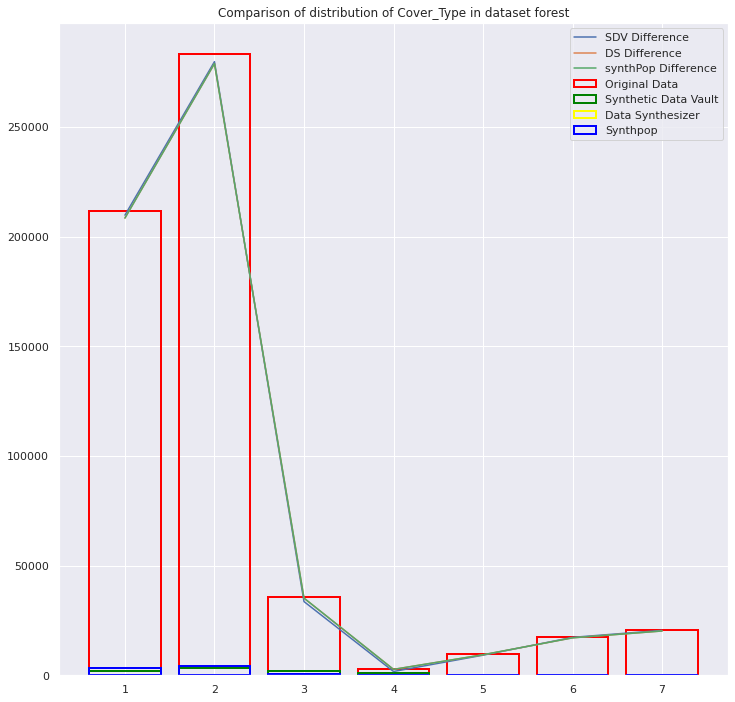

In [ ]:
plot_distribution_comparisons(original_data=original_data, sdv_data=sdv_data, ds_data=ds_data, 
                              synthpop_data=synthpop_data, dataset_name=DatasetNames.FOREST)

#### Compare heatmaps

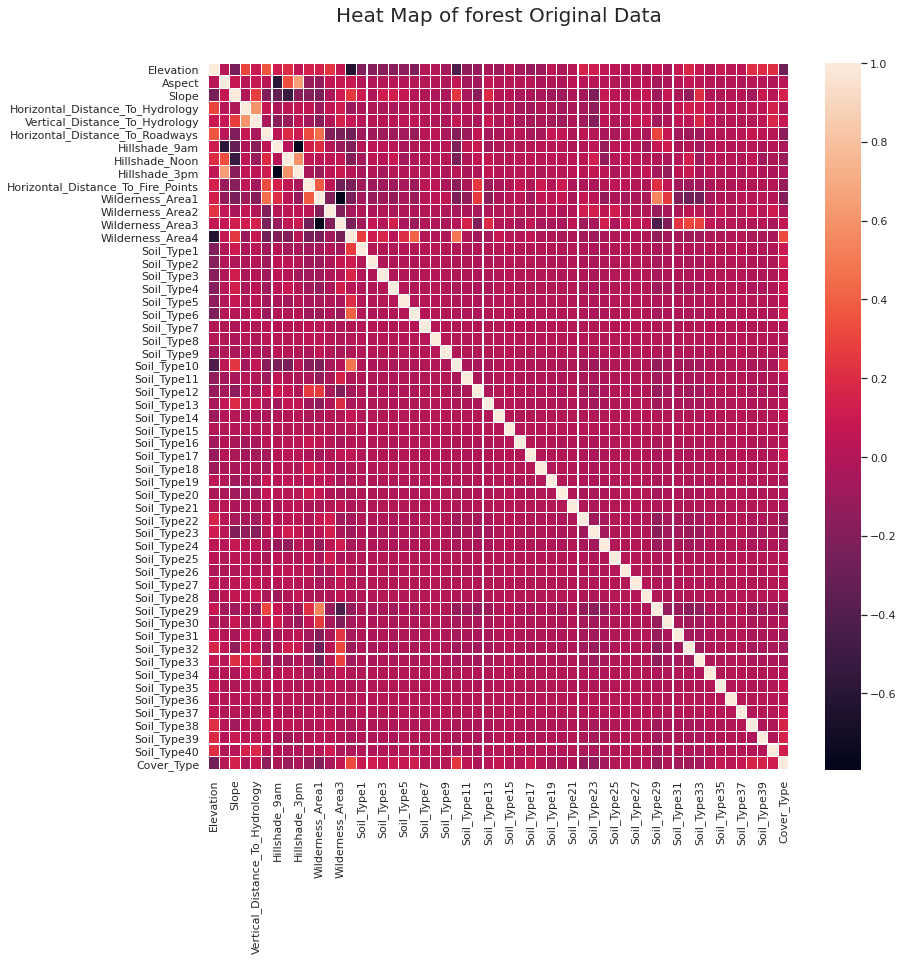

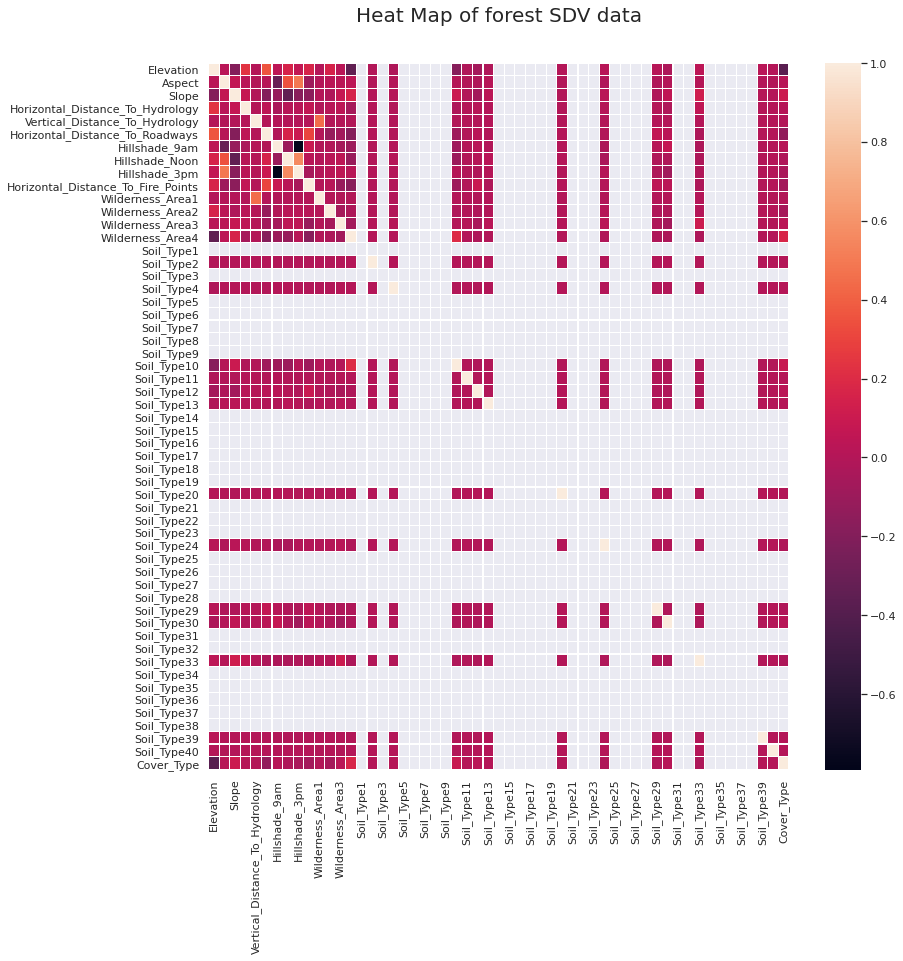

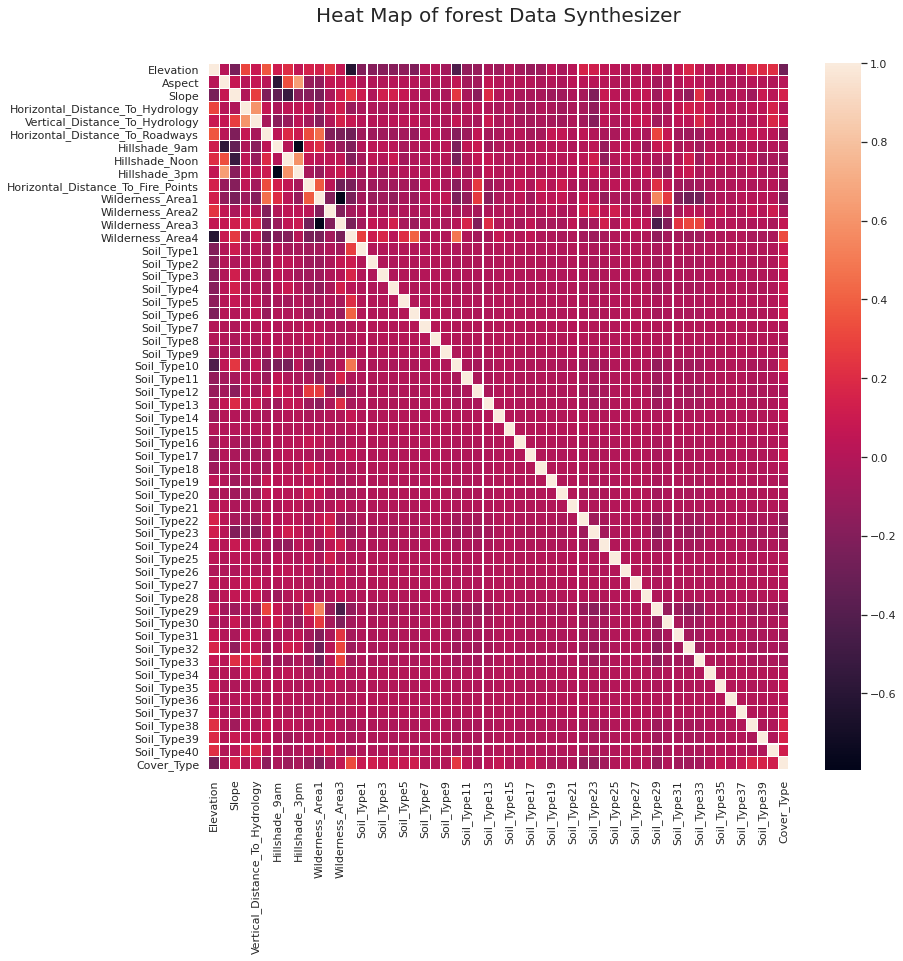

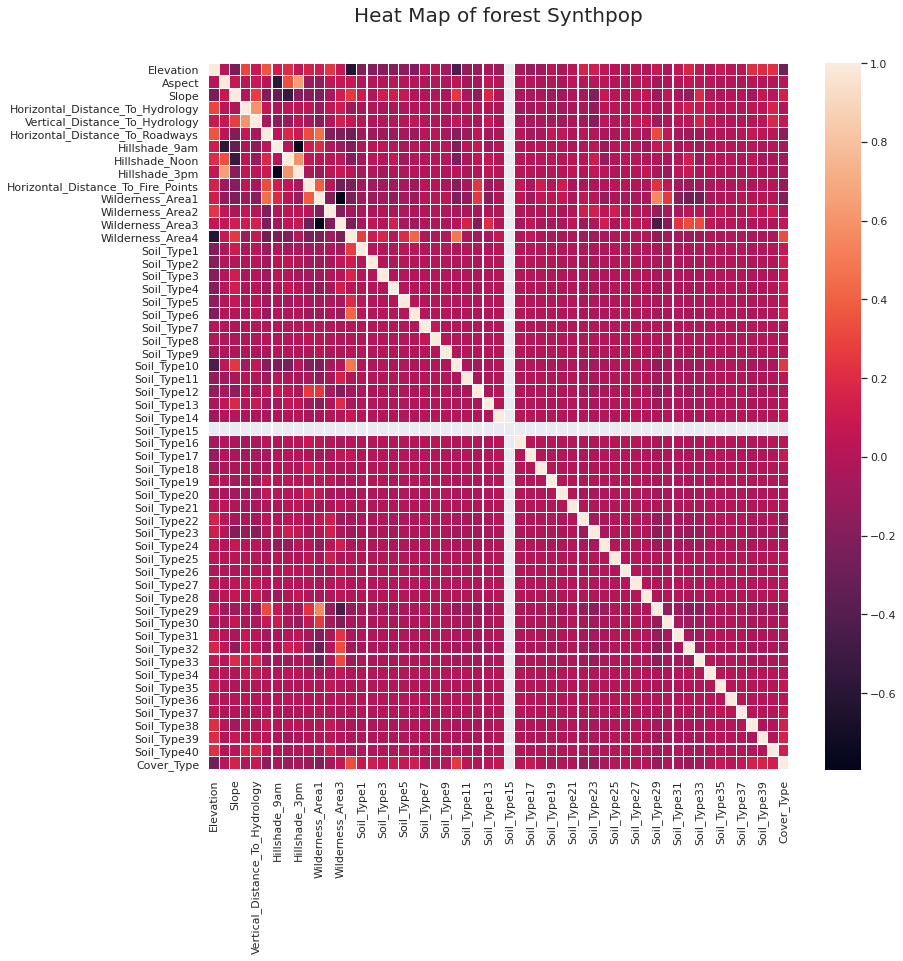

In [ ]:
plot_heat_maps(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.FOREST)

#### Compare distributions with boxplots

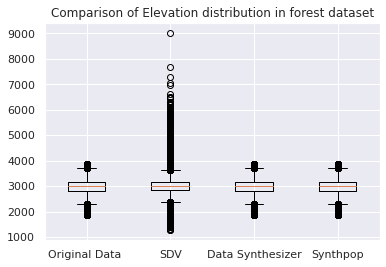

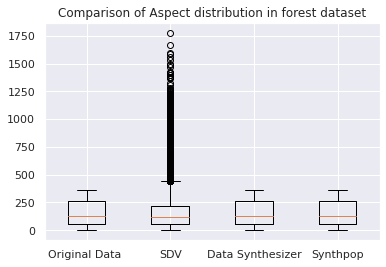

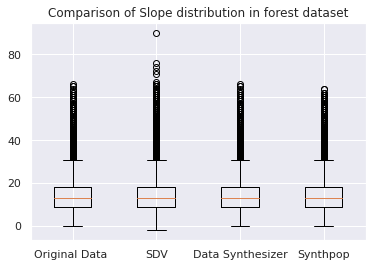

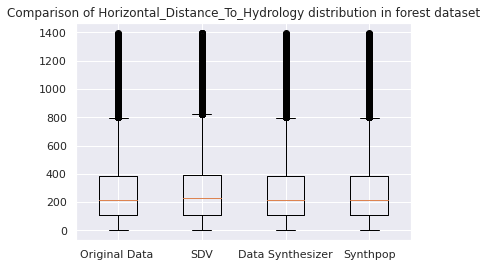

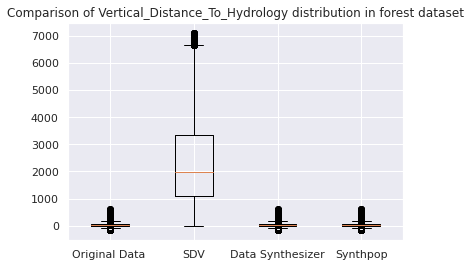

...

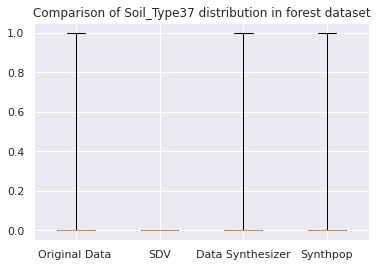

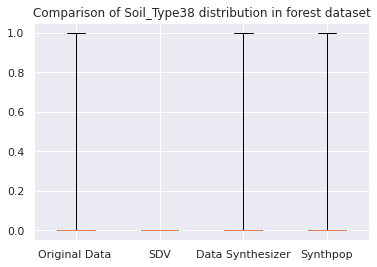

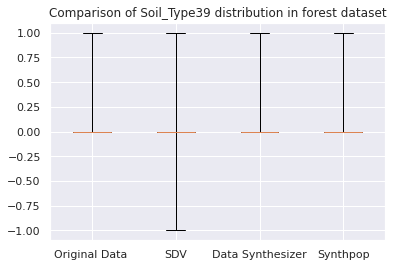

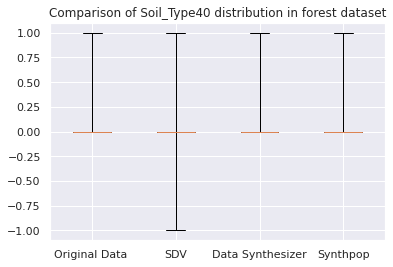

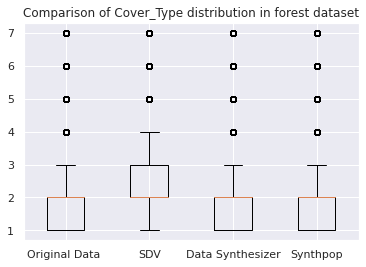

In [ ]:
plot_box_plots(original_data, sdv_data, ds_data, synthpop_data, DatasetNames.FOREST)